# Table of Contents

[Tissue Plots](#tissue_plots)

[Cell Count Plots](#cell_count_plots)

[esophagus](#esophagus)

[liver](#liver) 

[lung](#lung) 

[blood](#blood)

[bladder](#bladder) 

[neurons](#neurons) 

[endometrium](#endometrium)

[colon](#colon)

[skin](#skin)

In [1]:
import numpy as np
import pandas as pd
from matplotlib import style
from matplotlib import pyplot as plt
import seaborn as sns
import pyranges as pr

from specificUtil import *
from util import *

hg38exon_regions = pr.read_bed('BEDfiles_GenomicRegions/hg38CodingRegionsOfExons.bed')
hg19exon_regions = pr.read_bed('BEDfiles_GenomicRegions/hg19CodingRegionsOfExons.bed')

#This allows dataframes to be seen better when I use the head() command
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', -1)

def overlap(q_st, q_end, res_st, res_end):
    o  = min(q_end, res_end)-max(q_st, res_st)
    return o

def gencode_all_known_genes(a, tb):
    genes = []

    try:
        for region in tb.fetch(a['chr'], int(a['start']), int(a['end'])): #fetch(chromosome, start_pos, end_pos) for chromosome, 'chr' proceeds the number; start_pos != end_pos
            if region:
                r = region.split('\t')
                overlap_len = overlap(int(a['start']), int(a['end']), int(r[1]), int(r[2]))
                ret_val = '{}({})'.format(r[3], np.round(overlap_len/float(int(a['end'])-int(a['start']))*100, 2)) ### Percentage of the input interval that overlap with the gene
                genes.append(ret_val) 

        if len(genes)>0:
            return ";".join(genes)
        else:
            return "NA(0)"
    except ValueError:
        return "NA(0)"



In [2]:
#Now, we need to create dataframes of the CGC mutations, so we can cross-refence them with our mutations of interest

import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', -1)

# I need to remove all the mutations that are considered neutral and Tier2 in the CGC coding mutations list
#First, I need to get the file into a dataframe

all_cosmic19 = pd.read_csv('./CosmicMutations_hg19.tsv', sep = '\t', header = 0) # sep allows for you to put tsv files in dataframe; header is the row number in the spreadsheet that the column labels are made for the dataframe
all_cosmic19.columns = all_cosmic19.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '') #This makes the column names lowercase, replaces spaces with hyphens, removes parentheses, and removes the whitespaces on the left and right sides.
all_cosmic19 = all_cosmic19.dropna(subset = ['mutation_genome_position']) #If a mutation has no position, that row is deleted.
all_cosmic19 = all_cosmic19.dropna(subset = ['hgvsg']) #If an entry in the hgvsg column is empty, that row is deleted. 
#all_cosmic.rename(columns = {"gene_name": "gene"})

#Considering that the genome position and the mutation conversion are the means by which we will cross reference,
#we need to get the format such that they can be compared.
#In the cosmic data frame, we can make "location", 'chr', and "change" columns
all_cosmic19.insert(20, 'change', all_cosmic19.hgvsg.str[-3:]) #change column shows the mutation conversion
all_cosmic19.insert(27, 'chr', 'chr' + all_cosmic19.mutation_genome_position.str.partition(':')[0]) #This is the column for the chromosome number
all_cosmic19.insert(28, 'end', all_cosmic19.mutation_genome_position.str.partition('-')[2].astype('int')) #This is the end position
all_cosmic19.insert(28, 'start', all_cosmic19.mutation_genome_position.str.partition(':')[2].str.partition('-')[0].astype('int')) #This is the start position
all_cosmic19.insert(1, 'gene', all_cosmic19.gene_name)
#.astype(int, errors = 'ignore')
#print(len(all_cosmic19[all_cosmic19.location == 'NaN']))


# Now I need to eliminate duplicated mutations.
cosmic19_mut = all_cosmic19.drop_duplicates(subset = ['mutation_genome_position', 'gene_name', 'fathmm_score', 'change'], keep = 'first').sort_values(by = ['gene','end']).sort_values(by = ['mutation_genome_position'])

#You can make a dataframe with a particular criteria.
tier1_cosmic = cosmic19_mut.drop(cosmic19_mut[(cosmic19_mut.tier == 2)].index)

#Because there are some that are mutations that have FATHMM scores rendering them neither 'pathogenic' nor 'neutral',
#Here, we create 3 different dataframes based on whether the mutations are pathogenic, neutral(non-damaging), or unknown
pathogenic_cosmic19 = cosmic19_mut[cosmic19_mut.fathmm_prediction == 'PATHOGENIC']

neutral_cosmic19 = cosmic19_mut[cosmic19_mut.fathmm_prediction == 'NEUTRAL']
unknown_cosmic19 = pd.concat([cosmic19_mut,pathogenic_cosmic19,neutral_cosmic19]).drop_duplicates(keep=False)
#In unknown_cosmic19, there are 54202 mutations that do not start and end at the same location (indels probably)
#all pathogenic and neutral mutations have start and end positions and they must be the same

#Some mutations show up in different tissues. We only need it once in the data frame to cross with mutations of interest
cosmic19_snvIndices = []
for row in cosmic19_mut.itertuples():
    if '>' in row[22]:
        cosmic19_snvIndices.append(row[0])        
cosmic19_snvs = cosmic19_mut.loc[cosmic19_snvIndices]
cosmic19_snvsLight = cosmic19_snvs.drop_duplicates(subset = ['chr', 'start', 'gene', 'change'], keep = 'first')

print(len(all_cosmic19), len(cosmic19_mut), len(pathogenic_cosmic19), len(neutral_cosmic19), len(unknown_cosmic19))
cosmic19_mut.head()

1491696 961879 261044 593088 107747


,gene_name,gene,accession_number,gene_cds_length,hgnc_id,sample_name,id_sample,id_tumour,primary_site,site_subtype_1,site_subtype_2,site_subtype_3,primary_histology,histology_subtype_1,histology_subtype_2,histology_subtype_3,genome-wide_screen,genomic_mutation_id,legacy_mutation_id,mutation_id,mutation_cds,change,mutation_aa,mutation_description,mutation_zygosity,loh,grch,mutation_genome_position,chr,start,end,mutation_strand,snp,resistance_mutation,fathmm_prediction,fathmm_score,mutation_somatic_status,pubmed_pmid,id_study,sample_type,tumour_origin,age,tier,hgvsp,hgvsc,hgvsg
191743,TLX1,TLX1,ENST00000370196.6,3910,5056,C0053T,2197756,2066034,kidney,NS,NS,NS,NS,NS,NS,NS,y,COSV64622985,COSN10058025,36981199,c.-1664G>T,G>T,p.?,Unknown,NaN,NaN,37.0,10:102889635-102889635,chr10,102889635,102889635,+,n,-,NEUTRAL,0.02495,Confirmed somatic variant,NaN,588.0,NS,NS,NaN,1,NaN,ENST00000370196.6:c.-1664G>T,10:g.102889635G>T
1399578,TLX1,TLX1,ENST00000370196.6,3910,5056,ICGC_GBM26_tumor,2634846,2495242,central_nervous_system,brain,NS,NS,primitive_neuroectodermal_tumour-medulloblastoma,NS,NS,NS,y,COSV64622833,COSN24836538,36979411,c.-1008C>G,C>G,p.?,Unknown,NaN,NaN,37.0,10:102890291-102890291,chr10,102890291,102890291,+,n,-,NaN,0.66049,Confirmed somatic variant,NaN,379.0,NS,recurrent,NaN,1,NaN,ENST00000370196.6:c.-1008C>G,10:g.102890291C>G
582411,TLX1,TLX1,ENST00000370196.6,3910,5056,8068564,2196811,2065089,pancreas,NS,NS,NS,carcinoma,ductal_carcinoma,NS,NS,y,COSV64622712,COSN6955647,36980492,c.-1003C>T,C>T,p.?,Unknown,NaN,NaN,37.0,10:102890296-102890296,chr10,102890296,102890296,+,n,-,NEUTRAL,0.08515,Confirmed somatic variant,NaN,328.0,NS,NS,NaN,1,NaN,ENST00000370196.6:c.-1003C>T,10:g.102890296C>T
638689,TLX1,TLX1,ENST00000370196.6,3910,5056,8067246,2197164,2065442,pancreas,NS,NS,NS,carcinoma,ductal_carcinoma,NS,NS,y,COSV64622456,COSN6955648,36980137,c.-890G>A,G>A,p.?,Unknown,NaN,NaN,37.0,10:102890409-102890409,chr10,102890409,102890409,+,n,-,NEUTRAL,0.10331,Confirmed somatic variant,NaN,328.0,NS,NS,NaN,1,NaN,ENST00000370196.6:c.-890G>A,10:g.102890409G>A
526983,TLX1,TLX1,ENST00000370196.6,3910,5056,PD4959a,1463635,1387487,breast,NS,NS,NS,carcinoma,ductal_carcinoma,NS,NS,y,COSV64622642,COSN21305406,36980580,c.-612G>C,G>C,p.?,Unknown,NaN,NaN,37.0,10:102890687-102890687,chr10,102890687,102890687,+,n,-,NEUTRAL,0.25361,Confirmed somatic variant,NaN,652.0,NS,primary,NaN,1,NaN,ENST00000370196.6:c.-612G>C,10:g.102890687G>C


In [3]:
#Now, we need to create dataframes of the CGC mutations, so we can cross-refence them with our mutations of interest

import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', -1)

# I need to remove all the mutations that are considered neutral and Tier2 in the CGC coding mutations list
#First, I need to get the file into a dataframe

all_cosmic38 = pd.read_csv('./CosmicMutations_hg38.tsv', sep = '\t', header = 0) # sep allows for you to put tsv files in dataframe; header is the row number in the spreadsheet that the column labels are made for the dataframe
all_cosmic38.columns = all_cosmic38.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '') #This makes the column names lowercase, replaces spaces with hyphens, removes parentheses, and removes the whitespaces on the left and right sides.
all_cosmic38 = all_cosmic38.dropna(subset = ['mutation_genome_position']) #If a mutation has no position, that row is deleted.
all_cosmic38 = all_cosmic38.dropna(subset = ['hgvsg']) #If an entry in the hgvsg column is empty, that row is deleted. 
#all_cosmic.rename(columns = {"gene_name": "gene"})

#Considering that the genome position and the mutation conversion are the means by which we will cross reference,
#we need to get the format such that they can be compared.
#In the cosmic data frame, we can make "location", 'chr', and "change" columns
all_cosmic38.insert(20, 'change', all_cosmic38.hgvsg.str[-3:]) #change column shows the mutation conversion
all_cosmic38.insert(27, 'chr', 'chr' + all_cosmic38.mutation_genome_position.str.partition(':')[0]) #This is the column for the chromosome number
all_cosmic38.insert(28, 'end', all_cosmic38.mutation_genome_position.str.partition('-')[2].astype('int')) #This is the end position
all_cosmic38.insert(28, 'start', all_cosmic38.mutation_genome_position.str.partition(':')[2].str.partition('-')[0].astype('int')) #This is the start position
all_cosmic38.insert(1, 'gene', all_cosmic38.gene_name)
#.astype(int, errors = 'ignore')
#print(len(all_cosmic38[all_cosmic38.location == 'NaN']))


# Now I need to eliminate duplicated mutations.
cosmic38_mut = all_cosmic38.drop_duplicates(subset = ['mutation_genome_position', 'gene_name', 'fathmm_score', 'change'], keep = 'first').sort_values(by = ['gene','end']).sort_values(by = ['mutation_genome_position'])

#You can make a dataframe with a particular criteria.
tier1_cosmic = cosmic38_mut.drop(cosmic38_mut[(cosmic38_mut.tier == 2)].index)

#Because there are some that are mutations that have FATHMM scores rendering them neither 'pathogenic' nor 'neutral',
#Here, we create 3 different dataframes based on whether the mutations are pathogenic, neutral(non-damaging), or unknown
pathogenic_cosmic38 = cosmic38_mut[cosmic38_mut.fathmm_prediction == 'PATHOGENIC']

neutral_cosmic38 = cosmic38_mut[cosmic38_mut.fathmm_prediction == 'NEUTRAL']
unknown_cosmic38 = pd.concat([cosmic38_mut,pathogenic_cosmic38,neutral_cosmic38]).drop_duplicates(keep=False)
#In unknown_cosmic38, there are 54202 mutations that do not start and end at the same location (indels probably)
#all pathogenic and neutral mutations have start and end positions and they must be the same

#Some mutations show up in different tissues. We only need it once in the data frame to cross with mutations of interest
cosmic38_snvIndices = []
for row in cosmic38_mut.itertuples():
    if '>' in row[22]:
        cosmic38_snvIndices.append(row[0])        
cosmic38_snvs = cosmic38_mut.loc[cosmic38_snvIndices]
cosmic38_snvsLight = cosmic38_snvs.drop_duplicates(subset = ['chr', 'start', 'gene', 'change'], keep = 'first')

print(len(all_cosmic38), len(cosmic38_mut), len(pathogenic_cosmic38), len(neutral_cosmic38), len(unknown_cosmic38))
cosmic38_mut.head()

1489927 961112 260993 592204 107915


,gene_name,gene,accession_number,gene_cds_length,hgnc_id,sample_name,id_sample,id_tumour,primary_site,site_subtype_1,site_subtype_2,site_subtype_3,primary_histology,histology_subtype_1,histology_subtype_2,histology_subtype_3,genome-wide_screen,genomic_mutation_id,legacy_mutation_id,mutation_id,mutation_cds,change,mutation_aa,mutation_description,mutation_zygosity,loh,grch,mutation_genome_position,chr,start,end,mutation_strand,snp,resistance_mutation,fathmm_prediction,fathmm_score,mutation_somatic_status,pubmed_pmid,id_study,sample_type,tumour_origin,age,tier,hgvsp,hgvsc,hgvsg
1210998,TLX1,TLX1,ENST00000370196.10,2906,5056,ICGC_GBM26_tumor,2634846,2495242,central_nervous_system,brain,NS,NS,primitive_neuroectodermal_tumour-medulloblastoma,NS,NS,NS,y,COSV64622833,COSN24836538,170082857,c.-1008C>G,C>G,p.?,Unknown,NaN,NaN,38.0,10:101130534-101130534,chr10,101130534,101130534,+,n,-,NaN,0.66049,Confirmed somatic variant,NaN,379.0,NS,recurrent,NaN,1,NaN,ENST00000370196.10:c.-1008C>G,10:g.101130534C>G
227763,TLX1,TLX1,ENST00000370196.10,2906,5056,8068564,2196811,2065089,pancreas,NS,NS,NS,carcinoma,ductal_carcinoma,NS,NS,y,COSV64622712,COSN6955647,96670038,c.-1003C>T,C>T,p.?,Unknown,NaN,NaN,38.0,10:101130539-101130539,chr10,101130539,101130539,+,n,-,NEUTRAL,0.08515,Confirmed somatic variant,NaN,328.0,NS,NS,NaN,1,NaN,ENST00000370196.10:c.-1003C>T,10:g.101130539C>T
444392,TLX1,TLX1,ENST00000370196.10,2906,5056,8067246,2197164,2065442,pancreas,NS,NS,NS,carcinoma,ductal_carcinoma,NS,NS,y,COSV64622456,COSN6955648,170083259,c.-890G>A,G>A,p.?,Unknown,NaN,NaN,38.0,10:101130652-101130652,chr10,101130652,101130652,+,n,-,NEUTRAL,0.10331,Confirmed somatic variant,NaN,328.0,NS,NS,NaN,1,NaN,ENST00000370196.10:c.-890G>A,10:g.101130652G>A
760398,TLX1,TLX1,ENST00000370196.10,2906,5056,PD4959a,1463635,1387487,breast,NS,NS,NS,carcinoma,ductal_carcinoma,NS,NS,y,COSV64622642,COSN21305406,96670087,c.-612G>C,G>C,p.?,Unknown,NaN,NaN,38.0,10:101130930-101130930,chr10,101130930,101130930,+,n,-,NEUTRAL,0.25361,Confirmed somatic variant,NaN,652.0,NS,primary,NaN,1,NaN,ENST00000370196.10:c.-612G>C,10:g.101130930G>C
1096996,TLX1,TLX1,ENST00000370196.10,2906,5056,AOCS-086-3-2,2186066,2054363,ovary,NS,NS,NS,carcinoma,mixed_adenosquamous_carcinoma,NS,NS,y,COSV64622821,COSN8525205,170082827,c.-607C>G,C>G,p.?,Unknown,NaN,NaN,38.0,10:101130935-101130935,chr10,101130935,101130935,+,n,-,NEUTRAL,0.48877,Confirmed somatic variant,NaN,585.0,NS,NS,NaN,1,NaN,ENST00000370196.10:c.-607C>G,10:g.101130935C>G


In [6]:
KMT2C_cosmic = cosmic38_snvsLight[cosmic38_snvsLight.gene == 'KMT2C']
print(len(KMT2C_cosmic), len(cosmic38_snvsLight))

5766 881999


In [2]:
#Make Excel documents of COSMIC mutations by genes
#cosmic38_mut.to_excel('COSMIC_mut_hg38.xlsx')

In [4]:
#Getting the list of genes from the Cancer Gene Census
import pandas as pd

CGC_overview = pd.read_csv('CGC_genes.csv', sep = '\t')
CGC_genes = []
for row in CGC_overview.itertuples():
    CGC_genes.append(row[1])

print(len(CGC_genes))

#HMGN2P46, IGH, IGK, IGL, MALAT1, TRA, TRB, and TRD are genes listed in the CGC overview, but they are not
# genes with coding mutations in the file download.

723


# Get Coding Mutations

In [5]:
hg38exon_regions = pr.read_bed('BEDfiles_GenomicRegions/hg38CodingRegionsOfExons.bed')
hg19exon_regions = pr.read_bed('BEDfiles_GenomicRegions/hg19CodingRegionsOfExons.bed')
hg38exon_regions.head()

,Chromosome,Start,End,Name,Score,Strand
0,chr1,65564,65573,ENST00000641515.2_cds_1_0_chr1_65565_f,0,+
1,chr1,69036,70008,ENST00000641515.2_cds_2_0_chr1_69037_f,0,+
2,chr1,69090,70008,ENST00000335137.4_cds_0_0_chr1_69091_f,0,+
3,chr1,924431,924948,ENST00000420190.6_cds_0_0_chr1_924432_f,0,+
4,chr1,925921,926013,ENST00000420190.6_cds_1_0_chr1_925922_f,0,+
5,chr1,930154,930336,ENST00000420190.6_cds_2_0_chr1_930155_f,0,+
6,chr1,931038,931089,ENST00000420190.6_cds_3_0_chr1_931039_f,0,+
7,chr1,935771,935896,ENST00000420190.6_cds_4_0_chr1_935772_f,0,+


In [6]:
#You need a Chromosome, Start, and End column to use the overlap method in PyRanges

liver_muts = pd.read_csv('Mutations_Paper/liver/all_mutations_normal_cancer_snv_indels.csv')
liver_muts = liver_muts.rename(columns = {'donor': 'subject', 'pos': 'Start', 'chrom': 'Chromosome'})
liver_muts = liver_muts.drop(liver_muts.columns[[2,3, 10]], axis = 1).reset_index(drop = True)
liver_muts['End'] = liver_muts.Start + 1
liver_muts['Chromosome'] = 'chr' + liver_muts.Chromosome.astype('str')
liver_py = pr.PyRanges(df = liver_muts)

print(len(liver_py))
liver_py.head()

857904


,subject,sample,Chromosome,Start,ref,alt,type,vaf,End
0,PD36713,PD36713b_lo001,chr1,4307484,T,C,Sub,0.088,4307485
1,PD36713,PD36713b_lo001,chr1,4535691,T,C,Sub,0.097,4535692
2,PD36713,PD36713b_lo001,chr1,5084691,A,C,Sub,0.150,5084692
3,PD36713,PD36713b_lo001,chr1,5102625,T,A,Sub,0.070,5102626
4,PD36713,PD36713b_lo001,chr1,11087770,A,C,Sub,0.110,11087771
5,PD36713,PD36713b_lo001,chr1,11665457,C,A,Sub,0.100,11665458
6,PD36713,PD36713b_lo001,chr1,13836270,G,T,Sub,0.098,13836271
7,PD36713,PD36713b_lo001,chr1,14608534,C,A,Sub,0.094,14608535


# Plot with all tissues

<a id='tissue_plots'></a>

In [43]:
#Data for all lung plots
long_form_lung.to_csv('Mutations_Paper/Lung/long_form.csv', sep = '\t', index = False)
long_form_lungSNV.to_csv('Mutations_Paper/Lung/long_formSNV.csv', sep = '\t', index = False)
long_form_lungIndel.to_csv('Mutations_Paper/Lung/long_formIndel.csv', sep = '\t', index = False)

In [44]:
#Data for all bladder plots
long_form_bladder.to_csv('Mutations_Paper/bladder/long_form.csv', sep = '\t', index = False)
long_form_bladderSNV.to_csv('Mutations_Paper/bladder/long_formSNV.csv', sep = '\t', index = False)
long_form_bladderIndel.to_csv('Mutations_Paper/bladder/long_formIndel.csv', sep = '\t', index = False)

In [28]:
#Data for all skin plots
long_form_skin.to_csv('Mutations_Paper/Skin/long_form.csv', sep = '\t', index = False)
long_form_skinSNV.to_csv('Mutations_Paper/Skin/long_formSNV.csv', sep = '\t', index = False)
long_form_skinIndel.to_csv('Mutations_Paper/Skin/long_formIndel.csv', sep = '\t', index = False)

In [73]:
#Data for all colon plots
long_form_colon.to_csv('Mutations_Paper/Colon/long_form.csv', sep = '\t', index = False)
long_form_colonSNV.to_csv('Mutations_Paper/Colon/long_formSNV.csv', sep = '\t', index = False)
long_form_colonIndel.to_csv('Mutations_Paper/Colon/long_formIndel.csv', sep = '\t', index = False)

In [14]:
#Data for all liver plots
long_form_liver.to_csv('Mutations_Paper/liver/long_form.csv', sep = '\t', index = False)
long_form_liverSNV.to_csv('Mutations_Paper/liver/long_formSNV.csv', sep = '\t', index = False)
long_form_liverIndel.to_csv('Mutations_Paper/liver/long_formIndel.csv', sep = '\t', index = False)

In [34]:
#Data for all endometrium plots
long_form_endom.to_csv('Mutations_Paper/endometrium/long_form.csv', sep = '\t', index = False)
long_form_endomSNV.to_csv('Mutations_Paper/endometrium/long_formSNV.csv', sep = '\t', index = False)
long_form_endomIndel.to_csv('Mutations_Paper/endometrium/long_formIndel.csv', sep = '\t', index = False)

In [58]:
#Data for all blood plots
long_form_blood.to_csv('Mutations_Paper/blood/long_form.csv', sep = '\t', index = False)
long_form_bloodSNV.to_csv('Mutations_Paper/blood/long_formSNV.csv', sep = '\t', index = False)
long_form_bloodIndel.to_csv('Mutations_Paper/blood/long_formIndel.csv', sep = '\t', index = False)

In [37]:
#Data for all esophagus plots
long_form_esoph.to_csv('Mutations_Paper/esophagus/long_form.csv', sep = '\t', index = False)
long_form_esophSNV.to_csv('Mutations_Paper/esophagus/long_formSNV.csv', sep = '\t', index = False)
long_form_esophIndel.to_csv('Mutations_Paper/esophagus/long_formIndel.csv', sep = '\t', index = False)

In [23]:
#Neuron; there were no indels in this study
long_form_neuron.to_csv('Mutations_Paper/neurons/long_form.csv', sep = '\t', index = False)
long_form_neuron.to_csv('Mutations_Paper/neurons/long_formSNV.csv', sep = '\t', index = False)

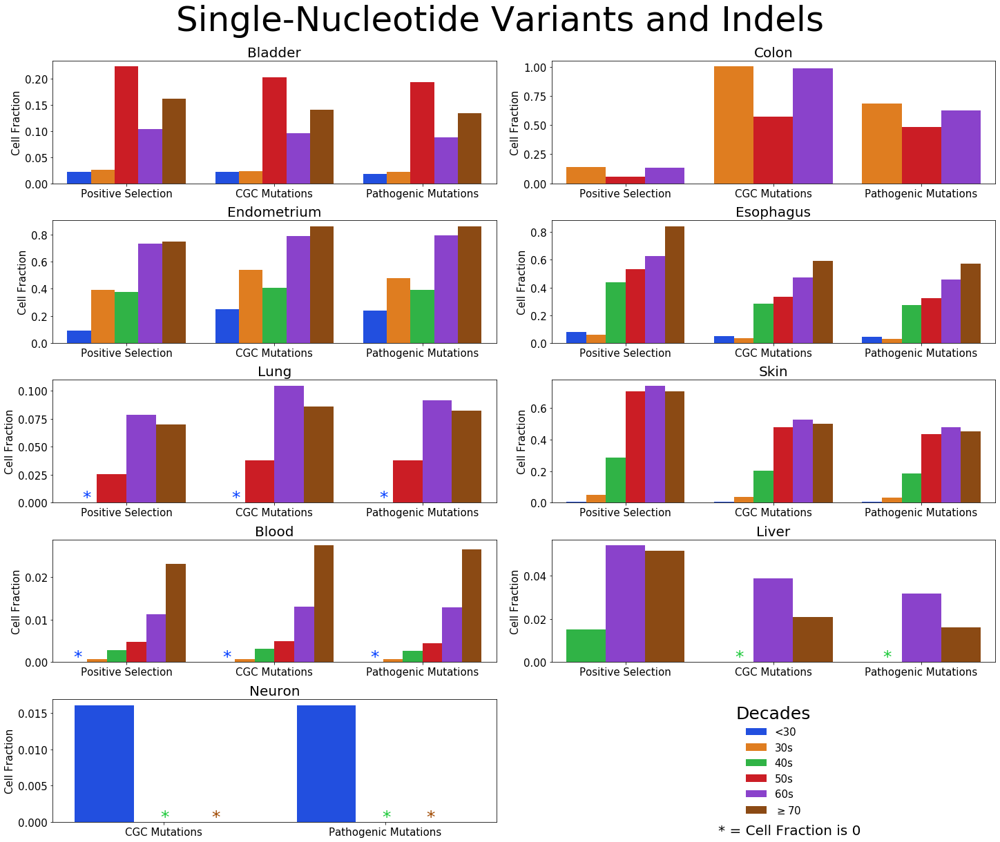

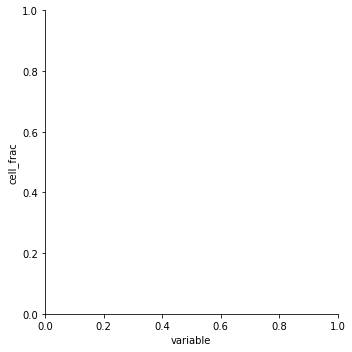

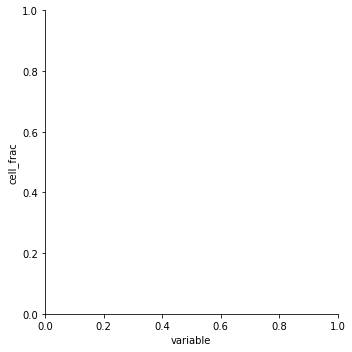

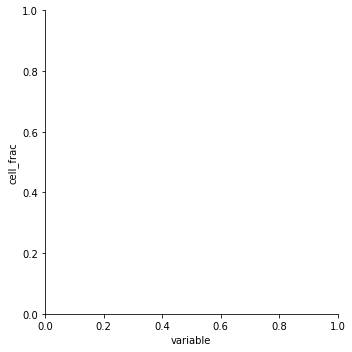

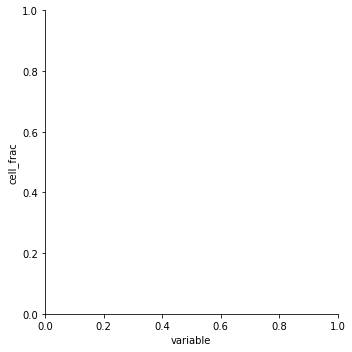

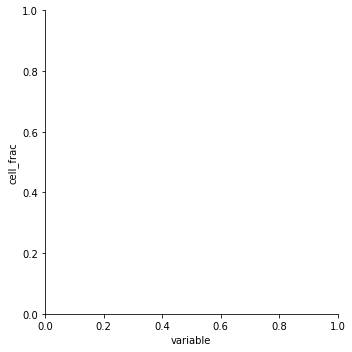

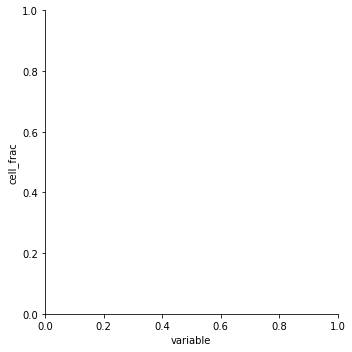

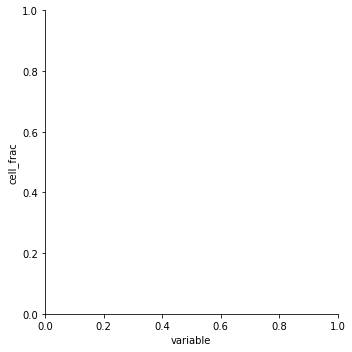

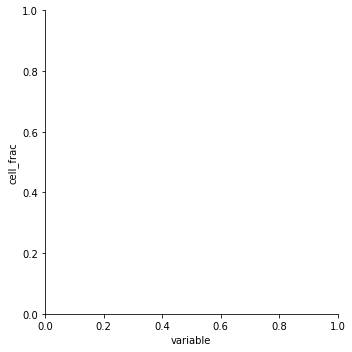

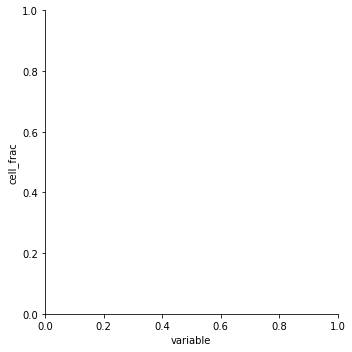

In [9]:
long_form_bladder = pd.read_csv('Mutations_Paper/bladder/long_form.csv', sep = '\t' )
long_form_blood = pd.read_csv('Mutations_Paper/blood/long_form.csv', sep = '\t' )
long_form_colon = pd.read_csv('Mutations_Paper/Colon/long_form.csv', sep = '\t' )
long_form_endom = pd.read_csv('Mutations_Paper/endometrium/long_form.csv', sep = '\t' )
long_form_eso = pd.read_csv('Mutations_Paper/esophagus/long_form.csv', sep = '\t' )
long_form_lung = pd.read_csv('Mutations_Paper/Lung/long_form.csv', sep = '\t' )
long_form_skin = pd.read_csv('Mutations_Paper/Skin/long_form.csv', sep = '\t' )
long_form_liver = pd.read_csv('Mutations_Paper/liver/long_form.csv', sep = '\t')
long_form_neuron = pd.read_csv('Mutations_Paper/neurons/long_form.csv', sep = '\t')

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

fig = plt.figure(figsize = (20, 16), constrained_layout = True)
fig.suptitle('Single-Nucleotide Variants and Indels', fontsize = 50).set_y(1.05)

gs = fig.add_gridspec(5,2)
ax1 = fig.add_subplot(gs[0,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bladder, kind = "bar", legend = None, palette = [colors[0], colors[1], colors[3], colors[4], colors[5]], ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('Cell Fraction', fontsize = 15)
ax1.set_title('Bladder', fontsize = 20)
ax1.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax1.get_legend().remove()
ax1.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
bladder_bottom, bladder_top = ax1.get_ylim()


ax2 = fig.add_subplot(gs[0,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_colon, kind = "bar", legend = None, palette = [colors[1], colors[3], colors[4]], ax = ax2)
ax2.set_xlabel('')
ax2.set_ylabel('Cell Fraction', fontsize = 15)
ax2.set_title('Colon', fontsize = 20)
ax2.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax2.get_legend().remove()
ax2.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
colon_bottom, colon_top = ax2.get_ylim()

ax3 = fig.add_subplot(gs[1,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_endom, kind = "bar", legend = False, palette = [colors[0], colors[1], colors[2], colors[4], colors[5]], ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('Cell Fraction', fontsize = 15)
ax3.set_title('Endometrium', fontsize = 20)
ax3.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax3.get_legend().remove()
ax3.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
endom_bottom, endom_top = ax3.get_ylim()

ax4 = fig.add_subplot(gs[1,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_eso, kind = "bar", legend = False, palette = colors, ax = ax4)
ax4.set_xlabel('')
ax4.set_ylabel('Cell Fraction', fontsize = 15)
ax4.set_title('Esophagus', fontsize = 20)
ax4.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax4.get_legend().remove()
ax4.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
esoph_bottom, esoph_top = ax4.get_ylim()

ax5 = fig.add_subplot(gs[2,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_lung, kind = "bar", legend = False, palette = [colors[0], colors[3], colors[4], colors[5]], ax = ax5)
ax5.set_xlabel('')
ax5.set_ylabel('Cell Fraction', fontsize = 15)
ax5.set_title('Lung', fontsize = 20)
ax5.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax5.get_legend().remove()
ax5.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax5.annotate(s = '*', xy = (0, 0), xytext = (-0.3, 0), fontsize = 25, color = '#023eff')
ax5.annotate(s = '*', xy = (0, 0), xytext = (0.71, 0), fontsize = 25, color = '#023eff')
ax5.annotate(s = '*', xy = (0, 0), xytext = (1.71, 0), fontsize = 25, color = '#023eff')
lung_bottom, lung_top = ax5.get_ylim()

ax6 = fig.add_subplot(gs[2,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_skin, kind = "bar", legend = False, palette = colors, ax = ax6)
ax6.set_xlabel('')
ax6.set_ylabel('Cell Fraction', fontsize = 15)
ax6.set_title('Skin', fontsize = 20)
ax6.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax6.get_legend().remove()
ax6.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
skin_bottom, skin_top = ax6.get_ylim()

ax7 = fig.add_subplot(gs[3, 0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_blood, kind = "bar", legend = False, palette = colors, ax = ax7)
ax7.set_xlabel('')
ax7.set_ylabel('Cell Fraction', fontsize = 15)
ax7.set_title('Blood', fontsize = 20)
ax7.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax7.get_legend().remove()
ax7.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax7.annotate(s = '*', xy = (0, 0), xytext = (-0.36, 0), fontsize = 25, color = '#023eff')
ax7.annotate(s = '*', xy = (0, 0), xytext = (0.65, 0), fontsize = 25, color = '#023eff')
ax7.annotate(s = '*', xy = (0, 0), xytext = (1.65, 0), fontsize = 25, color = '#023eff')
blood_bottom, blood_top = ax7.get_ylim()

ax8 = fig.add_subplot(gs[4,1])
handles, labels = ax4.get_legend_handles_labels()
ax8.legend(handles, labels, loc = 'center', fontsize = 15, title = 'Decades', title_fontsize = 25, frameon = False)
ax8.set_axis_off()
ax8.annotate(s = '* = Cell Fraction is 0', xy = (0, 0), xytext = (0.375, -0.1), fontsize = 20)

ax9 = fig.add_subplot(gs[3, 1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_liver, kind = "bar", legend = False, palette = [colors[2], colors[4], colors[5]], ax = ax9)
ax9.set_xlabel('')
ax9.set_ylabel('Cell Fraction', fontsize = 15)
ax9.set_title('Liver', fontsize = 20)
ax9.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax9.get_legend().remove()
ax9.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax9.annotate(s = '*', xy = (0, 0), xytext = (0.74, 0), fontsize = 25, color = '#1ac938')
ax9.annotate(s = '*', xy = (0, 0), xytext = (1.74, 0), fontsize = 25, color = '#1ac938')
liver_bottom, liver_top = ax9.get_ylim()

ax10 = fig.add_subplot(gs[4, 0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_neuron, kind = "bar", legend = False, palette = [colors[0], colors[2], colors[5]], ax = ax10)
ax10.set_xlabel('')
ax10.set_ylabel('Cell Fraction', fontsize = 15)
ax10.set_title('Neuron', fontsize = 20)
ax10.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax10.get_legend().remove()
ax10.set_xticklabels(['CGC Mutations', 'Pathogenic Mutations'])
ax10.annotate(s = '*', xy = (0, 0), xytext = (-0.015, 0), fontsize = 25, color = '#1ac938')
ax10.annotate(s = '*', xy = (0, 0), xytext = (0.215, 0), fontsize = 25, color = '#9f4800')
ax10.annotate(s = '*', xy = (0, 0), xytext = (0.985, 0), fontsize = 25, color = '#1ac938')
ax10.annotate(s = '*', xy = (0, 0), xytext = (1.185, 0), fontsize = 25, color = '#9f4800')
neurons_bottom, neurons_top = ax10.get_ylim()


#fig.subplots_adjust(top = 0.85)

fig.savefig('Mutations_Paper/All_tissues.jpg', format = 'jpg', bbox_inches = 'tight')

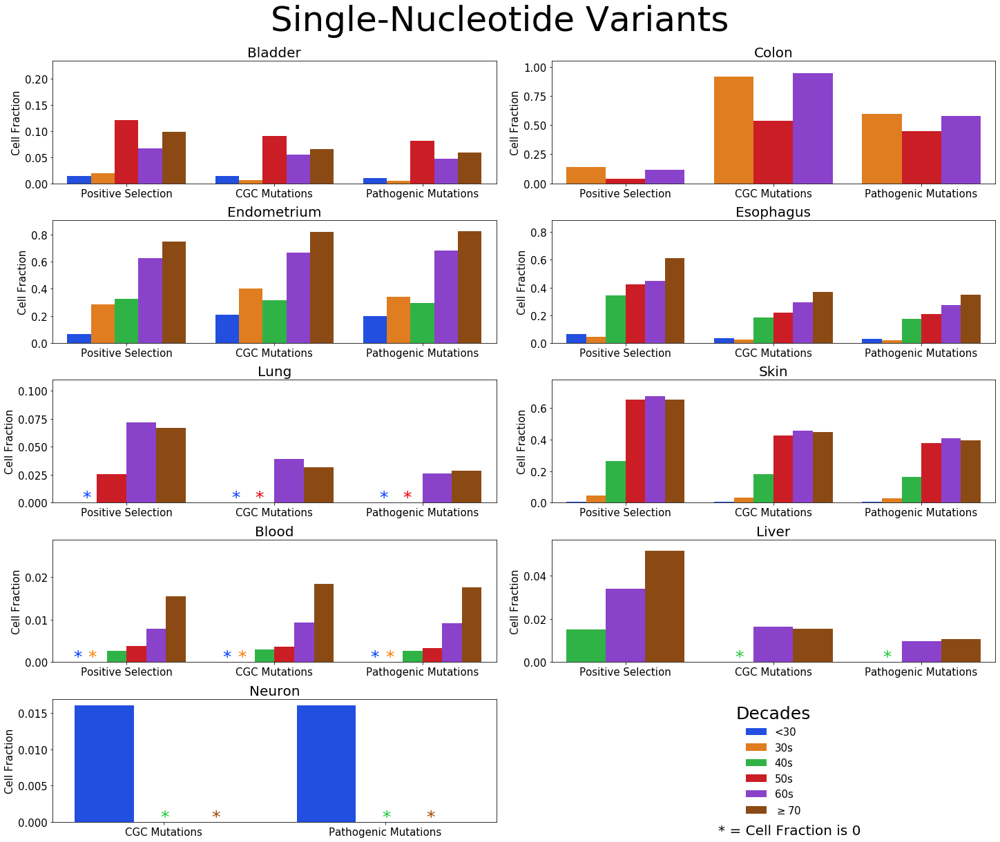

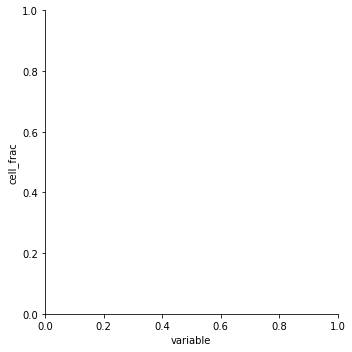

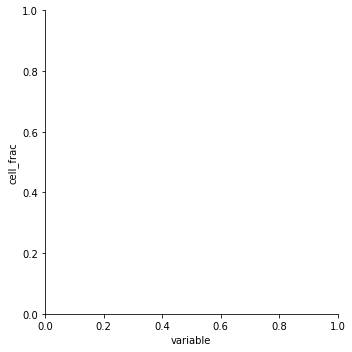

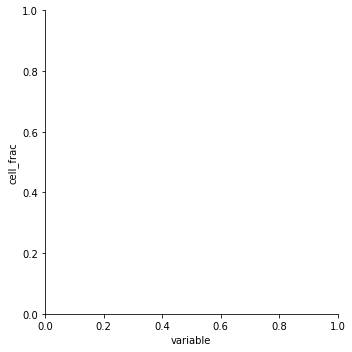

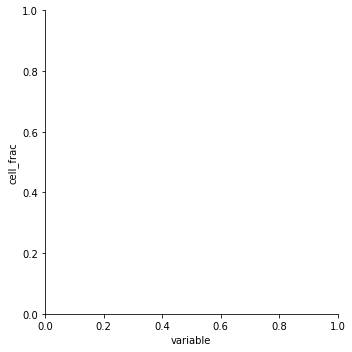

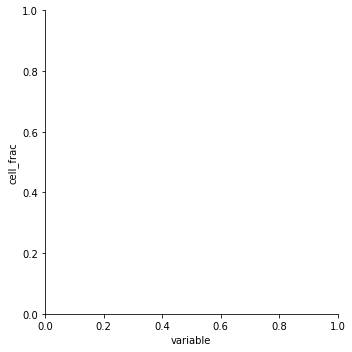

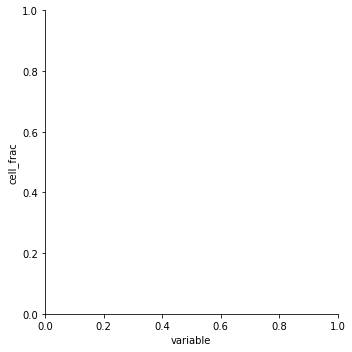

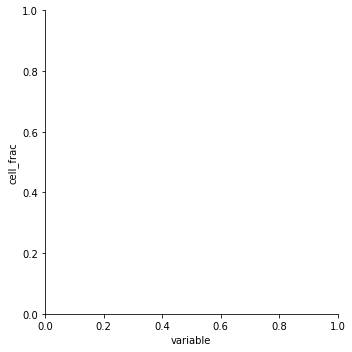

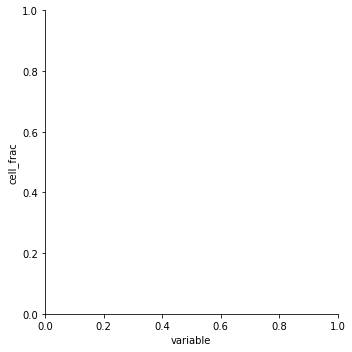

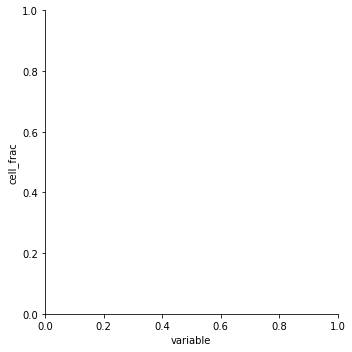

In [11]:
long_form_bladderSNV = pd.read_csv('Mutations_Paper/bladder/long_formSNV.csv', sep = '\t' )
long_form_bloodSNV = pd.read_csv('Mutations_Paper/blood/long_formSNV.csv', sep = '\t' )
long_form_colonSNV = pd.read_csv('Mutations_Paper/Colon/long_formSNV.csv', sep = '\t' )
long_form_endomSNV = pd.read_csv('Mutations_Paper/endometrium/long_formSNV.csv', sep = '\t' )
long_form_esoSNV = pd.read_csv('Mutations_Paper/esophagus/long_formSNV.csv', sep = '\t' )
long_form_lungSNV = pd.read_csv('Mutations_Paper/Lung/long_formSNV.csv', sep = '\t' )
long_form_skinSNV = pd.read_csv('Mutations_Paper/Skin/long_formSNV.csv', sep = '\t' )
long_form_liverSNV = pd.read_csv('Mutations_Paper/liver/long_formSNV.csv', sep = '\t')
long_form_neuronSNV = pd.read_csv('Mutations_Paper/neurons/long_formSNV.csv', sep = '\t')

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

fig = plt.figure(figsize = (20, 16), constrained_layout = True)
fig.suptitle('Single-Nucleotide Variants', fontsize = 50).set_y(1.05)

gs = fig.add_gridspec(5,2)
ax1 = fig.add_subplot(gs[0,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bladderSNV, kind = "bar", legend = None, palette = [colors[0], colors[1], colors[3], colors[4], colors[5]], ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('Cell Fraction', fontsize = 15)
ax1.set_ylim(bladder_bottom, bladder_top)
ax1.set_title('Bladder', fontsize = 20)
ax1.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax1.get_legend().remove()
ax1.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])


ax2 = fig.add_subplot(gs[0,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_colonSNV, kind = "bar", legend = None, palette = [colors[1], colors[3], colors[4]], ax = ax2)
ax2.set_xlabel('')
ax2.set_ylabel('Cell Fraction', fontsize = 15)
ax2.set_ylim(colon_bottom, colon_top)
ax2.set_title('Colon', fontsize = 20)
ax2.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax2.get_legend().remove()
ax2.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])


ax3 = fig.add_subplot(gs[1,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_endomSNV, kind = "bar", legend = False, palette = [colors[0], colors[1], colors[2], colors[4], colors[5]], ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('Cell Fraction', fontsize = 15)
ax3.set_ylim(endom_bottom, endom_top)
ax3.set_title('Endometrium', fontsize = 20)
ax3.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax3.get_legend().remove()
ax3.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])


ax4 = fig.add_subplot(gs[1,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_esoSNV, kind = "bar", legend = False, palette = colors, ax = ax4)
ax4.set_xlabel('')
ax4.set_ylabel('Cell Fraction', fontsize = 15)
ax4.set_ylim(esoph_bottom, esoph_top)
ax4.set_title('Esophagus', fontsize = 20)
ax4.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax4.get_legend().remove()
ax4.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])

ax5 = fig.add_subplot(gs[2,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_lungSNV, kind = "bar", legend = False, palette = [colors[0], colors[3], colors[4], colors[5]], ax = ax5)
ax5.set_xlabel('')
ax5.set_ylabel('Cell Fraction', fontsize = 15)
ax5.set_ylim(lung_bottom, lung_top)
ax5.set_title('Lung', fontsize = 20)
ax5.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax5.get_legend().remove()
ax5.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax5.annotate(s = '*', xy = (0, 0), xytext = (-0.3, 0), fontsize = 25, color = '#023eff')
ax5.annotate(s = '*', xy = (0, 0), xytext = (0.71, 0), fontsize = 25, color = '#023eff')
ax5.annotate(s = '*', xy = (0, 0), xytext = (1.71, 0), fontsize = 25, color = '#023eff')
ax5.annotate(s = '*', xy = (0, 0), xytext = (0.87, 0), fontsize = 25, color = '#e8000b')
ax5.annotate(s = '*', xy = (0, 0), xytext = (1.87, 0), fontsize = 25, color = '#e8000b')


ax6 = fig.add_subplot(gs[2,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_skinSNV, kind = "bar", legend = False, palette = colors, ax = ax6)
ax6.set_xlabel('')
ax6.set_ylabel('Cell Fraction', fontsize = 15)
ax6.set_ylim(skin_bottom, skin_top)
ax6.set_title('Skin', fontsize = 20)
ax6.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax6.get_legend().remove()
ax6.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])

ax7 = fig.add_subplot(gs[3, 0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bloodSNV, kind = "bar", legend = False, palette = colors, ax = ax7)
ax7.set_xlabel('')
ax7.set_ylabel('Cell Fraction', fontsize = 15)
ax7.set_ylim(blood_bottom, blood_top)
ax7.set_title('Blood', fontsize = 20)
ax7.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax7.get_legend().remove()
ax7.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax7.annotate(s = '*', xy = (0, 0), xytext = (-0.36, 0), fontsize = 25, color = '#023eff')
ax7.annotate(s = '*', xy = (0, 0), xytext = (0.65, 0), fontsize = 25, color = '#023eff')
ax7.annotate(s = '*', xy = (0, 0), xytext = (1.65, 0), fontsize = 25, color = '#023eff')
ax7.annotate(s = '*', xy = (0, 0), xytext = (-0.26, 0), fontsize = 25, color = '#ff7c00')
ax7.annotate(s = '*', xy = (0, 0), xytext = (0.75, 0), fontsize = 25, color = '#ff7c00')
ax7.annotate(s = '*', xy = (0, 0), xytext = (1.75, 0), fontsize = 25, color = '#ff7c00')

ax8 = fig.add_subplot(gs[4,1])
handles, labels = ax4.get_legend_handles_labels()
ax8.legend(handles, labels, loc = 'center', fontsize = 15, title = 'Decades', title_fontsize = 25, frameon = False)
ax8.set_axis_off()
ax8.annotate(s = '* = Cell Fraction is 0', xy = (0, 0), xytext = (0.375, -0.1), fontsize = 20)

ax9 = fig.add_subplot(gs[3, 1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_liverSNV, kind = "bar", legend = False, palette = [colors[2], colors[4], colors[5]], ax = ax9)
ax9.set_xlabel('')
ax9.set_ylabel('Cell Fraction', fontsize = 15)
ax9.set_ylim(liver_bottom, liver_top)
ax9.set_title('Liver', fontsize = 20)
ax9.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax9.get_legend().remove()
ax9.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax9.annotate(s = '*', xy = (0, 0), xytext = (0.74, 0), fontsize = 25, color = '#1ac938')
ax9.annotate(s = '*', xy = (0, 0), xytext = (1.74, 0), fontsize = 25, color = '#1ac938')

ax10 = fig.add_subplot(gs[4, 0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_neuronSNV, kind = "bar", legend = False, palette = [colors[0], colors[2], colors[5]], ax = ax10)
ax10.set_xlabel('')
ax10.set_ylabel('Cell Fraction', fontsize = 15)
ax10.set_ylim(neurons_bottom, neurons_top)
ax10.set_title('Neuron', fontsize = 20)
ax10.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax10.get_legend().remove()
ax10.set_xticklabels(['CGC Mutations', 'Pathogenic Mutations'])
ax10.annotate(s = '*', xy = (0, 0), xytext = (-0.015, 0), fontsize = 25, color = '#1ac938')
ax10.annotate(s = '*', xy = (0, 0), xytext = (0.215, 0), fontsize = 25, color = '#9f4800')
ax10.annotate(s = '*', xy = (0, 0), xytext = (0.985, 0), fontsize = 25, color = '#1ac938')
ax10.annotate(s = '*', xy = (0, 0), xytext = (1.185, 0), fontsize = 25, color = '#9f4800')

#fig.subplots_adjust(top = 0.85)

fig.savefig('Mutations_Paper/All_tissuesSNV.jpg', format = 'jpg', bbox_inches = 'tight')

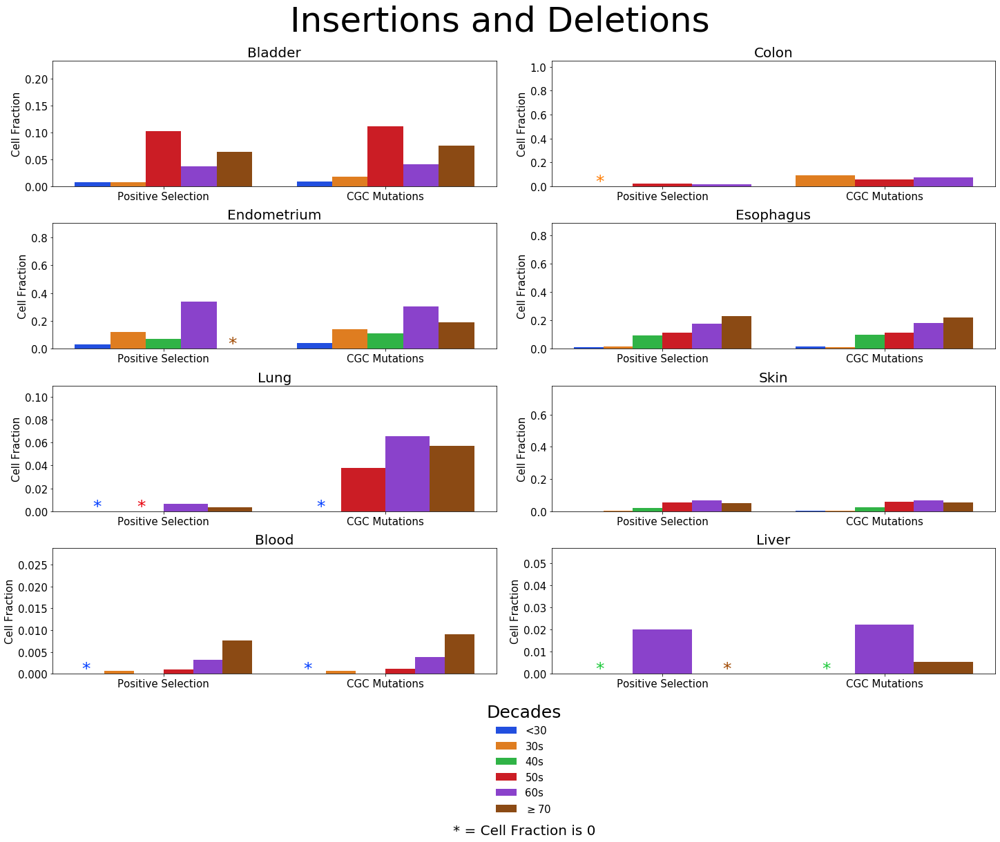

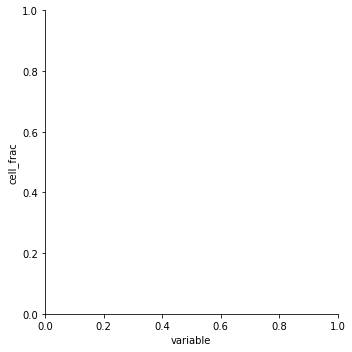

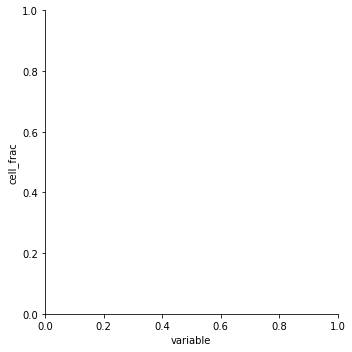

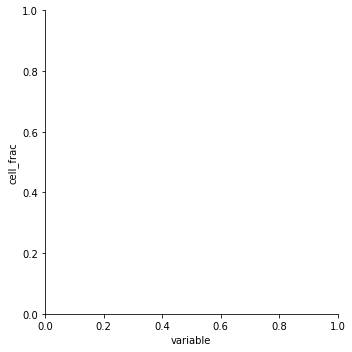

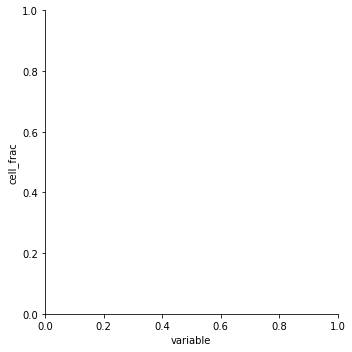

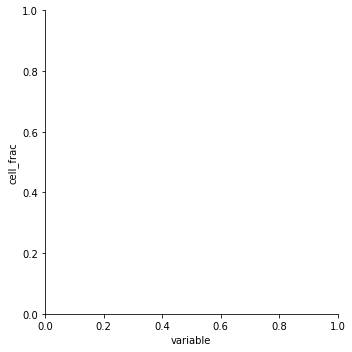

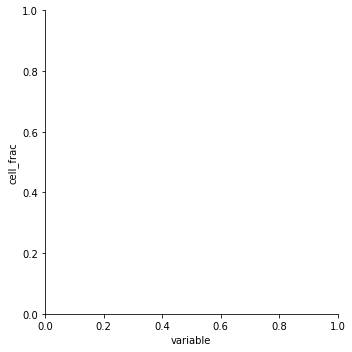

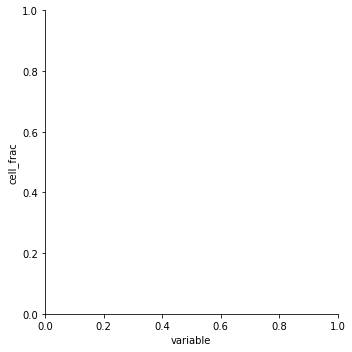

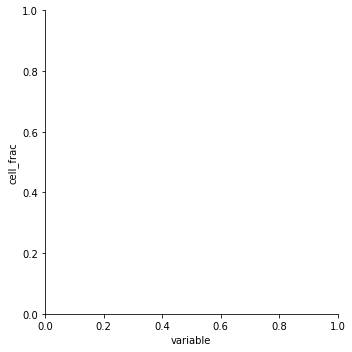

In [12]:
long_form_bladderIndel = pd.read_csv('Mutations_Paper/bladder/long_formIndel.csv', sep = '\t' )
long_form_bloodIndel = pd.read_csv('Mutations_Paper/blood/long_formIndel.csv', sep = '\t' )
long_form_colonIndel = pd.read_csv('Mutations_Paper/Colon/long_formIndel.csv', sep = '\t' )
long_form_endomIndel = pd.read_csv('Mutations_Paper/endometrium/long_formIndel.csv', sep = '\t' )
long_form_esoIndel = pd.read_csv('Mutations_Paper/esophagus/long_formIndel.csv', sep = '\t' )
long_form_lungIndel = pd.read_csv('Mutations_Paper/Lung/long_formIndel.csv', sep = '\t' )
long_form_skinIndel = pd.read_csv('Mutations_Paper/Skin/long_formIndel.csv', sep = '\t' )
long_form_liverIndel = pd.read_csv('Mutations_Paper/liver/long_formIndel.csv', sep = '\t')
#long_form_neuronIndel = pd.read_csv('Mutations_Paper/neurons/long_formIndel.csv', sep = '\t')

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

fig = plt.figure(figsize = (20, 16), constrained_layout = True)
fig.suptitle('Insertions and Deletions', fontsize = 50).set_y(1.05)

gs = fig.add_gridspec(5,2)
ax1 = fig.add_subplot(gs[0,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bladderIndel, kind = "bar", legend = None, palette = [colors[0], colors[1], colors[3], colors[4], colors[5]], ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('Cell Fraction', fontsize = 15)
ax1.set_ylim(bladder_bottom, bladder_top)
ax1.set_title('Bladder', fontsize = 20)
ax1.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax1.get_legend().remove()
ax1.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])


ax2 = fig.add_subplot(gs[0,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_colonIndel, kind = "bar", legend = None, palette = [colors[1], colors[3], colors[4]], ax = ax2)
ax2.set_xlabel('')
ax2.set_ylabel('Cell Fraction', fontsize = 15)
ax2.set_ylim(colon_bottom, colon_top)
ax2.set_title('Colon', fontsize = 20)
ax2.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax2.get_legend().remove()
ax2.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax2.annotate(s = '*', xy = (0, 0), xytext = (-0.3, 0), fontsize = 25, color = '#ff7c00')


ax3 = fig.add_subplot(gs[1,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_endomIndel, kind = "bar", legend = False, palette = [colors[0], colors[1], colors[2], colors[4], colors[5]], ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('Cell Fraction', fontsize = 15)
ax3.set_ylim(endom_bottom, endom_top)
ax3.set_title('Endometrium', fontsize = 20)
ax3.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax3.get_legend().remove()
ax3.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax3.annotate(s = '*', xy = (0, 0), xytext = (0.29, 0), fontsize = 25, color = '#9f4800')

ax4 = fig.add_subplot(gs[1,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_esoIndel, kind = "bar", legend = False, palette = colors, ax = ax4)
ax4.set_xlabel('')
ax4.set_ylabel('Cell Fraction', fontsize = 15)
ax4.set_ylim(esoph_bottom, esoph_top)
ax4.set_title('Esophagus', fontsize = 20)
ax4.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax4.get_legend().remove()
ax4.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])

ax5 = fig.add_subplot(gs[2,0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_lungIndel, kind = "bar", legend = False, palette = [colors[0], colors[3], colors[4], colors[5]], ax = ax5)
ax5.set_xlabel('')
ax5.set_ylabel('Cell Fraction', fontsize = 15)
ax5.set_ylim(lung_bottom, lung_top)
ax5.set_title('Lung', fontsize = 20)
ax5.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax5.get_legend().remove()
ax5.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax5.annotate(s = '*', xy = (0, 0), xytext = (-0.32, 0), fontsize = 25, color = '#023eff')
ax5.annotate(s = '*', xy = (0, 0), xytext = (-0.12, 0), fontsize = 25, color = '#e8000b')
ax5.annotate(s = '*', xy = (0, 0), xytext = (0.69, 0), fontsize = 25, color = '#023eff')

ax6 = fig.add_subplot(gs[2,1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_skinIndel, kind = "bar", legend = False, palette = colors, ax = ax6)
ax6.set_xlabel('')
ax6.set_ylabel('Cell Fraction', fontsize = 15)
ax6.set_ylim(skin_bottom, skin_top)
ax6.set_title('Skin', fontsize = 20)
ax6.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax6.get_legend().remove()
ax6.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])

ax7 = fig.add_subplot(gs[3, 0])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bloodIndel, kind = "bar", legend = False, palette = colors, ax = ax7)
ax7.set_xlabel('')
ax7.set_ylabel('Cell Fraction', fontsize = 15)
ax7.set_ylim(blood_bottom, blood_top)
ax7.set_title('Blood', fontsize = 20)
ax7.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax7.get_legend().remove()
ax7.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax7.annotate(s = '*', xy = (0, 0), xytext = (-0.37, 0), fontsize = 25, color = '#023eff')
ax7.annotate(s = '*', xy = (0, 0), xytext = (0.63, 0), fontsize = 25, color = '#023eff')

ax8 = fig.add_subplot(gs[4,:])
handles, labels = ax4.get_legend_handles_labels()
ax8.legend(handles, labels, loc = 'center', fontsize = 15, title = 'Decades', title_fontsize = 25, frameon = False)
ax8.set_axis_off()
ax8.annotate(s = '* = Cell Fraction is 0', xy = (0, 0), xytext = (0.425, -0.1), fontsize = 20)

ax9 = fig.add_subplot(gs[3, 1])
g = sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_liverIndel, kind = "bar", legend = False, palette = [colors[2], colors[4], colors[5]], ax = ax9)
ax9.set_xlabel('')
ax9.set_ylabel('Cell Fraction', fontsize = 15)
ax9.set_ylim(liver_bottom, liver_top)
ax9.set_title('Liver', fontsize = 20)
ax9.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax9.get_legend().remove()
ax9.set_xticklabels(['Positive Selection', 'CGC Mutations', 'Pathogenic Mutations'])
ax9.annotate(s = '*', xy = (0, 0), xytext = (-0.3, 0), fontsize = 25, color = '#1ac938')
ax9.annotate(s = '*', xy = (0, 0), xytext = (0.27, 0), fontsize = 25, color = '#9f4800')
ax9.annotate(s = '*', xy = (0, 0), xytext = (0.72, 0), fontsize = 25, color = '#1ac938')

fig.savefig('Mutations_Paper/All_tissuesIndel.jpg', format = 'jpg', bbox_inches = 'tight')

# Plots for Counts

<a id='cell_count_plots'></a>

In [19]:
#Need to get the counts from the Excel sheet
cell_counts = pd.read_excel('Mutations_Paper/Patho_CellFracs.xlsx', sheet_name = 'Cell_Counts', header = 12)
"""cell_counts = cell_counts.drop(cell_counts.columns[[5,6,7,8]], axis = 1)
cell_counts = cell_counts.rename(columns = {'Unnamed: 0': 'decades'}).sort_values(by = 'tissue')

decades = []
tissues = []
for row in cell_counts.itertuples():
    decades.append(row[1])
    tissues.append(row[2])

cell_counts_new = cell_counts.drop(cell_counts.columns[[0,1]], axis = 1)
long = pd.melt(cell_counts_new)
long['decades'] = decades*3
long['tissues'] = tissues*3
long = long.rename(columns = {'value': 'cell_counts'})"""

cell_counts.head(len(cell_counts))
#long.head(len(long))

,Unnamed: 0,Bladder,Blood,Colon,Endometrium,Esophagus,Liver,Lung,Neuron,Skin,Unnamed: 10
0,<30,6.666029e+07,0.000000e+00,0.000000e+00,0,0,0.000000e+00,0.000000e+00,1.612903e+09,6.686096e+08,NaN
1,30s,8.380814e+07,5.273740e+08,3.203654e+10,0,0,0.000000e+00,0.000000e+00,0.000000e+00,4.464864e+09,NaN
2,40s,0.000000e+00,2.192553e+09,0.000000e+00,0,0,0.000000e+00,0.000000e+00,0.000000e+00,2.741391e+10,NaN
3,50s,7.333269e+08,3.560919e+09,2.248988e+10,0,0,0.000000e+00,5.924772e+09,0.000000e+00,6.392670e+10,NaN
4,60s,3.311862e+08,1.031655e+10,2.910405e+10,0,0,7.668964e+09,1.427625e+10,0.000000e+00,7.042140e+10,NaN
5,>70,5.091589e+08,2.130496e+10,0.000000e+00,0,0,3.867901e+09,1.287776e+10,0.000000e+00,6.637995e+10,NaN


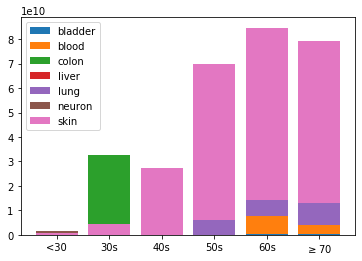

In [31]:
decade_ind = [0, 1, 2, 3, 4, 5]
decades = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70']

plt.figure()
p1 = plt.bar(decade_ind, cell_counts.Bladder)
p2 = plt.bar(decade_ind, cell_counts.Blood, bottom = cell_counts.Bladder)
p3 = plt.bar(decade_ind, cell_counts.Colon, bottom = cell_counts.Blood)
p4 = plt.bar(decade_ind, cell_counts.Liver, bottom = cell_counts.Blood)
p5 = plt.bar(decade_ind, cell_counts.Lung, bottom = cell_counts.Liver)
p6 = plt.bar(decade_ind, cell_counts.Neuron, bottom = cell_counts.Lung)
p7 = plt.bar(decade_ind, cell_counts.Skin, bottom = cell_counts.Lung)

plt.xlabel('')
plt.xticks(decade_ind, decades)
plt.legend((p1[0], p2[0], p3[0], p4[0], p5[0], p6[0], p7[0]), ('bladder', 'blood', 'colon', 'liver', 'lung', 'neuron', 'skin') )
plt.savefig('Mutations_Paper/cell_counts_patho.jpg', format = 'jpg', bbox_inches = 'tight')

# All Calcs to Excel File

In [111]:
#Need to get this data into an Excel file, each tissue on a different sheet
with pd.ExcelWriter('Mutations_Paper/cell_fracs.xlsx') as cell_frac:
    endom_frac.to_excel(cell_frac, sheet_name = 'endometrium', index = False)
    eso_frac.to_excel(cell_frac,sheet_name = 'esophagus', index = False)
    colon_frac.to_excel(cell_frac, sheet_name = 'colon', index = False)
    skin_frac.to_excel(cell_frac, sheet_name = 'skin', index = False)
    bladder_frac.to_excel(cell_frac,sheet_name = 'bladder', index = False)
    lung_frac.to_excel(cell_frac, sheet_name = 'lung', index = False)
    blood_frac.to_excel(cell_frac, sheet_name = 'blood', index = False)

# Liver

<a id='liver'></a>

In [21]:
#Get liver mutations and put the genes to the locations

liver_muts = pd.read_csv('Mutations_Paper/liver/all_mutations_normal_cancer_snv_indels.csv')
print('total mutations:', len(liver_muts))
liver_muts = liver_muts.rename(columns = {'donor': 'subject', 'pos': 'Start', 'chrom': 'Chromosome'})
liver_muts = liver_muts.drop(liver_muts.columns[[2,3, 10]], axis = 1).reset_index(drop = True)
liver_muts['End'] = liver_muts.Start + 1
liver_muts['Chromosome'] = 'chr' + liver_muts.Chromosome.astype('str')
liver_py = pr.PyRanges(df = liver_muts)
liver_exons = liver_py.overlap(hg19exon_regions)
liver_muts = liver_exons.as_df()
print('mutations in exons:', len(liver_muts))


#Use only the samples from those who don't have cirrhotic livers.
normals = ['PD36713', 'PD36714', 'PD36715', 'PD36717', 'PD36718']
liver_muts = liver_muts[liver_muts.subject.isin(normals)]
print('mutations in normal liver:', len(liver_muts))

#apply decades
decades = []
num_samps = []
for row in liver_muts.itertuples():
    if row[1] == 'PD36713' or row[1] == 'PD36715':
        decades.append('60s')
        num_samps.append(56)
    elif row[1] == 'PD36718':
        decades.append('40s')
        num_samps.append(32)
    else:
        decades.append('70s')
        num_samps.append(81)
liver_muts['decades'] = decades
liver_muts['num_samps'] = num_samps
liver_muts['vaf_dec'] = liver_muts.vaf/liver_muts.num_samps 

liver_coding = liver_muts

#Get the genes on this df
liver_muts = liver_muts.rename(columns = {'Chromosome': 'chr_x', 'Start': 'start', 'End': 'end'})
liver_muts['chr_x'] = liver_muts.chr_x.str.partition('chr')[2]

chroms = []
for row in liver_muts.itertuples():
    chroms.append('chr' + str(row[3]))
liver_muts['chr'] = chroms

import pysam
gencode_v19 = pysam.TabixFile('GENCODE/gencode.v19.annotation.gff3_all_known_genes.txt.sorted.formatted.bed.gz')

liver_muts['genes'] = liver_muts.apply(lambda x: gencode_all_known_genes(x[['chr', 'start', 'end']], gencode_v19), axis=1)

print(len(liver_muts))
all_liver_muts = liver_muts
liver_muts = liver_muts[liver_muts.genes != 'NA(0)'].reset_index(drop = True)
print('mutations with genes in GENCODE:', len(liver_muts))


#Now I want to break up the gene names if it overlaps. Make sure that I remove duplicates when starting to sum VAFs

print(len(liver_muts))
new_rows = []
for i,r in liver_muts.iterrows(): #iterrows uses (index, series) across the dataframe
    g_list = r['genes'].split(";") #split the genes if more than one gene is attributed to a genomic location
    for g in g_list:
        g = g.replace(" ","") #remove all spaces that is created by the splits
        new_rows.append(np.append(r[['subject', 'sample', 'chr_x', 'chr', 'start', 'end', 'ref', 'alt', 'type', 'vaf', 'decades', 'num_samps', 'vaf_dec', 'genes']].values, g))#g is copied to the array of data in the dataframe

liver_muts_perGene = pd.DataFrame()
liver_muts_perGene = liver_muts_perGene.append(pd.DataFrame(new_rows, columns=['subject', 'sample', 'chr_x', 'chr', 'start', 'end', 'ref',\
                                                                               'alt', 'type', 'vaf', 'decades', 'num_samps', 'vaf_dec', 'genes', 'gene_ID'])).reset_index().drop('index', axis=1)

liver_muts_perGene['gene_name'] = liver_muts_perGene['gene_ID'].apply(lambda x: x.split("(")[0])
liver_muts_perGene['gene_coverage'] = liver_muts_perGene['gene_ID'].apply(lambda x: x.split("(")[1].replace(")", ""))

liver_muts_perGene = liver_muts_perGene.drop(['genes', 'gene_ID', 'gene_coverage'], axis = 1)

print(len(liver_muts_perGene))

liver_muts = liver_muts_perGene.drop(['chr', 'end'], axis = 1)
liver_muts = liver_muts.rename(columns = {'gene_name': 'gene', 'chr_x': 'chr'})
    
liver_muts.to_csv('Mutations_Paper/liver/TGS+genes.csv', index = False)


print(len(liver_muts))
liver_muts.head(len()

total mutations: 857904
mutations in exons: 7958
mutations in normal liver: 1264
1264
mutations with genes in GENCODE: 1243
1243
1340
1340


,subject,sample,chr,start,ref,alt,type,vaf,decades,num_samps,vaf_dec,gene
0,PD36713,PD36713b_lo001,1,118494980,T,C,Sub,0.110,60s,56,0.001964,WDR3
1,PD36713,PD36713b_lo010,1,118494980,T,C,Sub,0.087,60s,56,0.001554,WDR3
2,PD36713,PD36713b_lo010,1,233490585,G,A,Sub,0.130,60s,56,0.002321,MLK4
3,PD36713,PD36713b_lo011,1,109241258,A,G,Sub,0.067,60s,56,0.001196,PRPF38B
4,PD36713,PD36713b_lo012,1,39469062,G,T,Sub,0.210,60s,56,0.003750,AKIRIN1
5,PD36713,PD36713b_lo012,1,145368590,T,C,Sub,0.091,60s,56,0.001625,NBPF10
6,PD36713,PD36713b_lo012,1,196714960,A,C,Sub,0.180,60s,56,0.003214,CFH
7,PD36713,PD36713b_lo013,1,32841949,A,T,Sub,0.068,60s,56,0.001214,BSDC1
8,PD36713,PD36713b_lo013,1,186158913,G,C,Sub,0.120,60s,56,0.002143,HMCN1
9,PD36713,PD36713b_lo002,1,6219488,T,G,Sub,0.110,60s,56,0.001964,CHD5


In [6]:
liver_muts = pd.read_csv('Mutations_Paper/liver/TGS+genes.csv')
print(len(liver_muts))
liver_muts.head()

1340


,subject,sample,chr,start,ref,alt,type,vaf,decades,num_samps,vaf_dec,gene
0,PD36713,PD36713b_lo001,1,118494980,T,C,Sub,0.110,60s,56,0.001964,WDR3
1,PD36713,PD36713b_lo010,1,118494980,T,C,Sub,0.087,60s,56,0.001554,WDR3
2,PD36713,PD36713b_lo010,1,233490585,G,A,Sub,0.130,60s,56,0.002321,MLK4
3,PD36713,PD36713b_lo011,1,109241258,A,G,Sub,0.067,60s,56,0.001196,PRPF38B
4,PD36713,PD36713b_lo012,1,39469062,G,T,Sub,0.210,60s,56,0.003750,AKIRIN1


In [56]:
#liver_muts.insert(6, 'change', liver_muts.ref + '>' + liver_muts.alt)
wgs_merge = pd.merge(liver_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
wgs_merge = wgs_merge[(wgs_merge.fathmm_prediction == 'PATHOGENIC')]

liver_decade = liver_muts[liver_muts.type == 'Sub'].groupby('decades').count()
liver_count = liver_decade.start

wgs_decade = wgs_merge.groupby('decades').count()
wgs_count = wgs_decade.start

print(len(wgs_merge))

print(liver_count)
print(wgs_count)

5
decades
40s    144
60s    567
70s    584
Name: start, dtype: int64
decades
60s    3
70s    2
Name: start, dtype: int64


In [9]:
#For indels, get # of indels in CGC genes/total indels in each group
liver_indel = liver_muts[liver_muts.type != 'Sub']

liver_count = liver_indel.groupby('decades').count()
indel_count = liver_count.start

liver_CGC = liver_indel[liver_indel.gene.isin(CGC_genes)].groupby('decades').count()
CGC_count = liver_CGC.start

print(len(liver_indel))
print(indel_count, CGC_count)

45
decades
60s    32
70s    13
Name: start, dtype: int64 decades
60s    5
70s    1
Name: start, dtype: int64


In [8]:
#Positive selection

#Positively selected genes in paper.
liver_genes = ['ALB', 'ACVR2A', 'ARID1A', 'EPS15', 'ATM', 'SF3B1', 'ESRRG', 'CPS1', 'BRINP3', 'ZNF226', 'APC', 'HMCN1', 'KMT2C']

tissue_pos = liver_muts[liver_muts.gene.isin(liver_genes)]
tissue_posSNV = tissue_pos[tissue_pos.type == 'Sub']
tissue_posIndel = tissue_pos[tissue_pos.type != 'Sub']

dec_vaftot = tissue_pos.groupby('decades')['vaf_dec'].sum()*2
dec_vaftotSNV = tissue_posSNV.groupby('decades')['vaf_dec'].sum()*2
dec_vaftotIndel = tissue_posIndel.groupby('decades')['vaf_dec'].sum()*2

dec_vaftot = pd.DataFrame(dec_vaftot)
dec_vaftotSNV = pd.DataFrame(dec_vaftotSNV)
dec_vaftotIndel = pd.DataFrame(dec_vaftotIndel)


print(dec_vaftot)
print(dec_vaftotSNV)
print(dec_vaftotIndel)

pos_sel = []
pos_selSNV = []
pos_selIndel = []

for row in dec_vaftot.itertuples():
    pos_sel.append(row[1])
for row in dec_vaftotSNV.itertuples():
    pos_selSNV.append(row[1])
for row in dec_vaftotIndel.itertuples():
    pos_selIndel.append(row[1])
pos_selIndel.insert(0, 0)
pos_selIndel.insert(2, 0)

decades = ['40s', '60s', r'$\geq$70']

tissue_frac = pd.DataFrame()
tissue_fracSNV = pd.DataFrame()
tissue_fracIndel = pd.DataFrame()

tissue_frac['decades'] = decades
tissue_fracSNV['decades'] = decades
tissue_fracIndel['decades'] = decades

tissue_frac['pos_sel'] = pos_sel
tissue_fracSNV['pos_selSNV'] = pos_selSNV
tissue_fracIndel['pos_selIndel'] = pos_selIndel

print(len(liver_muts), len(tissue_pos))

#tissue_muts.head(3760)
dec_vaftot.head(len(dec_vaftot))
tissue_fracIndel.head(len(tissue_frac))

          vaf_dec
decades          
40s      0.015000
60s      0.053929
70s      0.051358
          vaf_dec
decades          
40s      0.015000
60s      0.033929
70s      0.051358
         vaf_dec
decades         
60s      0.02   
1340 22


,decades,pos_selIndel
0,40s,0.00
1,60s,0.02
2,$\geq$70,0.00


In [9]:
# Now we need the CGC mutations

liver_muts['change'] = liver_muts.ref + '>' + liver_muts.alt

#Let's separate the indels and SNVs to effectively cross
tissue_indels = liver_muts[(liver_muts.type != 'Sub')]
tissue_snvs = pd.concat([tissue_indels, liver_muts]).drop_duplicates(keep = False)
print(len(liver_muts), len(tissue_indels), len(tissue_snvs))


#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change']).sort_values(by = ['decades', 'sample'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'].sort_values(by = ['decades', 'sample', 'vaf']) #These are the pathogenic SNVs

#get the indels that are in CGC genes and concatenate with the CGC and patho snvs
tissue_CGC_indels = tissue_indels[tissue_indels.gene.isin(CGC_genes)]

tissue_CGC_total = pd.concat([tissue_CGC_merge, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample']) 
tissue_patho_total = pd.concat([tissue_patho_snvs, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample'])

CGC_frac = tissue_CGC_total.groupby('decades')['vaf_dec'].sum()*2
patho_frac = tissue_patho_total.groupby('decades')['vaf_dec'].sum()*2
CGC_fracSNV = tissue_CGC_merge.groupby('decades')['vaf_dec'].sum()*2
CGC_fracSNVpatho = tissue_patho_snvs.groupby('decades')['vaf_dec'].sum()*2
CGC_fracIndel = tissue_CGC_indels.groupby('decades')['vaf_dec'].sum()*2

CGC_frac = pd.DataFrame(CGC_frac)
patho_frac = pd.DataFrame(patho_frac)
CGC_fracSNV = pd.DataFrame(CGC_fracSNV)
CGC_fracSNVpatho = pd.DataFrame(CGC_fracSNVpatho)
CGC_fracIndel = pd.DataFrame(CGC_fracIndel)


print(CGC_frac)
print(patho_frac)

##Get the cell_fracs
tissue_CGC_frac = [] #lists for cell_fracs
tissue_patho_frac = []
tissue_CGC_fracSNV = []
tissue_CGC_fracSNVpatho = []
tissue_CGC_fracIndel = []

#get cell_fracs
for row in CGC_frac.itertuples():
    tissue_CGC_frac.append(row[1])
for row in patho_frac.itertuples():
    tissue_patho_frac.append(row[1])
for row in CGC_fracSNV.itertuples():
    tissue_CGC_fracSNV.append(row[1])
for row in CGC_fracSNVpatho.itertuples():
    tissue_CGC_fracSNVpatho.append(row[1])
for row in CGC_fracIndel.itertuples():
    tissue_CGC_fracIndel.append(row[1])
    
tissue_CGC_frac.insert(0, 0)
tissue_patho_frac.insert(0, 0)
tissue_CGC_fracSNV.insert(0, 0)
tissue_CGC_fracSNVpatho.insert(0, 0)
tissue_CGC_fracIndel.insert(0, 0)
    
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac

tissue_fracSNV['CGC_fracSNV'] = tissue_CGC_fracSNV
tissue_fracSNV['patho_fracSNV'] = tissue_CGC_fracSNVpatho

tissue_fracIndel['CGC_fracIndel'] = tissue_CGC_fracIndel

#tissue_indels.head(len(tissue_indels))
tissue_frac.head(len(tissue_frac))
tissue_fracSNV.head()
tissue_fracIndel.head()

1340 45 1295
          vaf_dec
decades          
60s      0.038607
70s      0.020988
          vaf_dec
decades          
60s      0.031821
70s      0.016049


,decades,pos_selIndel,CGC_fracIndel
0,40s,0.00,0.000000
1,60s,0.02,0.022143
2,$\geq$70,0.00,0.005432


In [10]:
liver_frac = tissue_frac
liver_fracSNV = tissue_fracSNV
liver_fracIndel = tissue_fracIndel

<Figure size 432x288 with 0 Axes>

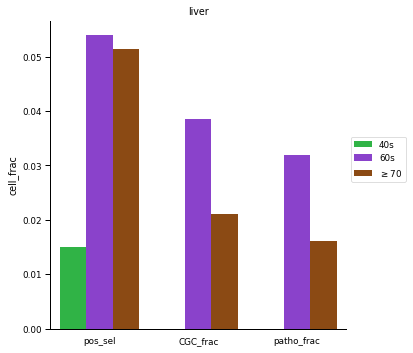

In [11]:
new_liver_frac = liver_frac.drop('decades', axis = 1)
long_form_liver = pd.melt(new_liver_frac)
decade = ['40s', '60s', r'$\geq$70', '40s', '60s', r'$\geq$70', '40s', '60s', r'$\geq$70']
long_form_liver['decade'] = decade
long_form_liver = long_form_liver.rename(columns = {'value':'cell_frac'})

long_form_liver.head(len(long_form_liver))

#Now I need to make a bar graph of this data

colors = ['#1ac938', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']
#['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_liver, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('liver')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/liver.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

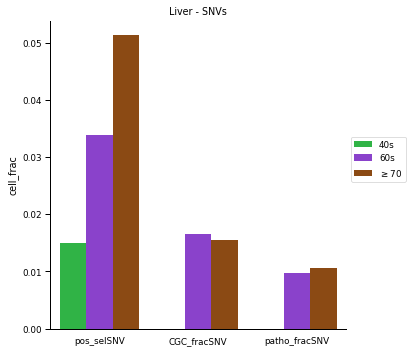

In [12]:
new_liver_fracSNV = liver_fracSNV.drop('decades', axis = 1)
long_form_liverSNV = pd.melt(new_liver_fracSNV)
decade = ['40s', '60s', r'$\geq$70', '40s', '60s', r'$\geq$70', '40s', '60s', r'$\geq$70']
long_form_liverSNV['decade'] = decade
long_form_liverSNV = long_form_liverSNV.rename(columns = {'value':'cell_frac'})

long_form_liverSNV.head(len(long_form_liverSNV))

#Now I need to make a bar graph of this data

colors = ['#1ac938', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']
#['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_liverSNV, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Liver - SNVs')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/liverSNVs.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

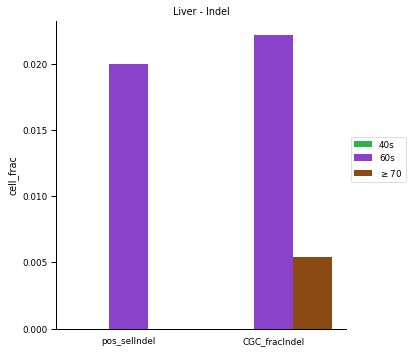

In [13]:
new_liver_fracIndel = liver_fracIndel.drop('decades', axis = 1)
long_form_liverIndel = pd.melt(new_liver_fracIndel)
decade = ['40s', '60s', r'$\geq$70', '40s', '60s', r'$\geq$70']
long_form_liverIndel['decade'] = decade
long_form_liverIndel = long_form_liverIndel.rename(columns = {'value':'cell_frac'})

long_form_liverIndel.head(len(long_form_liverIndel))

#Now I need to make a bar graph of this data

colors = ['#1ac938', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']
#['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_liverIndel, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Liver - Indel')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/LiverIndels.jpg", format="jpg", bbox_inches="tight")

# Neurons

<a id='neurons'></a>

In [11]:
#Need to get the neurons

neuron_samp_data = pd.read_excel('Mutations_Paper/neurons/sample_data.xlsx', sheet_name = 'Sample Information', sep = '\t', header = 0)
neuron_samp_data = neuron_samp_data.drop(neuron_samp_data.columns[[1, 5, 6, 7, 8]], axis = 1)
neuron_samp_data = neuron_samp_data.rename(columns = {'Case ID': 'subject', 'Age (yrs)': 'age', 'Neurons': 'num_samp'})
neuron_samp_data['subject'] = neuron_samp_data.subject.astype('int')

neuron_muts = pd.read_excel('Mutations_Paper/neurons/neuron_muts.xlsx', sep = '\t', sheet_name = None, headeader = 0)

neuron_muts = pd.concat([df[['Case ID', 'Neuron', 'Chromosome', 'Position', 'Reference Base', 'Alternate Base']] for df in neuron_muts.values()]).reset_index(drop = True)

neuron_muts.columns = neuron_muts.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '') #This makes the column names lowercase, replaces spaces with hyphens, removes parentheses, and removes the whitespaces on the left and right sides.
neuron_muts = neuron_muts.rename(columns = {'case_id': 'subject', 'neuron': 'sample', 'chromosome': 'chr', 'position': 'start', 'reference_base': 'ref', 'alternate_base': 'alt' })

neuron_muts = neuron_muts.merge(neuron_samp_data, on = 'subject', how = 'inner')

print(len(neuron_samp_data), len(neuron_muts))
neuron_samp_data.head(len(neuron_samp_data))
neuron_muts.head()

24 22706


,subject,sample,chr,start,ref,alt,age,Diagnosis,num_samp
0,580,580_PFC_01,1,61966905,G,A,8.4,CS,4
1,580,580_PFC_01,1,99029131,G,A,8.4,CS,4
2,580,580_PFC_01,1,101918374,C,T,8.4,CS,4
3,580,580_PFC_01,1,158998328,A,T,8.4,CS,4
4,580,580_PFC_01,1,213547040,C,T,8.4,CS,4


In [12]:
#Get decades, num_samps, genes in normal neurons

#Only want Normal subjects
neuron_muts = neuron_muts[neuron_muts.Diagnosis == 'Normal'].reset_index(drop = True)
print(len(neuron_muts))

decades = []
num_samps = []
for row in neuron_muts.itertuples():
    if row[7] < 30:
        decades.append('<30')
        num_samps.append(62)
    elif row[7] <= 50:
        decades.append('40s')
        num_samps.append(22)   
    else:
        decades.append('>=70')
        num_samps.append(33)
        
neuron_muts['decades'] = decades
neuron_muts['num_samp'] = num_samps
neuron_muts['end'] = neuron_muts.start + 1
neuron_muts['vaf'] = 0.5
neuron_muts['vaf_dec'] = neuron_muts.vaf/neuron_muts.num_samp

neuron_muts.head()

17650


,subject,sample,chr,start,ref,alt,age,Diagnosis,num_samp,decades,end,vaf,vaf_dec
0,1278,1278_PFC_01,1,105960999,G,A,0.4,Normal,62,<30,105961000,0.5,0.008065
1,1278,1278_PFC_01,1,158921030,G,A,0.4,Normal,62,<30,158921031,0.5,0.008065
2,1278,1278_PFC_01,2,107341200,C,T,0.4,Normal,62,<30,107341201,0.5,0.008065
3,1278,1278_PFC_01,3,13646219,G,A,0.4,Normal,62,<30,13646220,0.5,0.008065
4,1278,1278_PFC_01,3,55168805,C,T,0.4,Normal,62,<30,55168806,0.5,0.008065


In [13]:
#Need to have an end column for this; also need the chr to include 'chr'

neuron_muts = neuron_muts.rename(columns = {'chr': 'chr_x'})

chroms = []
for row in neuron_muts.itertuples():
    chroms.append('chr' + str(row[3]))
neuron_muts['chr'] = chroms

import pysam
gencode_v19 = pysam.TabixFile('GENCODE/gencode.v19.annotation.gff3_all_known_genes.txt.sorted.formatted.bed.gz')

neuron_muts['genes'] = neuron_muts.apply(lambda x: gencode_all_known_genes(x[['chr', 'start', 'end']], gencode_v19), axis=1)

print('Total number of mutations:', len(neuron_muts))
neuron_muts = neuron_muts[neuron_muts.genes != 'NA(0)'].reset_index(drop = True)
print('Number of muts with assigned genes:', len(neuron_muts))

#Now I want to break up the gene names if it overlaps. Make sure that I remove duplicates when starting to sum VAFs

new_rows = []
for i,r in neuron_muts.iterrows(): #iterrows uses (index, series) across the dataframe
    g_list = r['genes'].split(";") #split the genes if more than one gene is attributed to a genomic location
    for g in g_list:
        g = g.replace(" ","") #remove all spaces that is created by the splits
        new_rows.append(np.append(r[['subject', 'sample', 'chr_x', 'chr', 'start', 'end', 'ref', 'alt','age', 'Diagnosis','decades', 'vaf', 'num_samp', 'vaf_dec', 'genes']].values, g))#g is copied to the array of data in the dataframe

neuron_muts_perGene = pd.DataFrame()
neuron_muts_perGene = neuron_muts_perGene.append(pd.DataFrame(new_rows, columns=['subject', 'sample', 'chr_x', 'chr', 'start', 'end', 'ref', 'alt','age', 'Diagnosis', 'decades', 'vaf', 'num_samp', 'vaf_dec', 'genes', 'gene_ID'])).reset_index().drop('index', axis=1)

neuron_muts_perGene['gene_name'] = neuron_muts_perGene['gene_ID'].apply(lambda x: x.split("(")[0])
neuron_muts_perGene['gene_coverage'] = neuron_muts_perGene['gene_ID'].apply(lambda x: x.split("(")[1].replace(")", ""))

neuron_muts_perGene = neuron_muts_perGene.drop(['genes', 'gene_ID', 'gene_coverage'], axis = 1)

print(len(neuron_muts_perGene))

neuron_muts = neuron_muts_perGene.drop(['chr', 'end'], axis = 1)
neuron_muts = neuron_muts.rename(columns = {'gene_name': 'gene', 'chr_x': 'chr'})
    
neuron_muts.to_csv('Mutations_Paper/neurons/TGS+genes.csv', index = False)
neuron_muts.head()

Total number of mutations: 17650
Number of muts with assigned genes: 7170
7356


,subject,sample,chr,start,ref,alt,age,Diagnosis,decades,vaf,num_samp,vaf_dec,gene
0,1278,1278_PFC_01,1,158921030,G,A,0.4,Normal,<30,0.5,62,0.008065,PYHIN1
1,1278,1278_PFC_01,3,13646219,G,A,0.4,Normal,<30,0.5,62,0.008065,FBLN2
2,1278,1278_PFC_01,6,69840893,A,G,0.4,Normal,<30,0.5,62,0.008065,BAI3
3,1278,1278_PFC_01,6,70952009,C,T,0.4,Normal,<30,0.5,62,0.008065,COL9A1
4,1278,1278_PFC_01,6,89402954,G,A,0.4,Normal,<30,0.5,62,0.008065,RNGTT


In [59]:
neuron_muts = pd.read_csv('Mutations_Paper/neurons/TGS+genes.csv')

print('total mutations:', len(neuron_muts))

neuron_muts = neuron_muts.rename(columns = {'start': 'Start'})
neuron_muts['End'] = neuron_muts.Start + 1
neuron_muts['Chromosome'] = 'chr' + neuron_muts.chr.astype('str')
neuron_py = pr.PyRanges(df = neuron_muts)
neuron_exons = neuron_py.overlap(hg19exon_regions)
neuron_muts = neuron_exons.as_df()
print('mutations in exons:', len(neuron_muts))
neuron_muts = neuron_muts.rename(columns =  {'Start': 'start'})


total mutations: 7356
mutations in exons: 161


In [60]:
neuron_muts.insert(6, 'change', neuron_muts.ref + '>' + neuron_muts.alt)
wgs_merge = pd.merge(neuron_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
wgs_merge = wgs_merge[(wgs_merge.fathmm_prediction == 'PATHOGENIC')]

neuron_decade = neuron_muts.groupby('decades').count()
neuron_count = neuron_decade.start

wgs_decade = wgs_merge.groupby('decades').count()
wgs_count = wgs_decade.start

print(len(wgs_merge))

print(neuron_count)
print(wgs_count)

1
decades
40s     55
<30     31
>=70    75
Name: start, dtype: int64
decades
<30    1
Name: start, dtype: int64


In [18]:
#CGC mutations... considering that neurons are post-mitotic, there is not positive selection

#neuron_muts = pd.read_csv('Mutations_Paper/neurons/TGS+genes.csv')
print('Total # muts in neurons:', len(neuron_muts))
neuron_muts['change'] = neuron_muts.ref + '>' + neuron_muts.alt
tissue_snvs = neuron_muts

#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change']).sort_values(by = ['decades', 'sample'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'].sort_values(by = ['decades', 'sample', 'vaf']) #These are the pathogenic SNVs
print('# CGC muts:', len(tissue_CGC_merge), '# CGC_patho muts:', len(tissue_patho_snvs))

CGC_frac = tissue_CGC_merge.groupby('decades')['vaf_dec'].sum()*2
print(CGC_frac)
CGC_frac = pd.DataFrame(CGC_frac)
patho_frac = tissue_patho_snvs.groupby('decades')['vaf_dec'].sum()*2
patho_frac = pd.DataFrame(patho_frac)
print(patho_frac)



##Get the cell_fracs
tissue_CGC_frac = [] #lists for cell_fracs
tissue_patho_frac = []

#get cell_fracs
for row in CGC_frac.itertuples():
    tissue_CGC_frac.append(row[1])
for row in patho_frac.itertuples():
    tissue_patho_frac.append(row[1])
tissue_CGC_frac.insert(1,0)
tissue_CGC_frac.insert(2,0)
tissue_patho_frac.insert(1,0)
tissue_patho_frac.insert(2,0)

decades = ['<30', '40s', r'$\geq$70']
tissue_frac = pd.DataFrame()
tissue_frac['decades'] = decades
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac


tissue_frac.head(len(tissue_frac))
CGC_frac.head()
tissue_CGC_merge.head(len(tissue_CGC_merge))

Total # muts in neurons: 161
# CGC muts: 1 # CGC_patho muts: 1
decades
<30    0.016129
Name: vaf_dec, dtype: float64
          vaf_dec
decades          
<30      0.016129


,subject,sample,chr_x,start,ref,alt,age_x,Diagnosis,decades,vaf,num_samp,vaf_dec,gene,End,Chromosome,change,gene_name,accession_number,gene_cds_length,hgnc_id,sample_name,id_sample,id_tumour,primary_site,site_subtype_1,site_subtype_2,site_subtype_3,primary_histology,histology_subtype_1,histology_subtype_2,histology_subtype_3,genome-wide_screen,genomic_mutation_id,legacy_mutation_id,mutation_id,mutation_cds,mutation_aa,mutation_description,mutation_zygosity,loh,grch,mutation_genome_position,chr_y,end,mutation_strand,snp,resistance_mutation,fathmm_prediction,fathmm_score,mutation_somatic_status,pubmed_pmid,id_study,sample_type,tumour_origin,age_y,tier,hgvsp,hgvsc,hgvsg
0,4638,4638_MDA_24,22,35478538,G,A,15.1,Normal,<30,0.5,62,0.008065,ISX,35478539,chr22,G>A,ISX,ENST00000308700.6,3384,28084,12P3,2151209,2020253,pancreas,NS,NS,NS,pancreatic_intraepithelial_neoplasia_(PanIN),NS,NS,NS,y,COSV58085791,COSM1210954,28588488,c.257G>A,p.R86H,Substitution - Missense,NaN,NaN,37.0,22:35478538-35478538,chr22,35478538,+,y,-,PATHOGENIC,0.9449,Confirmed somatic variant,23912084.0,NaN,fresh/frozen - NOS,hyperplasia adjacent to primary tumour,NaN,2,ENSP00000311492.6:p.Arg86His,ENST00000308700.6:c.257G>A,22:g.35478538G>A


In [12]:
neuron30_oncFrac = tissue_patho_snvs.gene.count()/neuron_muts.gene.count()
print(tissue_patho_snvs.gene.count()/neuron_muts.gene.count())
tissue_patho_snvs.head()

0.00013594344752582924


,subject,sample,chr_x,start,ref,alt,age_x,Diagnosis,decades,vaf,num_samp,vaf_dec,gene,change,gene_name,accession_number,gene_cds_length,hgnc_id,sample_name,id_sample,id_tumour,primary_site,site_subtype_1,site_subtype_2,site_subtype_3,primary_histology,histology_subtype_1,histology_subtype_2,histology_subtype_3,genome-wide_screen,genomic_mutation_id,legacy_mutation_id,mutation_id,mutation_cds,mutation_aa,mutation_description,mutation_zygosity,loh,grch,mutation_genome_position,chr_y,end,mutation_strand,snp,resistance_mutation,fathmm_prediction,fathmm_score,mutation_somatic_status,pubmed_pmid,id_study,sample_type,tumour_origin,age_y,tier,hgvsp,hgvsc,hgvsg
2,4638,4638_MDA_24,22,35478538,G,A,15.1,Normal,<30,0.5,62,0.008065,ISX,G>A,ISX,ENST00000308700.6,3384,28084,12P3,2151209,2020253,pancreas,NS,NS,NS,pancreatic_intraepithelial_neoplasia_(PanIN),NS,NS,NS,y,COSV58085791,COSM1210954,28588488,c.257G>A,p.R86H,Substitution - Missense,NaN,NaN,37.0,22:35478538-35478538,chr22,35478538,+,y,-,PATHOGENIC,0.9449,Confirmed somatic variant,23912084.0,NaN,fresh/frozen - NOS,hyperplasia adjacent to primary tumour,NaN,2,ENSP00000311492.6:p.Arg86His,ENST00000308700.6:c.257G>A,22:g.35478538G>A


In [21]:
neuron_frac = tissue_frac
neuron_fracSNVs = tissue_frac

<Figure size 432x288 with 0 Axes>

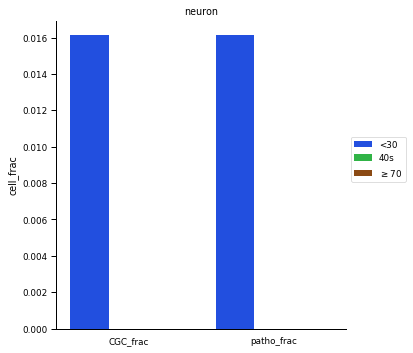

In [34]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_neuron_frac = neuron_frac.drop('decades', axis = 1)
long_form_neuron = pd.melt(new_neuron_frac)
decade = ['<30', '40s', r'$\geq$70', '<30', '40s', r'$\geq$70']
long_form_neuron['decade'] = decade
long_form_neuron = long_form_neuron.rename(columns = {'value':'cell_frac'})

long_form_neuron.head(len(long_form_neuron))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#1ac938', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_neuron, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('neuron')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/neuron.jpg", format="jpg", bbox_inches="tight")
plt.savefig("Mutations_Paper/neuronSNVs.jpg", format="jpg", bbox_inches="tight")

# Neuron - Oncogenic Potential

In [34]:
# For comparing SNVs, must get the number of oncogenic SNVs divided by exome
WES_bp = 45*10**6
WGS_bp = 3*10**9

neuron_muts_ct = 7356
snvs_frac = neuron_muts_ct/WES_bp

#print(len(exonic_lungsnvs)+len(exonic_lungindels), len(exonic_lungmuts))
print("SNV percentages for random mutations:", snvs_frac*100)

SNV percentages for random mutations: 0.016346666666666666


In [41]:
#For the neurons, there was only one oncogenic mutation and it was in the 70s; it doesnt have any indels

##SNVs
#Get the total SNVs that are in each decade
neuron30snvs = len(neuron_muts[neuron_muts.decades == '<30'])
neuron40snvs = len(neuron_muts[neuron_muts.decades == '40s'])
neuron70snvs = len(neuron_muts[neuron_muts.decades == '>=70'])

#Only one SNV is pathogenic and it's in the below 30 age group
#Divide the number of patho SNVs by total number of SNVs
neuron30snvs_oncFrac = 1/neuron30snvs
neuron40snvs_oncFrac = 0/neuron40snvs
neuron70snvs_oncFrac = 0/neuron70snvs

print(neuron30snvs_oncFrac, neuron40snvs_oncFrac, neuron70snvs_oncFrac)

neurononc_fracs = [neuron30snvs_oncFrac, neuron40snvs_oncFrac, neuron70snvs_oncFrac]
    
decades = ['<30', '40s', r'$\geq$70']
neurononc_frac = pd.DataFrame()
neurononc_frac['decades'] = decades
neurononc_frac['snvs'] = neurononc_fracs

neurononc_frac.head()

0.0005213764337851929 0.0 0.0


,decades,snvs
0,<30,0.000521
1,40s,0.000000
2,$\geq$70,0.000000


<Figure size 432x288 with 0 Axes>

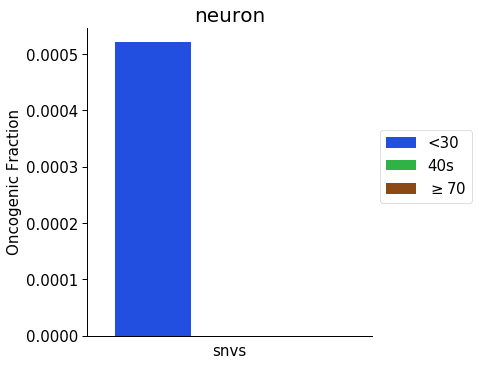

In [43]:
new_neurononc_frac = neurononc_frac.drop(['decades'], axis = 1)
long_form_neurononc_frac = pd.melt(new_neurononc_frac)
decade = ['<30', '40s', r'$\geq$70']
long_form_neurononc_frac['decade'] = decade
long_form_neurononc_frac = long_form_neurononc_frac.rename(columns = {'value':'cell_frac'})

#Now I need to make a bar graph of this data

colors = ['#023eff', '#1ac938', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff'] #30s:'#ff7c00', 50s: '#e8000b', 60s: '#8b2be2',

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_neurononc_frac, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'both', bottom=False, labelrotation = 0, labelsize = 15)
plt.title('neuron', fontsize = 20)
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('', fontsize = 15)
plt.ylabel('Oncogenic Fraction', fontsize = 15)
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55), fontsize = 15)
#plt.yscale('log')
plt.savefig("Mutations_Paper/neurononcNoTotal_frac.jpg", format="jpg", bbox_inches="tight")

# Blood

<a id='blood'></a>

In [5]:
blood_muts = pd.read_csv('Mutations_Paper/blood/blood_muts.csv')
blood_muts = blood_muts.rename(columns = {'Hugo_Symbol': 'gene', 'Reference_Allele':'ref', 'Tumor_Seq_Allele2': 'alt', \
                                         'Chromosome':'chr', 'Start_position': 'start', 'i_tumor_f_corr': 'vaf', 'id': 'sample'})
blood_muts = blood_muts.drop(blood_muts.columns[[1, 2, 3, 4, 6, 13, 14, 16]], axis = 1)

#blood_muts['age_new'] = blood_muts.age.str.partition('>')[2]

#Need to get decades
decades = []
num_samp_dec = []
for row in blood_muts.itertuples():
    if '>' in row[9]:
        decades.append('70s')
        num_samp_dec.append(2720)
    elif float(row[9]) < 30:
        decades.append('20s')
        num_samp_dec.append(240)
    elif float(row[9]) < 40:
        decades.append('30s')
        num_samp_dec.append(885)
    elif float(row[9]) < 50:
        decades.append('40s')
        num_samp_dec.append(2894)
    elif float(row[9]) < 60:
        decades.append('50s')
        num_samp_dec.append(5441)
    elif float(row[9]) < 70:
        decades.append('60s')
        num_samp_dec.append(5002)
    else:
        decades.append('70s')
        num_samp_dec.append(2720)

blood_muts['decades'] = decades
blood_muts['num_samp_dec'] = num_samp_dec
blood_muts['vaf_dec'] = blood_muts.vaf/blood_muts.num_samp_dec

#Now let's get the number of samples

blood_muts.head(len(blood_muts))

,gene,sample,Variant_Type,ref,alt,chr,start,vaf,age,decades,num_samp_dec,vaf_dec
0,TET2,id7611,DEL,C,-,4,106157731,0.290000,33,30s,885,0.000328
1,DNMT3A,id2523,DEL,C,-,2,25463208,0.040000,40,40s,2894,0.000014
2,DNMT3A,id362,SNP,G,A,2,25457243,0.196078,40,40s,2894,0.000068
3,TP53,id3959,SNP,G,A,17,7574003,0.067797,40,40s,2894,0.000023
4,SETD2,id7102,SNP,G,A,3,47158225,0.142857,40.33,40s,2894,0.000049
5,JAK2,id428,SNP,G,T,9,5073770,0.051095,41,40s,2894,0.000018
6,DNMT3A,id11120,SNP,T,C,2,25458696,0.103448,42,40s,2894,0.000036
7,ASXL1,id11131,SNP,C,T,20,31022817,0.060000,43,40s,2894,0.000021
8,DNMT3A,id10082,SNP,C,T,2,25469945,0.078947,43,40s,2894,0.000027
9,IDH2,id562,SNP,C,T,15,90631934,0.126437,43,40s,2894,0.000044


In [6]:
#Coding exon mutations only

print('total mutations:', len(blood_muts))

blood_muts = blood_muts.rename(columns = {'start': 'Start'})
blood_muts['End'] = blood_muts.Start + 1
blood_muts['Chromosome'] = 'chr' + blood_muts.chr.astype('str')
blood_py = pr.PyRanges(df = blood_muts)
blood_exons = blood_py.overlap(hg19exon_regions)
blood_muts = blood_exons.as_df()
print('mutations in exons:', len(blood_muts))
blood_muts = blood_muts.rename(columns =  {'Start': 'start'})

total mutations: 805
mutations in exons: 778


In [54]:
#blood_muts.insert(6, 'change', blood_muts.ref + '>' + blood_muts.alt)
wgs_merge = pd.merge(blood_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
wgs_merge = wgs_merge[(wgs_merge.fathmm_prediction == 'PATHOGENIC')]

blood_decade = blood_muts[blood_muts.Variant_Type == 'SNP'].groupby('decades').count()
blood_count = blood_decade.start

wgs_decade = wgs_merge.groupby('decades').count()
wgs_count = wgs_decade.start

print(len(wgs_merge))

print(blood_count)
print(wgs_count)

452
decades
40s    44 
50s    112
60s    228
70s    202
Name: start, dtype: int64
decades
40s    35 
50s    81 
60s    171
70s    165
Name: start, dtype: int64


In [19]:
#For indels, get # of indels in CGC genes/total indels in each group
blood_indel = blood_muts[blood_muts.Variant_Type != 'SNP']

blood_count = blood_indel.groupby('decades').count()
indel_count = blood_count.start

blood_CGC = blood_indel[blood_indel.gene.isin(CGC_genes)].groupby('decades').count()
CGC_count = blood_CGC.start

print(len(blood_indel))
print(indel_count, CGC_count)

192
decades
30s    1 
40s    5 
50s    31
60s    69
70s    86
Name: start, dtype: int64 decades
30s    1 
40s    3 
50s    29
60s    67
70s    82
Name: start, dtype: int64


In [52]:
# Positively selected for mutations

## Now I need the positively selected genes

#Positively selected genes in paper.
blood_genes = ['DNMT3A', 'TET2', 'ASXL1', 'JAK2', 'TP53', 'IDH1', 'IDH2']

tissue_pos = blood_muts[blood_muts.gene.isin(blood_genes)]

tissue_posSNV = tissue_pos[tissue_pos.Variant_Type == 'SNP']
tissue_posIndel = tissue_pos[tissue_pos.Variant_Type != 'SNP']

dec_vaftot = tissue_pos.groupby('decades')['vaf_dec'].sum()*2
dec_vaftotSNV = tissue_posSNV.groupby('decades')['vaf_dec'].sum()*2
dec_vaftotIndel = tissue_posIndel.groupby('decades')['vaf_dec'].sum()*2

dec_vaftot = pd.DataFrame(dec_vaftot)
dec_vaftotSNV = pd.DataFrame(dec_vaftotSNV)
dec_vaftotIndel = pd.DataFrame(dec_vaftotIndel)


print(dec_vaftot)
print(dec_vaftotSNV)
print(dec_vaftotIndel)

pos_sel = []
pos_selSNV = []
pos_selIndel = []

for row in dec_vaftot.itertuples():
    pos_sel.append(row[1])
for row in dec_vaftotSNV.itertuples():
    pos_selSNV.append(row[1])
for row in dec_vaftotIndel.itertuples():
    pos_selIndel.append(row[1])
pos_sel.insert(0, 0)
pos_selIndel.insert(0, 0)
pos_selSNV.insert(0, 0)
pos_selSNV.insert(1, 0)

decades = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70']

tissue_frac = pd.DataFrame()
tissue_fracSNV = pd.DataFrame()
tissue_fracIndel = pd.DataFrame()

tissue_frac['decades'] = decades
tissue_fracSNV['decades'] = decades
tissue_fracIndel['decades'] = decades

tissue_frac['pos_sel'] = pos_sel
tissue_fracSNV['pos_selSNV'] = pos_selSNV
tissue_fracIndel['pos_selIndel'] = pos_selIndel

print(len(blood_muts), len(tissue_pos))

#tissue_muts.head(3760)
dec_vaftot.head(len(dec_vaftot))
tissue_fracIndel.head(len(tissue_frac))

          vaf_dec
decades          
30s      0.000655
40s      0.002798
50s      0.004786
60s      0.011180
70s      0.023079
          vaf_dec
decades          
40s      0.002736
50s      0.003772
60s      0.007929
70s      0.015438
          vaf_dec
decades          
30s      0.000655
40s      0.000062
50s      0.001015
60s      0.003251
70s      0.007641
778 580


,decades,pos_selIndel
0,<30,0.000000
1,30s,0.000655
2,40s,0.000062
3,50s,0.001015
4,60s,0.003251
5,$\geq$70,0.007641


In [53]:
#Now we need the CGC and CGC patho

blood_muts['change'] = blood_muts.ref + '>' + blood_muts.alt

#Let's separate the indels and SNVs to effectively cross
tissue_indels = blood_muts[(blood_muts.Variant_Type != 'SNP')]
tissue_snvs = pd.concat([tissue_indels, blood_muts]).drop_duplicates(keep = False)
print(len(blood_muts), len(tissue_indels), len(tissue_snvs))


#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change']).sort_values(by = ['decades', 'sample'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'].sort_values(by = ['decades', 'sample', 'vaf']) #These are the pathogenic SNVs

#get the indels that are in CGC genes and concatenate with the CGC and patho snvs
tissue_CGC_indels = tissue_indels[tissue_indels.gene.isin(CGC_genes)]

tissue_CGC_total = pd.concat([tissue_CGC_merge, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample']) 
tissue_patho_total = pd.concat([tissue_patho_snvs, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample'])

CGC_frac = tissue_CGC_total.groupby('decades')['vaf_dec'].sum()*2
patho_frac = tissue_patho_total.groupby('decades')['vaf_dec'].sum()*2
CGC_fracSNV = tissue_CGC_merge.groupby('decades')['vaf_dec'].sum()*2
CGC_fracSNVpatho = tissue_patho_snvs.groupby('decades')['vaf_dec'].sum()*2
CGC_fracIndel = tissue_CGC_indels.groupby('decades')['vaf_dec'].sum()*2

CGC_frac = pd.DataFrame(CGC_frac)
patho_frac = pd.DataFrame(patho_frac)
CGC_fracSNV = pd.DataFrame(CGC_fracSNV)
CGC_fracSNVpatho = pd.DataFrame(CGC_fracSNVpatho)
CGC_fracIndel = pd.DataFrame(CGC_fracIndel)


print(CGC_frac)
print(patho_frac)
print(CGC_fracSNV)
print(CGC_fracSNVpatho)
print(CGC_fracIndel)

##Get the cell_fracs
tissue_CGC_frac = [] #lists for cell_fracs
tissue_patho_frac = []
tissue_CGC_fracSNV = []
tissue_CGC_fracSNVpatho = []
tissue_CGC_fracIndel = []

#get cell_fracs
for row in CGC_frac.itertuples():
    tissue_CGC_frac.append(row[1])
for row in patho_frac.itertuples():
    tissue_patho_frac.append(row[1])
for row in CGC_fracSNV.itertuples():
    tissue_CGC_fracSNV.append(row[1])
for row in CGC_fracSNVpatho.itertuples():
    tissue_CGC_fracSNVpatho.append(row[1])
for row in CGC_fracIndel.itertuples():
    tissue_CGC_fracIndel.append(row[1])
    
tissue_CGC_frac.insert(0, 0)
tissue_patho_frac.insert(0, 0)
tissue_CGC_fracSNV.insert(0, 0)
tissue_CGC_fracSNV.insert(1, 0)
tissue_CGC_fracSNVpatho.insert(0, 0)
tissue_CGC_fracSNVpatho.insert(1, 0)
tissue_CGC_fracIndel.insert(0, 0)
    
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac

tissue_fracSNV['CGC_fracSNV'] = tissue_CGC_fracSNV
tissue_fracSNV['patho_fracSNV'] = tissue_CGC_fracSNVpatho

tissue_fracIndel['CGC_fracIndel'] = tissue_CGC_fracIndel

#tissue_indels.head(len(tissue_indels))
tissue_frac.head(len(tissue_frac))
tissue_fracSNV.head()
tissue_fracIndel.head()

778 192 586
          vaf_dec
decades          
30s      0.000655
40s      0.003142
50s      0.004867
60s      0.013081
70s      0.027402
          vaf_dec
decades          
30s      0.000655
40s      0.002725
50s      0.004425
60s      0.012820
70s      0.026476
          vaf_dec
decades          
40s      0.003066
50s      0.003698
60s      0.009327
70s      0.018419
          vaf_dec
decades          
40s      0.002649
50s      0.003256
60s      0.009066
70s      0.017492
          vaf_dec
decades          
30s      0.000655
40s      0.000076
50s      0.001169
60s      0.003754
70s      0.008983


,decades,pos_selIndel,CGC_fracIndel
0,<30,0.000000,0.000000
1,30s,0.000655,0.000655
2,40s,0.000062,0.000076
3,50s,0.001015,0.001169
4,60s,0.003251,0.003754


In [54]:
blood_frac = tissue_frac
blood_fracSNV = tissue_fracSNV
blood_fracIndel = tissue_fracIndel

<Figure size 432x288 with 0 Axes>

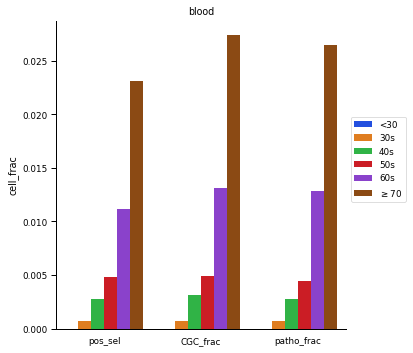

In [55]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_blood_frac = blood_frac.drop('decades', axis = 1)
long_form_blood = pd.melt(new_blood_frac)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_blood['decade'] = decade
long_form_blood = long_form_blood.rename(columns = {'value':'cell_frac'})

long_form_blood.head(len(long_form_blood))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_blood, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('blood')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/blood.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

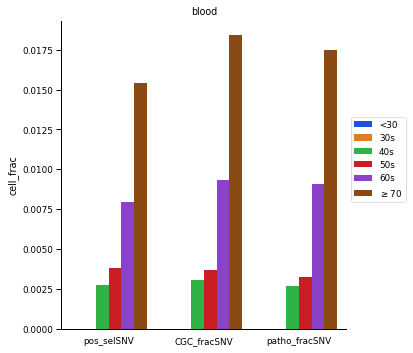

In [56]:
#Mutations of the SNVs

new_blood_fracSNV = blood_fracSNV.drop('decades', axis = 1)
long_form_bloodSNV = pd.melt(new_blood_fracSNV)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_bloodSNV['decade'] = decade
long_form_bloodSNV = long_form_bloodSNV.rename(columns = {'value':'cell_frac'})

long_form_bloodSNV.head(len(long_form_bloodSNV))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bloodSNV, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('blood')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/bloodSNVs.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

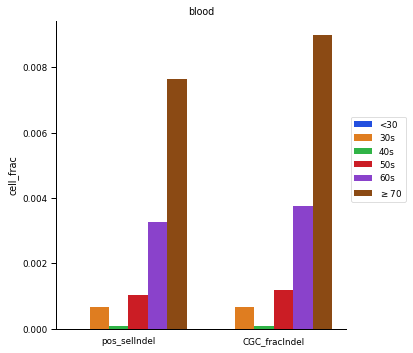

In [57]:
#Mutations of the indels

new_blood_fracIndel = blood_fracIndel.drop('decades', axis = 1)
long_form_bloodIndel = pd.melt(new_blood_fracIndel)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_bloodIndel['decade'] = decade
long_form_bloodIndel = long_form_bloodIndel.rename(columns = {'value':'cell_frac'})

long_form_bloodIndel.head(len(long_form_bloodIndel))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bloodIndel, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('blood')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/bloodIndels.jpg", format="jpg", bbox_inches="tight")

# Lung

<a id='lung'></a>

In [17]:
#Get all the SNV and indel muations in from Kenichi's paper and get them the appropriate genes (because he freaking didn't)

lung_indels = pd.read_excel('Mutations_Paper/Lung/Bronchial epithelium indels.xlsx', header = 0, sep = '\t')

lung_snvs = pd.read_excel('Mutations_Paper/Lung/Bronchial epithelium subs.xlsx', header = 0, sheet_name = None, sep = '\t') #sheet_name = None enables you to create a dictionary of dataframes for all the sheets in your Excel file
#There are 16 sheets of mutations

lung_allsnvs = pd.concat([df[['Sample', 'Chrom', 'Pos', 'Ref', 'Alt', 'DEP', 'MTR', 'VAF', 'Type']] for df in lung_snvs.values()]).reset_index(drop = True)

lung_muts = pd.concat([lung_allsnvs, lung_indels], sort = False).sort_values(by = ['Sample', 'Chrom']).reset_index().drop(columns = 'index', axis = 1)

lung_muts.columns = lung_muts.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '') #This makes the column names lowercase, replaces spaces with hyphens, removes parentheses, and removes the whitespaces on the left and right sides.


print(len(lung_indels), len(lung_snvs), len(lung_indels) + len(lung_allsnvs), len(lung_muts))

lung_muts.head()

73510 16 2357779 2357779


,sample,chrom,pos,ref,alt,dep,mtr,vaf,type
0,PD26988ab,1,1190558,C,A,24,9,0.375000,sub
1,PD26988ab,1,3593211,G,A,21,9,0.428571,sub
2,PD26988ab,1,4515356,T,A,23,13,0.565217,sub
3,PD26988ab,1,4884303,G,T,30,18,0.600000,sub
4,PD26988ab,1,5077432,C,T,31,16,0.516129,sub


In [23]:
print(lung_allsnvs.Sample.count())

2284269


In [24]:
#Need to have an end column for this; also need the chr to include 'chr'

lung_muts = lung_muts.rename(columns = {'pos': 'start', 'chrom': 'chr_x'})

lung_muts['end'] = lung_muts.start + 1
chroms = []
for row in lung_muts.itertuples():
    chroms.append('chr' + str(row[2]))
lung_muts['chr'] = chroms

import pysam
gencode_v38 = pysam.TabixFile('GENCODE/gencode.v38.annotation.gff3_all_known_genes.txt.sorted.formatted.bed.gz')

lung_muts['genes'] = lung_muts.apply(lambda x: gencode_all_known_genes(x[['chr', 'start', 'end']], gencode_v38), axis=1)

print(len(lung_muts))
lung_muts = lung_muts[lung_muts.genes != 'NA(0)'].reset_index(drop = True)
print(len(lung_muts))

#Now I want to break up the gene names if it overlaps. Make sure that I remove duplicates when starting to sum VAFs

print(len(lung_muts))
new_rows = []
for i,r in lung_muts.iterrows(): #iterrows uses (index, series) across the dataframe
    g_list = r['genes'].split(";") #split the genes if more than one gene is attributed to a genomic location
    for g in g_list:
        g = g.replace(" ","") #remove all spaces that is created by the splits
        new_rows.append(np.append(r[['sample', 'chr_x', 'chr', 'start', 'ref', 'alt','mtr', 'dep', 'vaf', 'type', 'end', 'genes']].values, g))#g is copied to the array of data in the dataframe

lung_muts_perGene = pd.DataFrame()
lung_muts_perGene = lung_muts_perGene.append(pd.DataFrame(new_rows, columns=['sample', 'chr_x', 'chr', 'start', 'ref', 'alt','mtr', \
                                                                             'dep', 'vaf', 'type', 'end', 'genes', 'gene_ID'])).reset_index().drop('index', axis=1)

lung_muts_perGene['gene_name'] = lung_muts_perGene['gene_ID'].apply(lambda x: x.split("(")[0])
lung_muts_perGene['gene_coverage'] = lung_muts_perGene['gene_ID'].apply(lambda x: x.split("(")[1].replace(")", ""))

lung_muts_perGene = lung_muts_perGene.drop(['genes', 'gene_ID', 'gene_coverage'], axis = 1)

print(len(lung_muts_perGene))

lung_muts = lung_muts_perGene.drop(['chr', 'end'], axis = 1)
lung_muts = lung_muts.rename(columns = {'gene_name': 'gene', 'chr_x': 'chr'})
    
lung_muts.to_csv('Mutations_Paper/Lung/TGS+genes.csv', index = False)
lung_muts.head()

2357779
893951
893951
935459


,sample,chr,start,ref,alt,mtr,dep,vaf,type,gene
0,PD26988ab,1,1190558,C,A,9,24,0.375000,sub,TTLL10
1,PD26988ab,1,3593211,G,A,9,21,0.428571,sub,MEGF6
2,PD26988ab,1,6053886,C,T,11,21,0.523810,sub,KCNAB2
3,PD26988ab,1,6832226,C,T,12,23,0.521739,sub,CAMTA1
4,PD26988ab,1,10168183,G,C,8,16,0.500000,sub,UBE4B


In [10]:
lung_muts = pd.read_csv('Mutations_Paper/Lung/TGS+genes.csv', sep = ',', header = 0)
print(len(lung_muts))
lung_muts = lung_muts.drop_duplicates(keep = 'first')
print(len(lung_muts))
lung_muts.head()

935459
935459


,sample,chr,start,ref,alt,mtr,dep,vaf,type,gene
0,PD26988ab,1,1190558,C,A,9,24,0.375000,sub,TTLL10
1,PD26988ab,1,3593211,G,A,9,21,0.428571,sub,MEGF6
2,PD26988ab,1,6053886,C,T,11,21,0.523810,sub,KCNAB2
3,PD26988ab,1,6832226,C,T,12,23,0.521739,sub,CAMTA1
4,PD26988ab,1,10168183,G,C,8,16,0.500000,sub,UBE4B


In [11]:
##Need decades, number of samples per decade, and vaf per samples in decade into dataframe

decades = []
dec_num_samps = []
for row in lung_muts.itertuples():
    if '37454' in row[1] or '34205' in row[1]:
        decades.append('50s')
        dec_num_samps.append(59+30)
    elif '37453' in row[1] or '37455' in row[1] or '37456' in row[1]:
        decades.append('20s')
        dec_num_samps.append(30+27+28)
    elif '34204' in row[1] or '34207' in row[1] or '34210' in row[1]:
        decades.append('60s')
        dec_num_samps.append(60+57+47)
    else:
        decades.append('70s')
        dec_num_samps.append(26+13+55+56+49+58+30+37)

lung_muts['decades'] = decades
lung_muts['dec_num_samps'] = dec_num_samps
lung_muts['vaf_dec'] = lung_muts.vaf/dec_num_samps

#Manually check to make sure that the 70s have matching IDs... it was good :)
#lung70s = lung_muts[lung_muts.decades == '70s'].drop_duplicates(subset = 'sample', keep = 'first').sort_values(by = 'sample')

#Make sure all of the MNVs are converted to SNVs
print('lung_muts in exons:', len(lung_muts))
samp_mnvs = lung_muts[(lung_muts.ref.str.len() != 1) & (lung_muts.ref.str.len() == lung_muts.alt.str.len()) & (lung_muts.alt != 'INS')] #There are multi-nucleotide variants that need to be converted to SNVs
print('total samp_mnvs', len(samp_mnvs))
#Remove the MNVs from the all_muts dataframe; concatenate the converted MNVs later
mnvs_indices = []
for row in samp_mnvs.itertuples():
    mnvs_indices.append(row[0])
nomnvs = lung_muts.drop(index = mnvs_indices)

#This is the code that turns the MNVS into SNVs that can be cross-references with CGC mutations.

refs = []
#This is the code that will be used to get the ref nucleotides from MNVs
for i in samp_mnvs.ref:
    for j in range(0, len(i)):
        refs.append(i[j])

alts = []
#This is the code that will be used to get the alt nucleotides from MNVs
for i in samp_mnvs.alt:
    for j in range(0, len(i)):
        alts.append(i[j])

#This gives the number of times a MNV needs to be in the dataframe to turn them in to SNVs
duplicates = []
for i in samp_mnvs.ref:
    duplicates.append(len(i))

#Get the numbers that must be added to the 'start' genomic locations for them to be SNVs
addends = []
for i in samp_mnvs.ref:
    for j in range(0, len(i)):
        addends.append(j)

# Get the genomic locations for each of the SNVs that are borne out of the MNVs
starts = list(np.repeat(samp_mnvs.start.values, duplicates, axis = 0)) #This makes a list of of the start positions in the MNV dataframe that are duplicated the number of times needed to make the MNVs into SNVs
start = [a + b for a,b in zip(starts, addends)] #This is comprehension form, but it gets the sum of the addends with the start position for the MNVs to yield start positions for each SNV

# Make the dataframe
samp_mnvs2 = pd.DataFrame(np.repeat(samp_mnvs.values, duplicates, axis = 0), columns = samp_mnvs.columns) #This makes the dataframe with mnvs entries but the entries are duplicated to convert the MNVs to SNVs
samp_mnvs2.ref = refs #Single nucleotide reference
samp_mnvs2.alt = alts #variant nucleotides
samp_mnvs2.start = start #genomic positions of SNV

#MNVs are just variants that are somewhat close to each other. Therefore, there are some 'SNVs' in the resulting dataframe where ref and alt are the same. We can drop those.
#samp_mnvs2.drop([samp_mnvs2.ref.values == samp_mnvs2.alt.values])
#32 'mutations' in the MNVs were simply trapped between nucleotide changes and weren't actual mutations.
non_snvs = []
for row in samp_mnvs2.itertuples():
    if row[4] == row[5]:
        non_snvs.append((row[0]))
        
for i in non_snvs:
    samp_mnvs2.drop(i, inplace = True)


#Concatenate the single nucleotides with the SNVs from the MNVs
lung_muts = pd.concat([nomnvs, samp_mnvs2], sort = False, ignore_index = True).sort_values(by = ['sample', 'vaf']).reset_index(drop = True)

"""lung_muts = lung_muts[(lung_muts.vaf >= 0.3) & (lung_muts.dep >= 8)]

lowvaf_muts = lung_muts[lung_muts.vaf < 0.5]
print('lung_muts with VAFs below 0.5:', len(lowvaf_muts), 'percentage:', len(lowvaf_muts)/len(lung_muts))
exonic_lungmuts = lung_muts
print(len(samp_mnvs), len(lung_muts))"""

samp_mnvs.head(len(samp_mnvs))
lung_muts.head()

lung_muts in exons: 935459
total samp_mnvs 0


,sample,chr,start,ref,alt,mtr,dep,vaf,type,gene,decades,dec_num_samps,vaf_dec
0,PD26988ab,21,21524626.0,C,A,3,18,0.166667,sub,NCAM2,70s,324,0.000514
1,PD26988ab,4,97467081.0,G,T,5,25,0.200000,sub,STPG2,70s,324,0.000617
2,PD26988ab,10,122598749.0,A,G,3,15,0.200000,sub,DMBT1,70s,324,0.000617
3,PD26988ab,5,22679270.0,A,G,5,24,0.208333,sub,CDH12,70s,324,0.000643
4,PD26988ab,1,101883239.0,G,C,3,14,0.214286,sub,OLFM3,70s,324,0.000661


In [12]:
#Exonic mutations

print('total mutations:', len(lung_muts))
lung_muts = lung_muts.rename(columns = {'start': 'Start'})
lung_muts['End'] = lung_muts.Start + 1
lung_muts['Chromosome'] = 'chr' + lung_muts.chr.astype('str')
lung_py = pr.PyRanges(df = lung_muts)
lung_exons = lung_py.overlap(hg38exon_regions)
lung_muts = lung_exons.as_df()
print('mutations in exons:', len(lung_muts))
lung_muts = lung_muts.rename(columns =  {'Start': 'start'})

total mutations: 935459
mutations in exons: 23728


In [42]:
lung_muts.insert(6, 'change', lung_muts.ref + '>' + lung_muts.alt)
wgs_merge = pd.merge(lung_muts, cosmic38_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
wgs_merge = wgs_merge[(wgs_merge.fathmm_prediction == 'PATHOGENIC')]

lung_decade = lung_muts.groupby('decades').count()
lung_count = lung_decade.start

wgs_decade = wgs_merge.groupby('decades').count()
wgs_count = wgs_decade.start

print(len(wgs_merge))

print(lung_count)
print(wgs_count)

13
decades
20s    204  
50s    2056 
60s    8138 
70s    13330
Name: start, dtype: int64
decades
60s    4
70s    9
Name: start, dtype: int64


In [16]:
#For indels, get # of indels in CGC genes/total indels in each group
lung_indel = lung_muts[lung_muts.type != 'sub']

lung_count = lung_indel.groupby('decades').count()
indel_count = lung_count.start

lung_CGC = lung_indel[lung_indel.gene.isin(CGC_genes)].groupby('decades').count()
CGC_count = lung_CGC.start

print(len(lung_indel))
print(indel_count, CGC_count, CGC_count.sum())

757
decades
20s    7  
50s    67 
60s    241
70s    442
Name: start, dtype: int64 decades
50s    3 
60s    10
70s    19
Name: start, dtype: int64 32


In [43]:
lung_snvs = lung_muts[lung_muts.type == 'sub']
print(len(lung_snvs))

22971


In [30]:
#Positively selected genes in paper.

lung_genes = ['TP53', 'NOTCH1', 'FAT1', 'CHEK2', 'PTEN', 'ARID1A', 'ARID2', 'IDH1', 'EP300', 'CREBBP', 'PIK3CA']

tissue_pos = lung_muts[lung_muts.gene.isin(lung_genes)].sort_values(by = 'sample')

tissue_posSNV = tissue_pos[(tissue_pos.type == 'sub')].drop_duplicates(subset = 'sample')
tissue_posIndel = tissue_pos[(tissue_pos.type != 'sub')].drop_duplicates(subset = 'sample')

print(len(tissue_pos), len(tissue_posSNV)+ len(tissue_posIndel))

tissue_pos = tissue_pos.drop_duplicates(subset = 'sample')

lung20spos = tissue_pos[tissue_pos.decades == '20s']
lung50spos = tissue_pos[tissue_pos.decades == '50s']
lung60spos = tissue_pos[tissue_pos.decades == '60s']
lung70spos = tissue_pos[tissue_pos.decades == '70s']

lung20sposSNV = tissue_posSNV[tissue_posSNV.decades == '20s']
lung50sposSNV = tissue_posSNV[tissue_posSNV.decades == '50s']
lung60sposSNV = tissue_posSNV[tissue_posSNV.decades == '60s']
lung70sposSNV = tissue_posSNV[tissue_posSNV.decades == '70s']

lung20sposIndel = tissue_posIndel[tissue_posIndel.decades == '20s']
lung50sposIndel = tissue_posIndel[tissue_posIndel.decades == '50s']
lung60sposIndel = tissue_posIndel[tissue_posIndel.decades == '60s']
lung70sposIndel = tissue_posIndel[tissue_posIndel.decades == '70s']


pos_sel = [len(lung20spos)/85, len(lung50spos)/79, len(lung60spos)/153, len(lung70spos)/315]
pos_selSNV = [len(lung20sposSNV)/85, len(lung50sposSNV)/79, len(lung60sposSNV)/153, len(lung70sposSNV)/315]
pos_selIndel = [len(lung20sposIndel)/85, len(lung50sposIndel)/79, len(lung60sposIndel)/153, len(lung70sposIndel)/315]

decades = ['<30', '50s', '60s', r'$\geq$70']

tissue_frac = pd.DataFrame()
tissue_fracSNV = pd.DataFrame()
tissue_fracIndel = pd.DataFrame()

tissue_frac['decades'] = decades
tissue_fracSNV['decades'] = decades
tissue_fracIndel['decades'] = decades

tissue_frac['pos_sel'] = pos_sel
tissue_fracSNV['pos_selSNV'] = pos_selSNV
tissue_fracIndel['pos_selIndel'] = pos_selIndel

print(len(lung_muts), len(tissue_pos), len(tissue_posSNV))

#tissue_muts.head(3760)
#dec_vaftot.head(len(dec_vaftot))
tissue_fracIndel.head()
tissue_fracSNV.head()

40 36
23728 36 34


,decades,pos_selSNV
0,<30,0.000000
1,50s,0.025316
2,60s,0.071895
3,$\geq$70,0.066667


In [36]:
#Cross them with the CGC and CGC_patho

lung_muts['change'] = lung_muts.ref + '>' + lung_muts.alt

#Let's separate the indels and SNVs to effectively cross
tissue_indels = lung_muts[(lung_muts.type != 'sub')]
tissue_snvs = pd.concat([tissue_indels, lung_muts]).drop_duplicates(keep = False)
print(len(lung_muts), len(tissue_indels) + len(tissue_snvs))


#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic38_snvsLight, how = 'inner', on = ['gene', 'start', 'change']).sort_values(by = ['decades', 'sample'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'].sort_values(by = ['decades', 'sample', 'vaf']) #These are the pathogenic SNVs

#get the indels that are in CGC genes and concatenate with the CGC and patho snvs
tissue_CGC_indels = tissue_indels[tissue_indels.gene.isin(CGC_genes)]

tissue_CGC_total = pd.concat([tissue_CGC_merge, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample']) 
tissue_patho_total = pd.concat([tissue_patho_snvs, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample'])
print(len(tissue_CGC_total), len(tissue_patho_total))

#Now I need to take one mutation per sample and divide by the total number of samples
#tissue_CGC_total = tissue_CGC_total.loc[tissue_CGC_total.groupby('sample')['vaf'].idxmax()].sort_values(by = 'vaf')
#tissue_patho_total = tissue_patho_total.loc[tissue_patho_total.groupby('sample')['vaf'].idxmax()].sort_values(by = 'vaf')
print(len(tissue_CGC_total), len(tissue_patho_total))

#Get dataframes for each decade
lung20sCGC = tissue_CGC_total[tissue_CGC_total.decades == '20s'].drop_duplicates(subset = 'sample')
lung50sCGC = tissue_CGC_total[tissue_CGC_total.decades == '50s'].drop_duplicates(subset = 'sample')
lung60sCGC = tissue_CGC_total[tissue_CGC_total.decades == '60s'].drop_duplicates(subset = 'sample')
lung70sCGC = tissue_CGC_total[tissue_CGC_total.decades == '70s'].drop_duplicates(subset = 'sample')

lung20spatho = tissue_patho_total[tissue_patho_total.decades == '20s'].drop_duplicates(subset = 'sample')
lung50spatho = tissue_patho_total[tissue_patho_total.decades == '50s'].drop_duplicates(subset = 'sample')
lung60spatho = tissue_patho_total[tissue_patho_total.decades == '60s'].drop_duplicates(subset = 'sample')
lung70spatho = tissue_patho_total[tissue_patho_total.decades == '70s'].drop_duplicates(subset = 'sample')

lung20sCGCSNV = tissue_CGC_merge[tissue_CGC_merge.decades == '20s'].drop_duplicates(subset = 'sample')
lung50sCGCSNV = tissue_CGC_merge[tissue_CGC_merge.decades == '50s'].drop_duplicates(subset = 'sample')
lung60sCGCSNV = tissue_CGC_merge[tissue_CGC_merge.decades == '60s'].drop_duplicates(subset = 'sample')
lung70sCGCSNV = tissue_CGC_merge[tissue_CGC_merge.decades == '70s'].drop_duplicates(subset = 'sample')

lung20spathoSNV = tissue_patho_snvs[tissue_patho_snvs.decades == '20s'].drop_duplicates(subset = 'sample')
lung50spathoSNV = tissue_patho_snvs[tissue_patho_snvs.decades == '50s'].drop_duplicates(subset = 'sample')
lung60spathoSNV = tissue_patho_snvs[tissue_patho_snvs.decades == '60s'].drop_duplicates(subset = 'sample')
lung70spathoSNV = tissue_patho_snvs[tissue_patho_snvs.decades == '70s'].drop_duplicates(subset = 'sample')

lung20sCGCIndel = tissue_CGC_indels[tissue_CGC_indels.decades == '20s'].drop_duplicates(subset = 'sample')
lung50sCGCIndel = tissue_CGC_indels[tissue_CGC_indels.decades == '50s'].drop_duplicates(subset = 'sample')
lung60sCGCIndel = tissue_CGC_indels[tissue_CGC_indels.decades == '60s'].drop_duplicates(subset = 'sample')
lung70sCGCIndel = tissue_CGC_indels[tissue_CGC_indels.decades == '70s'].drop_duplicates(subset = 'sample')

##Get the cell_fracs

##Get the cell_fracs
tissue_CGC_frac = [len(lung20sCGC)/85, len(lung50sCGC)/79, len(lung60sCGC)/153, len(lung70sCGC)/315] #lists for cell_fracs
tissue_patho_frac = [len(lung20spatho)/85, len(lung50spatho)/79, len(lung60spatho)/153, len(lung70spatho)/315]
tissue_CGC_fracSNV = [len(lung20sCGCSNV)/85, len(lung50sCGCSNV)/79, len(lung60sCGCSNV)/153, len(lung70sCGCSNV)/315]
tissue_CGC_fracSNVpatho = [len(lung20spathoSNV)/85, len(lung50spathoSNV)/79, len(lung60spathoSNV)/153, len(lung70spathoSNV)/315]
tissue_CGC_fracIndel = [len(lung20sCGCIndel)/85, len(lung50sCGCIndel)/79, len(lung60sCGCIndel)/153, len(lung70sCGCIndel)/315]

    
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac

tissue_fracSNV['CGC_fracSNV'] = tissue_CGC_fracSNV
tissue_fracSNV['patho_fracSNV'] = tissue_CGC_fracSNVpatho

tissue_fracIndel['CGC_fracIndel'] = tissue_CGC_fracIndel

#tissue_indels.head(len(tissue_indels))
tissue_indels.head(len(tissue_indels))
tissue_fracSNV.head(len(tissue_frac))

23728 23728
48 45
48 45


,decades,pos_selSNV,CGC_fracSNV,patho_fracSNV
0,<30,0.000000,0.000000,0.000000
1,50s,0.025316,0.000000,0.000000
2,60s,0.071895,0.039216,0.026144
3,$\geq$70,0.066667,0.031746,0.028571


In [37]:
lung_frac = tissue_frac
lung_fracSNV = tissue_fracSNV
lung_fracIndel = tissue_fracIndel

<Figure size 432x288 with 0 Axes>

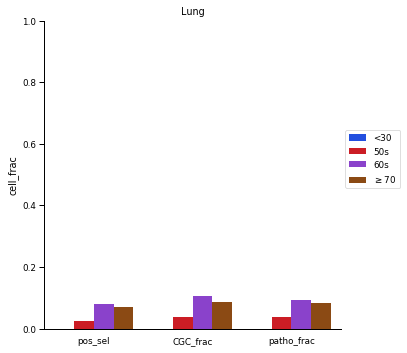

In [38]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_lung_frac = lung_frac.drop('decades', axis = 1)
long_form_lung = pd.melt(new_lung_frac)
decade = ['<30', '50s', '60s', r'$\geq$70', '<30', '50s', '60s', r'$\geq$70', '<30', '50s', '60s', r'$\geq$70']
long_form_lung['decade'] = decade
long_form_lung = long_form_lung.rename(columns = {'value':'cell_frac'})

long_form_lung.head(len(long_form_lung))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_lung, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Lung')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/lung.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

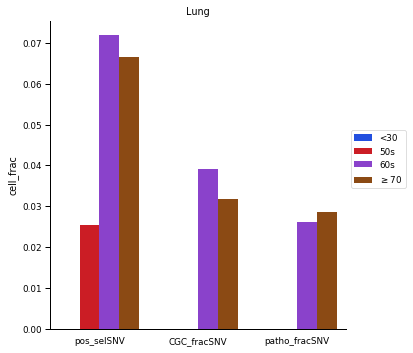

In [41]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_lung_fracSNV = lung_fracSNV.drop('decades', axis = 1)
long_form_lungSNV = pd.melt(new_lung_fracSNV)
decade = ['<30', '50s', '60s', r'$\geq$70', '<30', '50s', '60s', r'$\geq$70', '<30', '50s', '60s', r'$\geq$70']
long_form_lungSNV['decade'] = decade
long_form_lungSNV = long_form_lungSNV.rename(columns = {'value':'cell_frac'})

long_form_lungSNV.head(len(long_form_lungSNV))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_lungSNV, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Lung')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/lungSNV.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

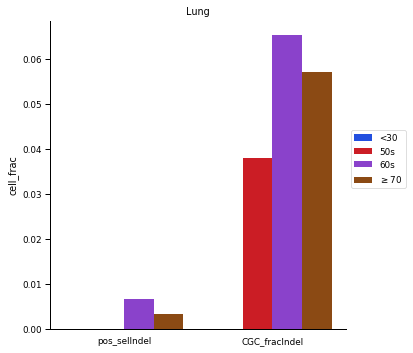

In [40]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_lung_fracIndel = lung_fracIndel.drop('decades', axis = 1)
long_form_lungIndel = pd.melt(new_lung_fracIndel)
decade = ['<30', '50s', '60s', r'$\geq$70', '<30', '50s', '60s', r'$\geq$70']
long_form_lungIndel['decade'] = decade
long_form_lungIndel = long_form_lungIndel.rename(columns = {'value':'cell_frac'})

long_form_lungIndel.head(len(long_form_lungIndel))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_lungIndel, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Lung')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/lungIndel.jpg", format="jpg", bbox_inches="tight")

# Lung - Oncogenic Prevalence

In [17]:
# For comparing SNVs, must get the number of oncogenic SNVs divided by exome
WES_bp = 45*10**6
WGS_bp = 3*10**9

exonic_lungsnvs = exonic_lungmuts[exonic_lungmuts.type == 'sub']
exonic_lungindels = exonic_lungmuts[exonic_lungmuts.type != 'sub']
snvs_count = (exonic_lungsnvs.decades.count())/WES_bp

#print(len(exonic_lungsnvs)+len(exonic_lungindels), len(exonic_lungmuts))
print("SNV percentages for random mutations:", snvs_count*100)
#There are 723 CGC genes and 20257 protein coding genes overall
# If indels are actually occurring at a higher rate than this
print("Indel percentage for random mutations:", 723/20257*100)

SNV percentages for random mutations: 1.858488888888889
Indel percentage for random mutations: 3.5691365947573677


In [24]:
hg19df = hg19exon_regions.as_df()
print(len(hg19df))
hg19df = hg19df.drop_duplicates(subset = 'Start', keep = 'first')
print(len(hg19df))
hg19df = hg19df.drop_duplicates(subset = 'End', keep = 'first')
print(len(hg19df))

total = 0
for row in hg19df.itertuples():
    total += row[3] - row[2]

print(250000/total)
hg19df.head(20)

591439
224058
211370
0.006919104377844651


,Chromosome,Start,End,Name,Score,Strand
0,chr1,12189,12227,uc010nxq.1_cds_0_0_chr1_12190_f,0,+
1,chr1,12594,12721,uc010nxq.1_cds_1_0_chr1_12595_f,0,+
2,chr1,13402,13639,uc010nxq.1_cds_2_0_chr1_13403_f,0,+
3,chr1,69090,70008,uc001aal.1_cds_0_0_chr1_69091_f,0,+
4,chr1,324514,324686,uc021oeh.1_cds_1_0_chr1_324515_f,0,+
5,chr1,324718,325124,uc021oeh.1_cds_2_0_chr1_324719_f,0,+
6,chr1,325382,325605,uc021oeh.1_cds_3_0_chr1_325383_f,0,+
7,chr1,324342,324345,uc009vjk.2_cds_1_0_chr1_324343_f,0,+
9,chr1,327745,328213,uc021oei.1_cds_0_0_chr1_327746_f,0,+
12,chr1,367658,368597,uc010nxu.2_cds_0_0_chr1_367659_f,0,+


In [10]:
9/96

0.09375

In [19]:
tissue_patho_snvs3 = tissue_patho_snvs.sort_values(by = 'decades')
tissue_patho_snvs3.head()

,sample,chr_x,start,ref,alt,mtr,dep,vaf,type,gene,decades,dec_num_samps,vaf_dec,change,gene_name,accession_number,gene_cds_length,hgnc_id,sample_name,id_sample,id_tumour,primary_site,site_subtype_1,site_subtype_2,site_subtype_3,primary_histology,histology_subtype_1,histology_subtype_2,histology_subtype_3,genome-wide_screen,genomic_mutation_id,legacy_mutation_id,mutation_id,mutation_cds,mutation_aa,mutation_description,mutation_zygosity,loh,grch,mutation_genome_position,chr_y,end,mutation_strand,snp,resistance_mutation,fathmm_prediction,fathmm_score,mutation_somatic_status,pubmed_pmid,id_study,sample_type,tumour_origin,age,tier,hgvsp,hgvsc,hgvsg
6,PD34204ah,5,24492926.0,C,A,9,18,0.500000,sub,CDH10,60s,164,0.003049,C>A,CDH10,ENST00000264463.8,3438,1749,TCGA-86-8585-01,2194834,2063112,lung,NS,NS,NS,carcinoma,adenocarcinoma,NS,NS,y,COSV52570414,COSM4168085,94622683,c.1516-1G>T,p.?,Unknown,NaN,NaN,38.0,5:24492926-24492926,chr5,24492926,-,n,-,PATHOGENIC,0.98797,Confirmed somatic variant,NaN,417.0,NS,NS,57.0,2,NaN,ENST00000264463.8:c.1516-1G>T,5:g.24492926C>A
43,PD34210al,16,9764572.0,G,A,9,14,0.642857,sub,GRIN2A,60s,164,0.003920,G>A,GRIN2A,ENST00000396573.6,14450,4585,YUKLAB,2013569,1896201,skin,NS,NS,NS,malignant_melanoma,NS,NS,NS,y,COSV58030853,COSM1708742,121030732,c.2972C>T,p.S991F,Substitution - Missense,het,NaN,38.0,16:9764572-9764572,chr16,9764572,-,n,-,PATHOGENIC,0.98807,Confirmed somatic variant,22842228.0,NaN,surgery fresh/frozen,metastasis,84.0,1,ENSP00000379818.2:p.Ser991Phe,ENST00000396573.6:c.2972C>T,16:g.9764572G>A
42,PD34210ac,9,9193038.0,C,T,10,17,0.588235,sub,PTPRD,60s,164,0.003587,C>T,PTPRD,ENST00000381196.8,9911,9668,OSCC-GB_01400111,2549741,2411196,upper_aerodigestive_tract,mouth,NS,NS,carcinoma,NS,NS,NS,y,COSV67011417,COSN23813349,170386299,c.-202-9675G>A,p.?,Unknown,NaN,NaN,38.0,9:9193038-9193038,chr9,9193038,-,n,-,PATHOGENIC,0.80378,Confirmed somatic variant,NaN,539.0,NS,primary,59.0,2,NaN,ENST00000381196.8:c.-202-9675G>A,9:g.9193038C>T
29,PD34207ak,14,92835570.0,C,T,10,16,0.625000,sub,GOLGA5,60s,164,0.003811,C>T,GOLGA5,ENST00000163416.6,2969,4428,T3496,2658667,2518826,large_intestine,NS,NS,NS,carcinoma,adenocarcinoma,NS,NS,y,COSV50833636,COSM2252128,93897002,c.1957C>T,p.R653*,Substitution - Nonsense,NaN,NaN,38.0,14:92835570-92835570,chr14,92835570,+,n,-,PATHOGENIC,0.97812,Confirmed somatic variant,27149842.0,NaN,NS,NS,90.0,1,ENSP00000163416.2:p.Arg653Ter,ENST00000163416.6:c.1957C>T,14:g.92835570C>T
47,PD34210n,12,111418152.0,G,T,13,18,0.722222,sub,SH2B3,60s,164,0.004404,G>T,SH2B3,ENST00000341259.6,5406,29605,TCGA-O2-A52S-01,2385922,2248754,lung,NS,NS,NS,carcinoma,squamous_cell_carcinoma,NS,NS,y,COSV100374414,COSM8753991,166265677,c.7G>T,p.G3W,Substitution - Missense,NaN,NaN,38.0,12:111418152-111418152,chr12,111418152,+,n,-,PATHOGENIC,0.98266,Confirmed somatic variant,NaN,418.0,NS,primary,57.0,1,ENSP00000345492.2:p.Gly3Trp,ENST00000341259.6:c.7G>T,12:g.111418152G>T


In [15]:
##SNVs
#Get the total SNVs that are in each decade
lung30snvs = tissue_snvs[tissue_snvs.decades == '20s']
lung50snvs = tissue_snvs[tissue_snvs.decades == '50s']
lung60snvs = tissue_snvs[tissue_snvs.decades == '60s']
lung70snvs = tissue_snvs[tissue_snvs.decades == '70s']

#Get the snvs that are in CGC and pathogenic
lung30patho_snvs = tissue_patho_snvs[tissue_patho_snvs.decades == '20s']
lung50patho_snvs = tissue_patho_snvs[tissue_patho_snvs.decades == '50s']
lung60patho_snvs = tissue_patho_snvs[tissue_patho_snvs.decades == '60s']
lung70patho_snvs = tissue_patho_snvs[tissue_patho_snvs.decades == '70s']

#Divide the number of patho SNVs by total number of SNVs
lung30snvs_oncFrac = lung30patho_snvs.decades.count()/lung30snvs.decades.count() #all mutations must be indels
lung50snvs_oncFrac = lung50patho_snvs.decades.count()/lung50snvs.decades.count() #all patho mutations are indels
lung60snvs_oncFrac = lung60patho_snvs.decades.count()/lung60snvs.decades.count()
lung70snvs_oncFrac = lung70patho_snvs.decades.count()/lung70snvs.decades.count()
print(lung30snvs_oncFrac, lung50snvs_oncFrac, lung60snvs_oncFrac, lung70snvs_oncFrac)

lungonc_fracs = [lung30snvs_oncFrac, lung50snvs_oncFrac, lung60snvs_oncFrac, lung70snvs_oncFrac]
    
decades = ['<30', '50s', '60s', r'$\geq$70']
lungonc_frac = pd.DataFrame()
lungonc_frac['decades'] = decades
lungonc_frac['snvs'] = lungonc_fracs

print(tissue_patho_total.decades.count())
print(len(lung30snvs), len(lung50snvs))
lungonc_frac.head()

0.0 0.0 3.1671517100859706e-05 1.662762638554893e-05
520
5933 65093


,decades,snvs
0,<30,0.000000
1,50s,0.000000
2,60s,0.000032
3,$\geq$70,0.000017


In [20]:
#Indels
lung30indels = tissue_indels[tissue_indels.decades == '20s']
lung50indels = tissue_indels[tissue_indels.decades == '50s']
lung60indels = tissue_indels[tissue_indels.decades == '60s']
lung70indels = tissue_indels[tissue_indels.decades == '70s']

lung30patho_indels = tissue_CGC_indels[tissue_CGC_indels.decades == '20s']
lung50patho_indels = tissue_CGC_indels[tissue_CGC_indels.decades == '50s']
lung60patho_indels = tissue_CGC_indels[tissue_CGC_indels.decades == '60s']
lung70patho_indels = tissue_CGC_indels[tissue_CGC_indels.decades == '70s']

lung30indels_oncFrac = lung30patho_indels.decades.count()/lung30indels.decades.count()
lung50indels_oncFrac = lung50patho_indels.decades.count()/lung50indels.decades.count()
lung60indels_oncFrac = lung60patho_indels.decades.count()/lung60indels.decades.count()
lung70indels_oncFrac = lung70patho_indels.decades.count()/lung70indels.decades.count()
print(lung30indels_oncFrac, lung50indels_oncFrac, lung60indels_oncFrac, lung70indels_oncFrac)

lungonc_fracsIndels = [lung30indels_oncFrac, lung50indels_oncFrac, lung60indels_oncFrac, lung70indels_oncFrac] 

lungonc_frac['indels'] = lungonc_fracsIndels
lungonc_frac.head()


0.046511627906976744 0.07959542656112577 0.08570452993398589 0.07413860940925186


,decades,snvs,indels
0,<30,0.000000,0.046512
1,50s,0.000000,0.079595
2,60s,0.000032,0.085705
3,$\geq$70,0.000017,0.074139


In [21]:
##All mutations
lung30all = lung_muts[lung_muts.decades == '20s']
lung50all = lung_muts[lung_muts.decades == '50s']
lung60all = lung_muts[lung_muts.decades == '60s']
lung70all = lung_muts[lung_muts.decades == '70s']

lung30patho_all = tissue_patho_total[tissue_patho_total.decades == '20s']
lung50patho_all = tissue_patho_total[tissue_patho_total.decades == '50s']
lung60patho_all = tissue_patho_total[tissue_patho_total.decades == '60s']
lung70patho_all = tissue_patho_total[tissue_patho_total.decades == '70s']

lung30all_oncFrac = lung30patho_all.decades.count()/lung30all.decades.count() #all must be all
lung50all_oncFrac = lung50patho_all.decades.count()/lung50all.decades.count()
lung60all_oncFrac = lung60patho_all.decades.count()/lung60all.decades.count()
lung70all_oncFrac = lung70patho_all.decades.count()/lung70all.decades.count()
print(lung30all_oncFrac, lung50all_oncFrac, lung60all_oncFrac, lung70all_oncFrac)

lungonc_fracsAll = [lung30all_oncFrac, lung50all_oncFrac, lung60all_oncFrac, lung70all_oncFrac]

lungonc_frac['total'] = lungonc_fracsAll

lungonc_frac.head()


0.0016152479405588758 0.000994552228836077 0.0004983734592238345 0.0005952882036727479


,decades,snvs,indels,total
0,<30,0.000000,0.046512,0.001615
1,50s,0.000000,0.079595,0.000995
2,60s,0.000032,0.085705,0.000498
3,$\geq$70,0.000017,0.074139,0.000595


<Figure size 432x288 with 0 Axes>

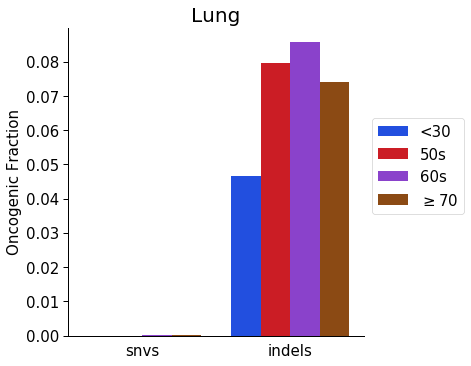

In [23]:
new_lungonc_frac = lungonc_frac.drop(['decades', 'total'], axis = 1)
long_form_lungonc_frac = pd.melt(new_lungonc_frac)
decade = ['<30', '50s', '60s', r'$\geq$70', '<30', '50s', '60s', r'$\geq$70']
long_form_lungonc_frac['decade'] = decade
long_form_lungonc_frac = long_form_lungonc_frac.rename(columns = {'value':'cell_frac'})

#Now I need to make a bar graph of this data

colors = ['#023eff', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_lungonc_frac, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'both', bottom=False, labelrotation = 0, labelsize = 15)
plt.title('Lung', fontsize = 20)
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('', fontsize = 15)
plt.ylabel('Oncogenic Fraction', fontsize = 15)
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55), fontsize = 15)
#plt.yscale('log')
plt.savefig("Mutations_Paper/lungoncNoTotal_frac.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

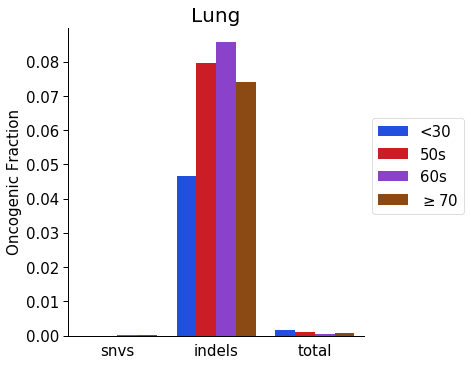

In [22]:
new_lungonc_frac = lungonc_frac.drop('decades', axis = 1)
long_form_lungonc_frac = pd.melt(new_lungonc_frac)
decade = ['<30', '50s', '60s', r'$\geq$70', '<30', '50s', '60s', r'$\geq$70', '<30', '50s', '60s', r'$\geq$70']
long_form_lungonc_frac['decade'] = decade
long_form_lungonc_frac = long_form_lungonc_frac.rename(columns = {'value':'cell_frac'})

#Now I need to make a bar graph of this data

colors = ['#023eff', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_lungonc_frac, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'both', bottom=False, labelrotation = 0, labelsize = 15)
plt.title('Lung', fontsize = 20)
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('', fontsize = 15)
plt.ylabel('Oncogenic Fraction', fontsize = 15)
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55), fontsize = 15)
#plt.yscale('log')
plt.savefig("Mutations_Paper/lungonc_frac.jpg", format="jpg", bbox_inches="tight")

# Bladder

<a id='bladder'></a>

In [14]:
bladder_mutations = pd.read_excel('Mutations_Paper/bladder/TGS_bladder_muts_inPaper.xlsx', sep = '\t', header = 1)

print(len(bladder_mutations))
bladder_mutations.head()

5822


,microbiopsy_id,data_access_id,histological_feature,chr,pos,ref,mut,mut_depth,total_depth,vaf,global_donor_vaf
0,T01_25F_b01_lo0004,PD40842b_lo0004,Urothelium,1,27106552,A,INS,5,218,0.022936,0.000132
1,T01_25F_b01_lo0004,PD40842b_lo0004,Urothelium,22,41568656,G,A,5,175,0.028571,0.000331
2,T01_25F_b01_lo0009,PD40842b_lo0009,Urothelium,12,49430944,G,A,14,104,0.134615,0.001113
3,T01_25F_b01_lo0009,PD40842b_lo0009,Urothelium,2,225367699,G,-,13,125,0.104000,0.000716
4,T01_25F_b01_lo0009,PD40842b_lo0009,Urothelium,7,151859456,A,G,16,180,0.088889,0.000692


In [15]:
## Get the decades, number of samples per decade, and vaf per number of samples in the decade into the dataframe
# remove useless columns and cancer patient mutations
bladder_muts = bladder_mutations.drop(bladder_mutations.columns[[2, 7, 8, 10]], axis = 1)
bladder_muts = bladder_muts.drop(bladder_muts.index[range(3180, len(bladder_muts))], axis = 0) #remove the cancer patients mutations
bladder_muts = bladder_muts.rename(columns = {'mut': 'alt', 'pos': 'start', 'chr': 'chr_x'})

#Get the age of the subject from the microbiopsy ID
bladder_muts.insert(1, 'age', bladder_muts.microbiopsy_id.str[4:6])

#Attribute decades to the mutations and add it to the dataframe
decades = []
for row in bladder_muts.itertuples():
    if int(row[2]) <= 29:
        decades.append('20s')
    elif int(row[2]) <= 39:
        decades.append('30s')
    elif int(row[2]) <= 49:
        decades.append('40s')
    elif int(row[2]) <= 59:
        decades.append('50s')
    elif int(row[2]) <= 69:
        decades.append('60s')
    else:
        decades.append('70s')
bladder_muts['decades'] = decades

#We have to add the number of samples step-by-step because this information is in a freaking pdf

#Need to have an end column for this; also need the chr to include 'chr'
bladder_muts['end'] = bladder_muts.start + 1
chroms = []
for row in bladder_muts.itertuples():
    chroms.append('chr' + str(row[4]))
bladder_muts['chr'] = chroms

import pysam
gencode_v19 = pysam.TabixFile('GENCODE/gencode.v19.annotation.gff3_all_known_genes.txt.sorted.formatted.bed.gz')

bladder_muts['genes'] = bladder_muts.apply(lambda x: gencode_all_known_genes(x[['chr', 'start', 'end']], gencode_v19), axis=1)

print(len(bladder_muts))
bladder_muts = bladder_muts[bladder_muts.genes != 'NA(0)'].reset_index(drop = True)
print(len(bladder_muts))

#Now I want to break up the gene names if it overlaps. Make sure that I remove duplicates when starting to sum VAFs

print(len(bladder_muts))
new_rows = []
for i,r in bladder_muts.iterrows(): #iterrows uses (index, series) across the dataframe
    g_list = r['genes'].split(";") #split the genes if more than one gene is attributed to a genomic location
    for g in g_list:
        g = g.replace(" ","") #remove all spaces that is created by the splits
        new_rows.append(np.append(r[['microbiopsy_id', 'age', 'data_access_id', 'chr_x', 'chr', 'start', 'ref', \
                                   'alt', 'vaf', 'decades', 'end', 'genes']].values, g))#g is copied to the array of data in the dataframe

bladder_muts_perGene = pd.DataFrame()
bladder_muts_perGene = bladder_muts_perGene.append(pd.DataFrame(new_rows, columns=['microbiopsy_id', 'age', 'data_access_id', 'chr_x', 'chr', 'start', 'ref', \
                                                                         'alt', 'vaf', 'decades', 'end', 'genes', 'gene_ID'])).reset_index().drop('index', axis=1)

bladder_muts_perGene['gene_name'] = bladder_muts_perGene['gene_ID'].apply(lambda x: x.split("(")[0])
bladder_muts_perGene['gene_coverage'] = bladder_muts_perGene['gene_ID'].apply(lambda x: x.split("(")[1].replace(")", ""))

bladder_muts_perGene = bladder_muts_perGene.drop(['genes', 'gene_ID', 'gene_coverage'], axis = 1)

print(len(bladder_muts_perGene))

bladder_muts = bladder_muts_perGene.drop(['chr', 'end'], axis = 1)
bladder_muts = bladder_muts.rename(columns = {'gene_name': 'gene', 'chr_x': 'chr'})
bladder_muts.to_csv('Mutations_Paper/bladder/TGS+genes.csv', index = False)
bladder_muts.head()

print(len(decades))
bladder_muts.head(len(bladder_muts))

3180


,microbiopsy_id,age,data_access_id,chr_x,start,ref,alt,vaf,decades,end,chr
0,T01_25F_b01_lo0004,25,PD40842b_lo0004,1,27106552,A,INS,0.022936,20s,27106553,chr1
1,T01_25F_b01_lo0004,25,PD40842b_lo0004,22,41568656,G,A,0.028571,20s,41568657,chr22
2,T01_25F_b01_lo0009,25,PD40842b_lo0009,12,49430944,G,A,0.134615,20s,49430945,chr12
3,T01_25F_b01_lo0009,25,PD40842b_lo0009,2,225367699,G,-,0.104000,20s,225367700,chr2
4,T01_25F_b01_lo0009,25,PD40842b_lo0009,7,151859456,A,G,0.088889,20s,151859457,chr7
5,T01_25F_b01_lo0021,25,PD40842b_lo0021,12,49439911,CC,AA,0.065574,20s,49439912,chr12
6,T01_25F_b01_lo0024,25,PD40842b_lo0024,2,225367699,G,-,0.045113,20s,225367700,chr2
7,T01_25F_b01_lo0024,25,PD40842b_lo0024,7,151859456,A,G,0.058824,20s,151859457,chr7
8,T01_25F_b01_lo0030,25,PD40842b_lo0030,17,56436022,G,T,0.049180,20s,56436023,chr17
9,T01_25F_b01_lo0031,25,PD40842b_lo0031,17,58734077,G,C,0.104530,20s,58734078,chr17


In [20]:
#Using targeting sequencing results (n = 1914)

bladder_muts = pd.read_csv('Mutations_Paper/bladder/TGS+genes.csv', sep = ',', header = 0)
print(len(bladder_muts))
bladder_muts = bladder_muts.drop_duplicates(keep = 'first')
print(len(bladder_muts))
bladder_muts.head()

2586
2586


,microbiopsy_id,age,data_access_id,chr,start,ref,alt,vaf,decades,gene
0,T01_25F_b01_lo0004,25,PD40842b_lo0004,1,27106552,A,INS,0.022936,20s,ARID1A
1,T01_25F_b01_lo0004,25,PD40842b_lo0004,22,41568656,G,A,0.028571,20s,EP300
2,T01_25F_b01_lo0009,25,PD40842b_lo0009,12,49430944,G,A,0.134615,20s,KMT2D
3,T01_25F_b01_lo0009,25,PD40842b_lo0009,2,225367699,G,-,0.104000,20s,CUL3
4,T01_25F_b01_lo0009,25,PD40842b_lo0009,7,151859456,A,G,0.088889,20s,KMT2C


In [21]:

#Make sure all of the MNVs are converted to SNVs
samp_mnvs = bladder_muts[(bladder_muts.ref.str.len() != 1) & (bladder_muts.ref.str.len() == bladder_muts.alt.str.len()) & (bladder_muts.alt != 'INS')] #There are multi-nucleotide variants that need to be converted to SNVs
print(len(samp_mnvs))
#Remove the MNVs from the all_muts dataframe; concatenate the converted MNVs later
mnvs_indices = []
for row in samp_mnvs.itertuples():
    mnvs_indices.append(row[0])
nomnvs = bladder_muts.drop(index = mnvs_indices)

#This is the code that turns the MNVS into SNVs that can be cross-references with CGC mutations.

refs = []
#This is the code that will be used to get the ref nucleotides from MNVs
for i in samp_mnvs.ref:
    for j in range(0, len(i)):
        refs.append(i[j])

alts = []
#This is the code that will be used to get the alt nucleotides from MNVs
for i in samp_mnvs.alt:
    for j in range(0, len(i)):
        alts.append(i[j])

#This gives the number of times a MNV needs to be in the dataframe to turn them in to SNVs
duplicates = []
for i in samp_mnvs.ref:
    duplicates.append(len(i))

#Get the numbers that must be added to the 'start' genomic locations for them to be SNVs
addends = []
for i in samp_mnvs.ref:
    for j in range(0, len(i)):
        addends.append(j)

# Get the genomic locations for each of the SNVs that are borne out of the MNVs
starts = list(np.repeat(samp_mnvs.start.values, duplicates, axis = 0)) #This makes a list of of the start positions in the MNV dataframe that are duplicated the number of times needed to make the MNVs into SNVs
start = [a + b for a,b in zip(starts, addends)] #This is comprehension form, but it gets the sum of the addends with the start position for the MNVs to yield start positions for each SNV

# Make the dataframe
samp_mnvs2 = pd.DataFrame(np.repeat(samp_mnvs.values, duplicates, axis = 0), columns = samp_mnvs.columns) #This makes the dataframe with mnvs entries but the entries are duplicated to convert the MNVs to SNVs
samp_mnvs2.ref = refs #Single nucleotide reference
samp_mnvs2.alt = alts #variant nucleotides
samp_mnvs2.start = start #genomic positions of SNV

#MNVs are just variants that are somewhat close to each other. Therefore, there are some 'SNVs' in the resulting dataframe where ref and alt are the same. We can drop those.
#samp_mnvs2.drop([samp_mnvs2.ref.values == samp_mnvs2.alt.values])
#32 'mutations' in the MNVs were simply trapped between nucleotide changes and weren't actual mutations.
non_snvs = []
for row in samp_mnvs2.itertuples():
    if row[6] == row[7]:
        non_snvs.append((row[0]))
        
for i in non_snvs:
    samp_mnvs2.drop(i, inplace = True)


#Concatenate the single nucleotides with the SNVs from the MNVs
bladder_muts = pd.concat([nomnvs, samp_mnvs2], sort = False, ignore_index = True).sort_values(by = ['microbiopsy_id', 'chr', 'start'])


print(len(samp_mnvs), len(bladder_muts))
samp_mnvs.head(len(samp_mnvs))
#bladder_muts.head()

13
13 2600


,microbiopsy_id,age,data_access_id,chr,start,ref,alt,vaf,decades,gene
5,T01_25F_b01_lo0021,25,PD40842b_lo0021,12,49439911,CC,AA,0.065574,20s,KMT2D
163,T02_35F_b06_lo0003,35,PD39461g_lo0003,3,49400040,CC,AA,0.083970,30s,RHOA
256,T03_53F_b08_lo0002,53,PD40794i_lo0002,12,133219766,CC,AA,0.111111,50s,POLE
367,T03_53F_b08_lo0034,53,PD40794i_lo0034,12,133219766,CC,AA,0.037037,50s,POLE
1021,T08_61F_b01_lo0007,61,PD37726b_lo0007,3,189526189,GC,TT,0.030928,60s,TP63
1040,T08_61F_b01_lo0023,61,PD37726b_lo0023,3,189526189,GC,TT,0.150000,60s,TP63
1055,T08_61F_b01_lo0047,61,PD37726b_lo0047,3,189526189,GC,TT,0.028571,60s,TP63
1277,T08_61F_b02_lo0070,61,PD37726c_lo0070,7,101845213,GG,AA,0.030075,60s,CUX1
1342,T08_61F_b02_lo0159,61,PD37726c_lo0159,7,101845213,GG,AA,0.090000,60s,CUX1
1365,T08_61F_b02_lo0174,61,PD37726c_lo0174,7,101845213,GG,AA,0.034483,60s,CUX1


In [22]:
#I need to get the number of samples per decades: 20s = 190, 30s = 187, 50s = 93+103+94, 60s = 312+84+155, 70s = 111+123+61
#Afterwards, calc the vaf_dec for all the mutations. Then, we can do calcs for the 3 tiers

dec_num_samps = []
for row in bladder_muts.itertuples():
    if row[9] == '20s':
        dec_num_samps.append(190)
    elif row[9] == '30s':
        dec_num_samps.append(187)
    elif row[9] == '50s':
        dec_num_samps.append(93+103+94)
    elif row[9] == '60s':
        dec_num_samps.append(312+84+155)
    else:
        dec_num_samps.append(111+123+61)
        
bladder_muts['dec_num_samps'] = dec_num_samps
bladder_muts['dec_vaf'] = bladder_muts.vaf/bladder_muts.dec_num_samps

bladder_muts.head()


,microbiopsy_id,age,data_access_id,chr,start,ref,alt,vaf,decades,gene,dec_num_samps,dec_vaf
0,T01_25F_b01_lo0004,25,PD40842b_lo0004,1,27106552,A,INS,0.0229358,20s,ARID1A,190,0.000120715
1,T01_25F_b01_lo0004,25,PD40842b_lo0004,22,41568656,G,A,0.0285714,20s,EP300,190,0.000150376
2,T01_25F_b01_lo0009,25,PD40842b_lo0009,12,49430944,G,A,0.134615,20s,KMT2D,190,0.0007085
3,T01_25F_b01_lo0009,25,PD40842b_lo0009,2,225367699,G,-,0.104,20s,CUL3,190,0.000547368
4,T01_25F_b01_lo0009,25,PD40842b_lo0009,7,151859456,A,G,0.0888889,20s,KMT2C,190,0.000467836


In [23]:
#Coding exon mutations only

print('total mutations:', len(bladder_muts))

bladder_muts = bladder_muts.rename(columns = {'start': 'Start'})
bladder_muts['End'] = bladder_muts.Start + 1
bladder_muts['Chromosome'] = 'chr' + bladder_muts.chr.astype('str')
bladder_py = pr.PyRanges(df = bladder_muts)
bladder_exons = bladder_py.overlap(hg19exon_regions)
bladder_muts = bladder_exons.as_df()
print('mutations in exons:', len(bladder_muts))
bladder_muts = bladder_muts.rename(columns =  {'Start': 'start'})
bladder_muts.head(len(bladder_muts))

total mutations: 2600
mutations in exons: 1909


,microbiopsy_id,age,data_access_id,chr,start,ref,alt,vaf,decades,gene,dec_num_samps,dec_vaf,End,Chromosome
0,T01_25F_b01_lo0004,25,PD40842b_lo0004,1,27106552,A,INS,0.0229358,20s,ARID1A,190,0.000120715,27106553,chr1
1,T01_25F_b04_lo0031,25,PD40842e_lo0031,1,65321340,G,-,0.0496454,20s,JAK1,190,0.000261292,65321341,chr1
2,T01_25F_b04_lo0109,25,PD40842e_lo0109,1,51860085,G,A,0.0816327,20s,EPS15,190,0.000429646,51860086,chr1
3,T02_35F_b05_lo0001,35,PD39461f_lo0001,1,27105763,G,-,0.0337838,30s,ARID1A,187,0.000180662,27105764,chr1
4,T02_35F_b05_lo0015,35,PD39461f_lo0015,1,16256031,A,G,0.132353,30s,SPEN,187,0.00070777,16256032,chr1
5,T02_35F_b05_lo0022,35,PD39461f_lo0022,1,16256031,A,G,0.0634921,30s,SPEN,187,0.00033953,16256032,chr1
6,T02_35F_b06_lo0003,35,PD39461g_lo0003,1,27106211,T,A,0.0359281,30s,ARID1A,187,0.000192129,27106212,chr1
7,T02_35F_b08_lo0057,35,PD39461i_lo0057,1,120510134,C,T,0.106061,30s,NOTCH2,187,0.000567171,120510135,chr1
8,T02_35F_b08_lo0069,35,PD39461i_lo0069,1,120510134,C,T,0.0222222,30s,NOTCH2,187,0.000118835,120510135,chr1
9,T02_35F_b08_lo0088,35,PD39461i_lo0088,1,196716340,A,T,0.0636364,30s,CFH,187,0.000340302,196716341,chr1


In [53]:
#bladder_muts.insert(6, 'change', bladder_muts.ref + '>' + bladder_muts.alt)
wgs_merge = pd.merge(bladder_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
wgs_merge = wgs_merge[(wgs_merge.fathmm_prediction == 'PATHOGENIC')]

bladder_decade = bladder_muts[(bladder_muts.alt != 'INS') & (bladder_muts.alt != '-')].groupby('decades').count()
bladder_count = bladder_decade.start

wgs_decade = wgs_merge.groupby('decades').count()
wgs_count = wgs_decade.start

print(len(wgs_merge))

print(bladder_count)
print(wgs_count)

344
decades
20s    76 
30s    69 
50s    438
60s    525
70s    419
Name: start, dtype: int64
decades
20s    12 
30s    4  
50s    111
60s    138
70s    79 
Name: start, dtype: int64


In [24]:
#For indels, get # of indels in CGC genes/total indels in each group
bladder_ins = bladder_muts[bladder_muts.alt == 'INS']
bladder_del = bladder_muts[bladder_muts.alt == '-']
bladder_indel = pd.concat([bladder_ins, bladder_del])

bladder_count = bladder_indel.groupby('decades').count()
indel_count = bladder_count.start

bladder_CGC = bladder_indel[bladder_indel.gene.isin(CGC_genes)].groupby('decades').count()
CGC_count = bladder_CGC.start

print(len(bladder_indel))
print(indel_count, CGC_count)

382
decades
20s    20 
30s    23 
50s    142
60s    104
70s    93 
Name: start, dtype: int64 decades
20s    13 
30s    21 
50s    125
60s    91 
70s    78 
Name: start, dtype: int64


In [34]:
#Positively selected genes in paper.
bladder_genes = ['KMT2D', 'MLL2','KDM6A', 'UTX', 'ARID1A','RBM10', 'EP300','STAG2', 'NOTCH2', 'CDKN1A', \
                 'CREBBP', 'FOXQ1', 'RHOA', 'ERCC2', 'KLF5', 'ZFP36L1', 'ELF3', 'GNA13', 'PTEN']

tissue_pos = bladder_muts[bladder_muts.gene.isin(bladder_genes)]

tissue_posSNV = tissue_pos[(tissue_pos.alt != 'INS') & (tissue_pos.alt != '-')]
tissue_posIndel = pd.concat([tissue_pos, tissue_posSNV]).drop_duplicates(keep = False)

print(len(tissue_pos), len(tissue_posSNV)+ len(tissue_posIndel))

#The VAFs aren't being multiplied by two because 58% of clones had two or more mutations in positively selected genes
dec_vaftot = tissue_pos.groupby('decades')['dec_vaf'].sum()*2
dec_vaftotSNV = tissue_posSNV.groupby('decades')['dec_vaf'].sum()*2
dec_vaftotIndel = tissue_posIndel.groupby('decades')['dec_vaf'].sum()*2

dec_vaftot = pd.DataFrame(dec_vaftot)
dec_vaftotSNV = pd.DataFrame(dec_vaftotSNV)
dec_vaftotIndel = pd.DataFrame(dec_vaftotIndel)


print(dec_vaftot)
print(dec_vaftotSNV)
print(dec_vaftotIndel)

pos_sel = []
pos_selSNV = []
pos_selIndel = []

for row in dec_vaftot.itertuples():
    pos_sel.append(row[1])
for row in dec_vaftotSNV.itertuples():
    pos_selSNV.append(row[1])
for row in dec_vaftotIndel.itertuples():
    pos_selIndel.append(row[1])

decades = ['<30', '30s', '50s', '60s', r'$\geq$70']

tissue_frac = pd.DataFrame()
tissue_fracSNV = pd.DataFrame()
tissue_fracIndel = pd.DataFrame()

tissue_frac['decades'] = decades
tissue_fracSNV['decades'] = decades
tissue_fracIndel['decades'] = decades

tissue_frac['pos_sel'] = pos_sel
tissue_fracSNV['pos_selSNV'] = pos_selSNV
tissue_fracIndel['pos_selIndel'] = pos_selIndel

print(len(bladder_muts), len(tissue_pos))

#tissue_muts.head(3760)
dec_vaftot.head(len(dec_vaftot))
tissue_fracIndel.head(len(tissue_frac))

813 813
          dec_vaf
decades          
20s      0.021601
30s      0.026143
50s      0.223066
60s      0.103499
70s      0.162058
          dec_vaf
decades          
20s      0.013956
30s      0.018847
50s      0.120945
60s      0.066639
70s      0.098646
          dec_vaf
decades          
20s      0.007645
30s      0.007296
50s      0.102120
60s      0.036860
70s      0.063412
1909 813


,decades,pos_selIndel
0,<30,0.007645
1,30s,0.007296
2,50s,0.102120
3,60s,0.036860
4,$\geq$70,0.063412


In [38]:
#Cross them with the CGC and CGC_patho

bladder_muts['change'] = bladder_muts.ref + '>' + bladder_muts.alt

#Let's separate the indels and SNVs to effectively cross
tissue_snvs = bladder_muts[(bladder_muts.alt != 'INS') & (bladder_muts.alt != '-')]
tissue_indels = pd.concat([tissue_snvs, bladder_muts]).drop_duplicates(keep = False)
print(len(bladder_muts), len(tissue_indels) + len(tissue_snvs))

#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change']).sort_values(by = ['decades'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'].sort_values(by = ['decades', 'vaf']) #These are the pathogenic SNVs

#get the indels that are in CGC genes and concatenate with the CGC and patho snvs
tissue_CGC_indels = tissue_indels[tissue_indels.gene.isin(CGC_genes)]

tissue_CGC_total = pd.concat([tissue_CGC_merge, tissue_CGC_indels], sort = False).sort_values(by = ['decades']) 
tissue_patho_total = pd.concat([tissue_patho_snvs, tissue_CGC_indels], sort = False).sort_values(by = ['decades'])

CGC_frac = tissue_CGC_total.groupby('decades')['dec_vaf'].sum()*2
patho_frac = tissue_patho_total.groupby('decades')['dec_vaf'].sum()*2
CGC_fracSNV = tissue_CGC_merge.groupby('decades')['dec_vaf'].sum()*2
CGC_fracSNVpatho = tissue_patho_snvs.groupby('decades')['dec_vaf'].sum()*2
CGC_fracIndel = tissue_CGC_indels.groupby('decades')['dec_vaf'].sum()*2

CGC_frac = pd.DataFrame(CGC_frac)
patho_frac = pd.DataFrame(patho_frac)
CGC_fracSNV = pd.DataFrame(CGC_fracSNV)
CGC_fracSNVpatho = pd.DataFrame(CGC_fracSNVpatho)
CGC_fracIndel = pd.DataFrame(CGC_fracIndel)


print(CGC_frac)
print(patho_frac)
print(CGC_fracSNV)
print(CGC_fracSNVpatho)
print(CGC_fracIndel)

##Get the cell_fracs
tissue_CGC_frac = [] #lists for cell_fracs
tissue_patho_frac = []
tissue_CGC_fracSNV = []
tissue_CGC_fracSNVpatho = []
tissue_CGC_fracIndel = []

#get cell_fracs
for row in CGC_frac.itertuples():
    tissue_CGC_frac.append(row[1])
for row in patho_frac.itertuples():
    tissue_patho_frac.append(row[1])
for row in CGC_fracSNV.itertuples():
    tissue_CGC_fracSNV.append(row[1])
for row in CGC_fracSNVpatho.itertuples():
    tissue_CGC_fracSNVpatho.append(row[1])
for row in CGC_fracIndel.itertuples():
    tissue_CGC_fracIndel.append(row[1])
    
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac

tissue_fracSNV['CGC_fracSNV'] = tissue_CGC_fracSNV
tissue_fracSNV['patho_fracSNV'] = tissue_CGC_fracSNVpatho

tissue_fracIndel['CGC_fracIndel'] = tissue_CGC_fracIndel

#tissue_indels.head(len(tissue_indels))
tissue_frac.head(len(tissue_frac))
tissue_fracSNV.head()
tissue_fracIndel.head()

54804 1909
          dec_vaf
decades          
20s      0.021621
30s      0.023120
50s      0.202097
60s      0.095973
70s      0.140777
          dec_vaf
decades          
20s      0.017528
30s      0.022037
50s      0.192823
60s      0.087083
70s      0.133880
          dec_vaf
decades          
20s      0.013658
30s      0.005607
50s      0.090868
60s      0.055151
70s      0.064921
          dec_vaf
decades          
20s      0.009565
30s      0.004524
50s      0.081595
60s      0.046261
70s      0.058024
          dec_vaf
decades          
20s      0.007963
30s      0.017513
50s      0.111229
60s      0.040822
70s      0.075856


,decades,pos_selIndel,CGC_fracIndel
0,<30,0.007645,0.007963
1,30s,0.007296,0.017513
2,50s,0.102120,0.111229
3,60s,0.036860,0.040822
4,$\geq$70,0.063412,0.075856


In [39]:
bladder_frac = tissue_frac
bladder_fracSNV = tissue_fracSNV
bladder_fracIndel = tissue_fracIndel

<Figure size 432x288 with 0 Axes>

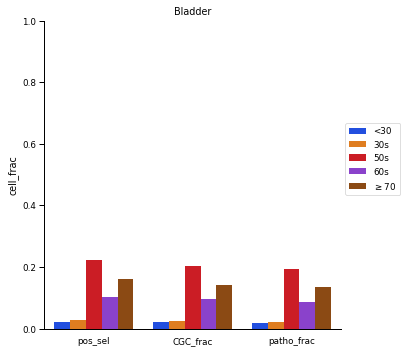

In [41]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_tissue_frac = tissue_frac.drop('decades', axis = 1)
long_form_tissue = pd.melt(new_tissue_frac)
decade = ['<30', '30s', '50s', '60s', r'$\geq$70', '<30', '30s', '50s', '60s', r'$\geq$70', '<30', '30s', '50s', '60s', r'$\geq$70']
long_form_tissue['decade'] = decade
long_form_tissue = long_form_tissue.rename(columns = {'value':'cell_frac'})
long_form_bladder = long_form_tissue

long_form_tissue.head(len(long_form_tissue))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bladder, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Bladder')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/bladder.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

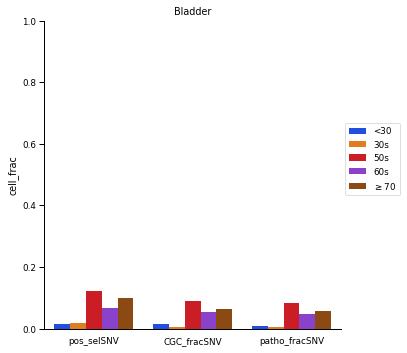

In [42]:
new_bladder_fracSNV = bladder_fracSNV.drop('decades', axis = 1)
long_form_bladderSNV = pd.melt(new_bladder_fracSNV)
decade = ['<30', '30s', '50s', '60s', r'$\geq$70', '<30', '30s', '50s', '60s', r'$\geq$70', '<30', '30s', '50s', '60s', r'$\geq$70']
long_form_bladderSNV['decade'] = decade
long_form_bladderSNV = long_form_bladderSNV.rename(columns = {'value':'cell_frac'})


long_form_bladderSNV.head(len(long_form_bladderSNV))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bladderSNV, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Bladder')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/bladderSNV.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

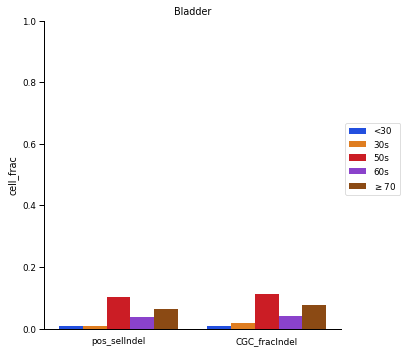

In [43]:
new_bladder_fracIndel = bladder_fracIndel.drop('decades', axis = 1)
long_form_bladderIndel = pd.melt(new_bladder_fracIndel)
decade = ['<30', '30s', '50s', '60s', r'$\geq$70', '<30', '30s', '50s', '60s', r'$\geq$70']
long_form_bladderIndel['decade'] = decade
long_form_bladderIndel = long_form_bladderIndel.rename(columns = {'value':'cell_frac'})


long_form_bladderIndel.head(len(long_form_bladderIndel))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_bladderIndel, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Bladder')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/bladderIndel.jpg", format="jpg", bbox_inches="tight")

# Skin

<a id='skin'></a>

In [34]:
#Get all mutations from gridded sequencing; there are mutations from punch samples and hair follicle samples
skin_mutations = pd.read_excel('Mutations_Paper/Skin/skin_muts.xlsx', sep = '\t', sheet_name = 1, header = 4)
skin_mutations.head()

,sample,chr,pos,ref,mut,mut_site,tum_globalvaf,gene,transcript,rna_desc,cdna_desc,protein_desc,summary,classification,num_samples,samples,vafs,summed_vaf,xfw_sum,xbw_sum,nfw_sum,nbw_sum,mutant_reads_sum,depth_sum,proportion_samples,subject,transcodon
0,PD30272_m00001,1,152327902,C,T,1 152327902 C T,0.001645,FLG2,CCDS30861.1,r.2433g>a,c.2360G>A,p.G787E,missense,protein_coding:exon:CDS:substitution:codon_variant:non_synonymous_codon,2,"[PD30272de, PD30272df]","[0.0220588235294118, 0.014030612244898003]",0.036089,12,17,671,929,29,1600,0.076923,PD30272,-
1,PD30272_m00002,1,27100301,C,T,1 27100301 C T,0.001389,ARID1A,CCDS285.1,r.4384c>u,c.4013C>T,p.S1338F,missense,protein_coding:exon:CDS:substitution:codon_variant:non_synonymous_codon,2,"[PD30272cz, PD30272db]","[0.0277044854881266, 0.0125698324022346]",0.040274,21,9,869,605,30,1474,0.076923,PD30272,-
2,PD30272_m00003,19,15290899,C,T,19 15290899 C T,0.000693,NOTCH3,CCDS12326.1,r.3387g>a,c.3311G>A,p.G1104E,missense,protein_coding:exon:CDS:substitution:codon_variant:non_synonymous_codon,2,"[PD30272db, PD30272de]","[0.0112834978843441, 0.007672634271099741]",0.018956,8,6,912,579,14,1491,0.076923,PD30272,-
3,PD30272_m00004,2,21224931,GG,AA,2 21224931 GG AA,0.002656,APOB,CCDS1703.1,r.13490_13491delCCinsuu,c.13362_13363delCCinsTT,p.L4455F,missense,protein_coding:exon:CDS:indel:inframe_variant:substitution:non_synonymous_codon,3,"[PD30272cy, PD30272dc, PD30272df]","[0.00973989365490066, 0.041007093640044, 0.015508008008008]",0.066255,33,35,1495,1406,68,2901,0.115385,PD30272,Trans-codon 4455|4454
4,PD30272_m00005,2,228883652,G,A,2 228883652 G A,0.002987,SPHKAP,CCDS46537.1,r.1965c>u,c.1918C>T,p.L640L,silent,protein_coding:exon:CDS:substitution:codon_variant:synonymous_codon,2,"[PD30272dc, PD30272df]","[0.0248190279214064, 0.0504103165298945]",0.075229,28,39,788,1032,67,1820,0.076923,PD30272,-


In [35]:
#Drop all the useless columns that don't help with analysis
skin_muts = skin_mutations.drop(skin_mutations.columns[[5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 26]], axis = 1)
skin_muts = skin_muts.rename(columns = {'pos': 'start', 'mut': 'alt', 'summed_vaf': 'vaf'})

missing_subject = []
decades = []
dec_samp_cts = []
for row in skin_muts.itertuples():
    if row[8] == 'PD37617' or row[8] == 'PD37577' or row[8] == 'PD38333' or row[8] == 'PD38336':
        decades.append('40s')
        dec_samp_cts.append(141)
    elif row[8] == 'PD37615' or row[8] == 'PD37614' or row[8] == 'PD43943' or row[8] == 'PD43994' or row[8] == 'PD43995' or row[8] == 'PD43992' \
    or row[8] == 'PD37575' or row[8] == 'PD37618' or row[8] == 'PD38332' or row[8] == 'PD38334' or row[8] == 'PD38218' or row[8] == 'PD38215'\
    or row[8] == 'PD38217' or row[8] == 'PD37275':
        decades.append('70s')
        dec_samp_cts.append(478)
    elif row[8] == 'PD43996' or row[8] == 'PD37579' or row[8] == 'PD38219' or row[8] == 'PD38331' or row[8] == 'PD37578' or row[8] == 'PD30274':
        decades.append('50s')
        dec_samp_cts.append(183)
    elif row[8] == 'PD37619' or row[8] == 'PD43991' or row[8] == 'PD36126' or row[8] == 'PD37576' or row[8] == 'PD38330' or row[8] == 'PD38220'\
    or row[8] == 'PD37184' or row[8] == 'PD37182' or row[8] == 'PD30273':
        decades.append('60s')
        dec_samp_cts.append(334)
    elif row[8] == 'PD38335' or row[8] == 'PD38216' or row[8] == 'PD30272':
        decades.append('30s')
        dec_samp_cts.append(104)
    elif row[8] == 'PD37185':
        decades.append('20s')
        dec_samp_cts.append(20)
    else:
        missing_subject.append(row[8]) #37185 was originally missing. It's the same as 37612
skin_muts['decades'] = decades
skin_muts['dec_samp_cts'] = dec_samp_cts

##Now, let's do some work on these MNVs
## We need to get the MNVs converted to SNVs

skin_muts.insert(5, 'change', skin_muts.ref + '>' + skin_muts.alt)

samp_mnvs = skin_muts[(skin_muts.ref.str.len() != 1) & (skin_muts.ref.str.len() == skin_muts.alt.str.len()) & (skin_muts.alt != 'INS')] #There are multi-nucleotide variants that need to be converted to SNVs
print(len(samp_mnvs))
#Remove the MNVs from the all_muts dataframe; concatenate the converted MNVs later
mnvs_indices = []
for row in samp_mnvs.itertuples():
    mnvs_indices.append(row[0])
nomnvs = skin_muts.drop(index = mnvs_indices)

#This is the code that turns the MNVS into SNVs that can be cross-references with CGC mutations.

refs = []
#This is the code that will be used to get the ref nucleotides from MNVs
for i in samp_mnvs.ref:
    for j in range(0, len(i)):
        refs.append(i[j])

alts = []
#This is the code that will be used to get the alt nucleotides from MNVs
for i in samp_mnvs.alt:
    for j in range(0, len(i)):
        alts.append(i[j])

#This gives the number of times a MNV needs to be in the dataframe to turn them in to SNVs
duplicates = []
for i in samp_mnvs.ref:
    duplicates.append(len(i))

#Get the numbers that must be added to the 'start' genomic locations for them to be SNVs
addends = []
for i in samp_mnvs.ref:
    for j in range(0, len(i)):
        addends.append(j)

# Get the genomic locations for each of the SNVs that are borne out of the MNVs
starts = list(np.repeat(samp_mnvs.start.values, duplicates, axis = 0)) #This makes a list of of the start positions in the MNV dataframe that are duplicated the number of times needed to make the MNVs into SNVs
start = [a + b for a,b in zip(starts, addends)] #This is comprehension form, but it gets the sum of the addends with the start position for the MNVs to yield start positions for each SNV

# Make the dataframe
samp_mnvs2 = pd.DataFrame(np.repeat(samp_mnvs.values, duplicates, axis = 0), columns = samp_mnvs.columns) #This makes the dataframe with mnvs entries but the entries are duplicated to convert the MNVs to SNVs
samp_mnvs2.ref = refs #Single nucleotide reference
samp_mnvs2.alt = alts #variant nucleotides
samp_mnvs2.start = start #genomic positions of SNV

#MNVs are just variants that are somewhat close to each other. Therefore, there are some 'SNVs' in the resulting dataframe where ref and alt are the same. We can drop those.
#samp_mnvs2.drop([samp_mnvs2.ref.values == samp_mnvs2.alt.values])
#32 'mutations' in the MNVs were simply trapped between nucleotide changes and weren't actual mutations.
non_snvs = []
for row in samp_mnvs2.itertuples():
    if row[5] == row[4]:
        non_snvs.append((row[0]))
        
for i in non_snvs:
    samp_mnvs2.drop(i, inplace = True)

#We need 'change' to reflect the new SNVs
del samp_mnvs2['change']
samp_mnvs2.insert(5, 'change', samp_mnvs2.ref + '>' + samp_mnvs2.alt)

#Concatenate the single nucleotides with the SNVs from the MNVs
skin_muts = pd.concat([nomnvs, samp_mnvs2], sort = False, ignore_index = True).sort_values(by = ['subject', 'sample', 'chr', 'start'])

skin_muts.insert(len(skin_muts.columns), 'vaf_dec', skin_muts.vaf/skin_muts.dec_samp_cts)

print(len(skin_muts), len(samp_mnvs2))
skin_muts.head(100)

3866
57799 7774


,sample,chr,start,ref,alt,change,gene,vaf,subject,decades,dec_samp_cts,vaf_dec
0,PD30272_m00001,1,152327902,C,T,C>T,FLG2,0.0360894,PD30272,30s,104,0.000347014
1,PD30272_m00002,1,27100301,C,T,C>T,ARID1A,0.0402743,PD30272,30s,104,0.000387253
2,PD30272_m00003,19,15290899,C,T,C>T,NOTCH3,0.0189561,PD30272,30s,104,0.000182271
50025,PD30272_m00004,2,21224931,G,A,G>A,APOB,0.066255,PD30272,30s,104,0.000637067
50026,PD30272_m00004,2,21224932,G,A,G>A,APOB,0.066255,PD30272,30s,104,0.000637067
3,PD30272_m00005,2,228883652,G,A,G>A,SPHKAP,0.0752293,PD30272,30s,104,0.000723359
4,PD30272_m00006,2,228884819,C,T,C>T,SPHKAP,0.0373671,PD30272,30s,104,0.000359299
5,PD30272_m00007,20,8608984,G,A,G>A,PLCB1,0.0507464,PD30272,30s,104,0.000487946
6,PD30272_m00008,20,8862344,G,A,G>A,PLCB1,0.0222863,PD30272,30s,104,0.000214292
7,PD30272_m00009,3,38888196,G,A,G>A,SCN11A,0.0303671,PD30272,30s,104,0.000291992


In [36]:
#Coding exon mutations only

print('total mutations:', len(skin_muts))

skin_muts = skin_muts.rename(columns = {'start': 'Start'})
skin_muts['End'] = skin_muts.Start + 1
skin_muts['Chromosome'] = 'chr' + skin_muts.chr.astype('str')
skin_py = pr.PyRanges(df = skin_muts)
skin_exons = skin_py.overlap(hg19exon_regions)
skin_muts = skin_exons.as_df()
print('mutations in exons:', len(skin_muts))
skin_muts = skin_muts.rename(columns =  {'Start': 'start'})
skin_muts.head()

total mutations: 57799
mutations in exons: 54804


,sample,chr,start,ref,alt,change,gene,vaf,subject,decades,dec_samp_cts,vaf_dec,End,Chromosome
0,PD30272_m00001,1,152327902,C,T,C>T,FLG2,0.0360894,PD30272,30s,104,0.000347014,152327903,chr1
1,PD30272_m00002,1,27100301,C,T,C>T,ARID1A,0.0402743,PD30272,30s,104,0.000387253,27100302,chr1
2,PD30272cw,1,152324054,C,T,C>T,FLG2,0.0106645,PD30272,30s,104,0.000102543,152324055,chr1
3,PD30272cz,1,152324120,C,T,C>T,FLG2,0.00598291,PD30272,30s,104,5.75279e-05,152324121,chr1
4,PD30272dd,1,120468021,C,T,C>T,NOTCH2,0.0470942,PD30272,30s,104,0.000452829,120468022,chr1


In [70]:
#skin_muts.insert(6, 'change', skin_muts.ref + '>' + skin_muts.alt)
wgs_merge = pd.merge(skin_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
wgs_merge = wgs_merge[(wgs_merge.fathmm_prediction == 'PATHOGENIC')]

skin_decade = skin_muts[(skin_muts.alt != 'INS') & (skin_muts.alt != '-')].groupby('decades').count()
skin_count = skin_decade.start

wgs_decade = wgs_merge.groupby('decades').count()
wgs_count = wgs_decade.start

print(len(wgs_merge))


print(skin_count)
print(wgs_count)

10096
decades
20s    42   
30s    1015 
40s    4702 
50s    10213
60s    13977
70s    22882
Name: start, dtype: int64
decades
20s    7   
30s    179 
40s    998 
50s    1823
60s    2626
70s    4463
Name: start, dtype: int64


In [37]:
#For indels, get # of indels in CGC genes/total indels in each group
skin_ins = skin_muts[skin_muts.alt == 'INS']
skin_del = skin_muts[skin_muts.alt == '-']
skin_indel = pd.concat([skin_ins, skin_del])

skin_count = skin_indel.groupby('decades').count()
indel_count = skin_count.start

skin_CGC = skin_indel[skin_indel.gene.isin(CGC_genes)].groupby('decades').count()
CGC_count = skin_CGC.start

print(len(skin_indel))
print(indel_count, CGC_count)

1973
decades
20s    2  
30s    27 
40s    195
50s    305
60s    561
70s    883
Name: start, dtype: int64 decades
20s    2  
30s    23 
40s    171
50s    277
60s    508
70s    795
Name: start, dtype: int64


In [20]:
#Positively selected genes in paper.
skin_genes = ['NOTCH1', 'FAT1', 'NOTCH2', 'TP53', 'RBM10', 'NOTCH3', 'ARID2', 'AJUBA', 'KMT2D', 'TP63', 'RB1']

tissue_pos = skin_muts[skin_muts.gene.isin(skin_genes)]

tissue_posSNV = tissue_pos[(tissue_pos.alt != 'INS') & (tissue_pos.alt != '-')]
tissue_posIns = tissue_pos[(tissue_pos.alt == 'INS')]
tissue_posDel = tissue_pos[(tissue_pos.alt == '-')]
tissue_posIndel = pd.concat([tissue_posDel, tissue_posIns])

print(len(tissue_pos), len(tissue_posSNV)+ len(tissue_posIndel))

#The VAFs aren't being multiplied by two because 58% of clones had two or more mutations in positively selected genes
dec_vaftot = tissue_pos.groupby('decades')['vaf_dec'].sum()
dec_vaftotSNV = tissue_posSNV.groupby('decades')['vaf_dec'].sum()
dec_vaftotIndel = tissue_posIndel.groupby('decades')['vaf_dec'].sum()

dec_vaftot = pd.DataFrame(dec_vaftot)
dec_vaftotSNV = pd.DataFrame(dec_vaftotSNV)
dec_vaftotIndel = pd.DataFrame(dec_vaftotIndel)


print(dec_vaftot)
print(dec_vaftotSNV)
print(dec_vaftotIndel)

pos_sel = []
pos_selSNV = []
pos_selIndel = []

for row in dec_vaftot.itertuples():
    pos_sel.append(row[1])
for row in dec_vaftotSNV.itertuples():
    pos_selSNV.append(row[1])
for row in dec_vaftotIndel.itertuples():
    pos_selIndel.append(row[1])

decades = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70']

tissue_frac = pd.DataFrame()
tissue_fracSNV = pd.DataFrame()
tissue_fracIndel = pd.DataFrame()

tissue_frac['decades'] = decades
tissue_fracSNV['decades'] = decades
tissue_fracIndel['decades'] = decades

tissue_frac['pos_sel'] = pos_sel
tissue_fracSNV['pos_selSNV'] = pos_selSNV
tissue_fracIndel['pos_selIndel'] = pos_selIndel

print(len(skin_muts), len(tissue_pos))

#tissue_muts.head(3760)
dec_vaftot.head(len(dec_vaftot))
tissue_fracIndel.head(len(tissue_frac))

18673 18673
          vaf_dec
decades          
20s      0.005008
30s      0.049407
40s      0.284300
50s      0.706422
60s      0.741827
70s      0.705911
          vaf_dec
decades          
20s      0.004537
30s      0.045627
40s      0.263126
50s      0.653782
60s      0.675394
70s      0.654261
          vaf_dec
decades          
20s      0.000471
30s      0.003780
40s      0.021174
50s      0.052639
60s      0.066433
70s      0.051650
54804 18673


,decades,pos_selIndel
0,<30,0.000471
1,30s,0.003780
2,40s,0.021174
3,50s,0.052639
4,60s,0.066433
5,$\geq$70,0.051650


In [22]:
#Cross them with the CGC and CGC_patho

#Let's separate the indels and SNVs to effectively cross
tissue_snvs = skin_muts[(skin_muts.alt != 'INS') & (skin_muts.alt != '-')]
tissue_indels = pd.concat([tissue_snvs, skin_muts]).drop_duplicates(keep = False)
print(len(skin_muts), len(tissue_indels) + len(tissue_snvs))

#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change']).sort_values(by = ['decades', 'sample'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'].sort_values(by = ['decades', 'sample', 'vaf']) #These are the pathogenic SNVs

#get the indels that are in CGC genes and concatenate with the CGC and patho snvs
tissue_CGC_indels = tissue_indels[tissue_indels.gene.isin(CGC_genes)]

tissue_CGC_total = pd.concat([tissue_CGC_merge, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample']) 
tissue_patho_total = pd.concat([tissue_patho_snvs, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample'])

CGC_frac = tissue_CGC_total.groupby('decades')['vaf_dec'].sum()
patho_frac = tissue_patho_total.groupby('decades')['vaf_dec'].sum()
CGC_fracSNV = tissue_CGC_merge.groupby('decades')['vaf_dec'].sum()
CGC_fracSNVpatho = tissue_patho_snvs.groupby('decades')['vaf_dec'].sum()
CGC_fracIndel = tissue_CGC_indels.groupby('decades')['vaf_dec'].sum()

CGC_frac = pd.DataFrame(CGC_frac)
patho_frac = pd.DataFrame(patho_frac)
CGC_fracSNV = pd.DataFrame(CGC_fracSNV)
CGC_fracSNVpatho = pd.DataFrame(CGC_fracSNVpatho)
CGC_fracIndel = pd.DataFrame(CGC_fracIndel)


print(CGC_frac)
print(patho_frac)
print(CGC_fracSNV)
print(CGC_fracSNVpatho)
print(CGC_fracIndel)

##Get the cell_fracs
tissue_CGC_frac = [] #lists for cell_fracs
tissue_patho_frac = []
tissue_CGC_fracSNV = []
tissue_CGC_fracSNVpatho = []
tissue_CGC_fracIndel = []

#get cell_fracs
for row in CGC_frac.itertuples():
    tissue_CGC_frac.append(row[1])
for row in patho_frac.itertuples():
    tissue_patho_frac.append(row[1])
for row in CGC_fracSNV.itertuples():
    tissue_CGC_fracSNV.append(row[1])
for row in CGC_fracSNVpatho.itertuples():
    tissue_CGC_fracSNVpatho.append(row[1])
for row in CGC_fracIndel.itertuples():
    tissue_CGC_fracIndel.append(row[1])
    
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac

tissue_fracSNV['CGC_fracSNV'] = tissue_CGC_fracSNV
tissue_fracSNV['patho_fracSNV'] = tissue_CGC_fracSNVpatho

tissue_fracIndel['CGC_fracIndel'] = tissue_CGC_fracIndel

#tissue_indels.head(len(tissue_indels))
tissue_frac.head(len(tissue_frac))
tissue_fracSNV.head()
tissue_fracIndel.head()

54804 54804
          vaf_dec
decades          
20s      0.004907
30s      0.035025
40s      0.203917
50s      0.480187
60s      0.525675
70s      0.500169
          vaf_dec
decades          
20s      0.004548
30s      0.030373
40s      0.186489
50s      0.434875
60s      0.479057
70s      0.451564
          vaf_dec
decades          
20s      0.004122
30s      0.030926
40s      0.181187
50s      0.423865
60s      0.457111
70s      0.445631
          vaf_dec
decades          
20s      0.003763
30s      0.026275
40s      0.163759
50s      0.378554
60s      0.410494
70s      0.397026
          vaf_dec
decades          
20s      0.000785
30s      0.004099
40s      0.022730
50s      0.056321
60s      0.068563
70s      0.054538


,decades,pos_selIndel,CGC_fracIndel
0,<30,0.000471,0.000785
1,30s,0.003780,0.004099
2,40s,0.021174,0.022730
3,50s,0.052639,0.056321
4,60s,0.066433,0.068563


In [23]:
skin_frac = tissue_frac
skin_fracSNV = tissue_fracSNV
skin_fracIndel = tissue_fracIndel

<Figure size 432x288 with 0 Axes>

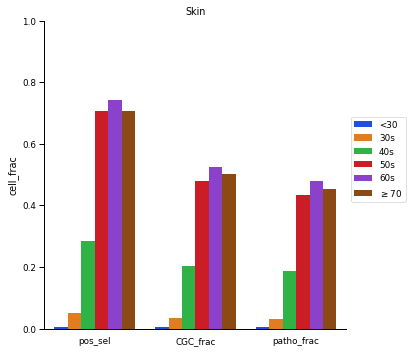

In [24]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_skin_frac = skin_frac.drop('decades', axis = 1)
long_form_skin = pd.melt(new_skin_frac)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_skin['decade'] = decade
long_form_skin = long_form_skin.rename(columns = {'value':'cell_frac'})

long_form_skin.head(len(long_form_skin))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_skin, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Skin')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/skin.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

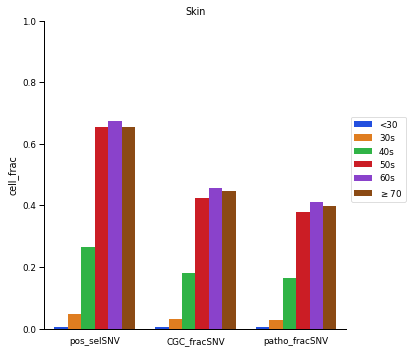

In [25]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_skin_fracSNV = skin_fracSNV.drop('decades', axis = 1)
long_form_skinSNV = pd.melt(new_skin_fracSNV)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_skinSNV['decade'] = decade
long_form_skinSNV = long_form_skinSNV.rename(columns = {'value':'cell_frac'})

long_form_skinSNV.head(len(long_form_skinSNV))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_skinSNV, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Skin')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/skinSNV.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

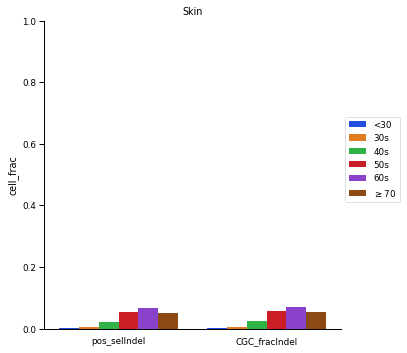

In [26]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_skin_fracIndel = skin_fracIndel.drop('decades', axis = 1)
long_form_skinIndel = pd.melt(new_skin_fracIndel)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_skinIndel['decade'] = decade
long_form_skinIndel = long_form_skinIndel.rename(columns = {'value':'cell_frac'})

long_form_skinIndel.head(len(long_form_skinIndel))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_skinIndel, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Skin')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/skinIndel.jpg", format="jpg", bbox_inches="tight")

# Colon

<a id='colon'></a>

In [13]:
#We need to make sure that we have a measure of how many colonic crypts were actually sequenced for each person.
#9, 10, and 11
crypt_data = pd.read_csv('Mutations_Paper/Colon/Crypt_coverage.csv')

#Make a list of columns that need to be deleted
deletables = [1020, 1021]
i = 0
y = 0
while y < 1018:
    y = 8+4*i
    deletables.append(y)
    y = 9+4*i
    deletables.append(y)
    y = 10+4*i
    deletables.append(y)
    i += 1


crypt_data2 = crypt_data.drop(crypt_data.columns[deletables], axis = 1)


#Now I need to go through each row of the columns with the average coverage and get counts for how many exceed 7
samp = []
fractions = []
for column in range(8, len(crypt_data2.columns)+1):
    count = 0
    for row in crypt_data2.itertuples():
        if row[column] >= 7:
            count +=1
    samp.append(crypt_data2.columns[column - 1])
    fractions.append(count/355)
    

sample_coverage = pd.DataFrame()
#sample_coverage['sample'] = sample
sample_coverage.insert(0, 'sample', samp)
sample_coverage['fractions'] = fractions
#sample_coverage.insert(2, 'sampleID', sample_coverage.sample.str.partition('.')[2]) # this code isn't working because of a stack overflow. BOOOOOO!!!

decade = []
indices = []
for row in sample_coverage.itertuples():
    if 'PD28690' in row[1] or 'PD36814g' in row[1] or 'PD36813ac' in row[1] or 'PD36813b' in row[1] \
    or 'PD36813g' in row[1] or 'PD36813s' in row[1] or 'PD36813v' in row[1]:
        decade.append('70s')
        indices.append(row[0])
    elif 'PD37449' in row[1] or 'PD34201' in row[1]:
        decade.append('30s')
        indices.append(row[0])
    elif 'PD34200' in row[1] or 'PD37590' in row[1]:
        decade.append('50s')
        indices.append(row[0])
    elif 'PD34202' in row[1]:
        decade.append('20s')
    else:
        decade.append('60s')
        indices.append(row[0])
print(indices, len(decade))

sample_coverage['decades'] = decade

crypt_totals = sample_coverage.groupby('decades')['fractions'].sum()

coverage_count = sample_coverage.groupby('decades').count()

print(coverage_count)
print(crypt_totals)
sample_coverage.head(len(sample_coverage))

#crypt_totals.head(len(crypt_totals))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229,

,sample,fractions,decades
0,X1494.HLS_1b.mean_coverage,0.901408,60s
1,X1494.HLS_1C_30_B5.mean_coverage,1.000000,60s
2,X1494.HLS_1C_30_C5.mean_coverage,0.994366,60s
3,X1494.HLS_1C_30_D5.mean_coverage,0.994366,60s
4,X1494.HLS_1C_30_E5.mean_coverage,0.980282,60s
5,X1494.HLS_1C_30_G5.mean_coverage,1.000000,60s
6,X1494.HLS_1C_30_H5.mean_coverage,0.991549,60s
7,X1494.HLS_2C_30_C6.mean_coverage,0.752113,60s
8,X1494.HLS_2C_30_D6.mean_coverage,0.988732,60s
9,X1494.HLS_2C_30_E6.mean_coverage,0.994366,60s


In [14]:
## Similarly to the endometrium, the crypts of colons are composed of cells that come from a (or a few) common stem cell ancestor(s).
# Therefore, there are some assumptions about the clonal dynamics of cells with oncogenic mutations
# The major assumption is that the mutations found are clonal
import pandas as pd

#These parameters allow you to see all rows and columns when you use the .head() command to view data frames
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', -1)

patient_muts = pd.read_csv('Mutations_Paper/Colon/patient_mut.csv', sep = ',').sort_values(by = 'sampleID')
patient_data = pd.read_csv('Mutations_Paper/Colon/Patient_data.csv', sep = ',').sort_values(by = 'age')
#.drop(patient_data.columns[[0, 4, 5]], axis = 1).
patient_data = patient_data.rename(columns = {'patient_label_in_files': 'patient'})

decades = []
dec_num_samp = []
for row in patient_data.itertuples():
    if row[4] <= 29:
        decades.append('20s')
        dec_num_samp.append(crypt_totals[0])
    elif row[4] <= 39:
        decades.append('30s')
        dec_num_samp.append(crypt_totals[1])
    elif row[4] <= 49:
        decades.append('40s')
        dec_num_samp.append('what')
    elif row[4] <= 59:
        decades.append('50s')
        dec_num_samp.append(crypt_totals[2])
    elif row[4] <= 69:
        decades.append('60s')
        dec_num_samp.append(crypt_totals[3])
    else:
        decades.append('70s')
        dec_num_samp.append(crypt_totals[4])
patient_data['decades'] = decades
patient_data['dec_num_samp'] = dec_num_samp

patient_muts['vaf']= 0.5

targ_muts = patient_muts[patient_muts.study_type == 'targ']
wgs_muts = patient_muts[patient_muts.study_type != 'targ']
colon_muts_merge = targ_muts.merge(patient_data, on = 'patient', how = 'inner', sort = False)
wgs_muts_merge = wgs_muts.merge(patient_data, on = 'patient', how = 'inner', sort = False)

colon_muts = colon_muts_merge.drop(colon_muts_merge.columns[[7, 9, 10, 12, 13, 14, 15, 16, 17, 19, 22, 23]], axis = 1).sort_values(by = ['decades', 'sampleID'])

wgs_muts = wgs_muts_merge.drop(colon_muts_merge.columns[[7, 9, 10, 12, 13, 14, 15, 16, 17, 19, 22, 23]], axis = 1).sort_values(by = ['decades', 'sampleID'])

colon_muts['vaf_dec'] = colon_muts.vaf/colon_muts.dec_num_samp
wgs_muts['vaf_dec'] = wgs_muts.vaf/wgs_muts.dec_num_samp

print(len(colon_muts_merge))
print(len(patient_muts), len(targ_muts), len(wgs_muts))
patient_muts.head(200)
#patient_data.head(50)
#colon_muts.head(200)
patient_data.head(len(patient_data))
colon_muts_merge.head(len(colon_muts_merge))
#targ_muts.head(len(targ_muts))
colon_muts.head(len(colon_muts))

923
21074 923 7059


,sampleID,chr,pos,ref,mut,study_type,patient,gene,strand,vaf,sex,age,decades,dec_num_samp,vaf_dec
329,PD34201c_lo0003,17,74473752,G,A,targ,PD34201,RHBDF2,-1,0.5,male,38,30s,56.850704,0.008795
330,PD34201c_lo0013,19,3114966,C,T,targ,PD34201,GNA11,1,0.5,male,38,30s,56.850704,0.008795
331,PD34201c_lo0017,17,16097842,G,T,targ,PD34201,NCOR1,-1,0.5,male,38,30s,56.850704,0.008795
332,PD34201c_lo0022,5,121187794,C,T,targ,PD34201,FTMT,1,0.5,male,38,30s,56.850704,0.008795
333,PD34201c_lo0022,2,42509977,G,A,targ,PD34201,EML4,1,0.5,male,38,30s,56.850704,0.008795
334,PD34201c_lo0022,1,120461941,G,A,targ,PD34201,NOTCH2,-1,0.5,male,38,30s,56.850704,0.008795
335,PD34201c_lo0024,12,46245446,G,C,targ,PD34201,ARID2,1,0.5,male,38,30s,56.850704,0.008795
336,PD34201c_lo0024,4,153249506,T,C,targ,PD34201,FBXW7,-1,0.5,male,38,30s,56.850704,0.008795
337,PD34201c_lo0033,16,67645071,A,G,targ,PD34201,CTCF,1,0.5,male,38,30s,56.850704,0.008795
338,PD34201c_lo0034,9,139413251,G,T,targ,PD34201,NOTCH1,-1,0.5,male,38,30s,56.850704,0.008795


In [15]:
#Coding exon mutations only

print('total mutations:', len(colon_muts))

colon_muts = colon_muts.rename(columns = {'pos': 'Start'})
colon_muts['End'] = colon_muts.Start + 1
colon_muts['Chromosome'] = 'chr' + colon_muts.chr.astype('str')
colon_py = pr.PyRanges(df = colon_muts)
colon_exons = colon_py.overlap(hg19exon_regions)
colon_muts = colon_exons.as_df()
print('mutations in exons:', len(colon_muts))
colon_muts = colon_muts.rename(columns =  {'Start': 'start', 'mut': 'alt'})
colon_muts.head(len(colon_muts))

total mutations: 923
mutations in exons: 913


,sampleID,chr,start,ref,alt,study_type,patient,gene,strand,vaf,sex,age,decades,dec_num_samp,vaf_dec,End,Chromosome
0,PD34201c_lo0022,1,120461941,G,A,targ,PD34201,NOTCH2,-1,0.5,male,38,30s,56.850704,0.008795,120461942,chr1
1,PD34201d_lo0022,1,116946578,C,T,targ,PD34201,ATP1A1,1,0.5,male,38,30s,56.850704,0.008795,116946579,chr1
2,PD34201d_lo0062,1,11184627,C,T,targ,PD34201,MTOR,-1,0.5,male,38,30s,56.850704,0.008795,11184628,chr1
3,PD34201e_lo0044,1,78414457,G,A,targ,PD34201,FUBP1,-1,0.5,male,38,30s,56.850704,0.008795,78414458,chr1
4,PD34201e_lo0094,1,154403033,C,A,targ,PD34201,IL6R,1,0.5,male,38,30s,56.850704,0.008795,154403034,chr1
5,PD34201e_lo0102,1,169100612,C,T,targ,PD34201,ATP1B1,1,0.5,male,38,30s,56.850704,0.008795,169100613,chr1
6,PD34201e_lo0170,1,65344760,G,A,targ,PD34201,JAK1,-1,0.5,male,38,30s,56.850704,0.008795,65344761,chr1
7,PD34201f_lo0012,1,154427032,C,T,targ,PD34201,IL6R,1,0.5,male,38,30s,56.850704,0.008795,154427033,chr1
8,PD34201f_lo0028,1,117127495,C,T,targ,PD34201,IGSF3,-1,0.5,male,38,30s,56.850704,0.008795,117127496,chr1
9,PD34201f_lo0079,1,11193166,C,T,targ,PD34201,MTOR,-1,0.5,male,38,30s,56.850704,0.008795,11193167,chr1


In [32]:
print('total mutations:', len(wgs_muts))

wgs_muts = wgs_muts.rename(columns = {'pos': 'Start'})
wgs_muts['End'] = wgs_muts.Start + 1
wgs_muts['Chromosome'] = 'chr' + wgs_muts.chr.astype('str')
wgs_py = pr.PyRanges(df = wgs_muts)
wgs_exons = wgs_py.overlap(hg19exon_regions)
wgs_muts = wgs_exons.as_df()
print('mutations in exons:', len(wgs_muts))
wgs_muts = wgs_muts.rename(columns =  {'Start': 'start', 'mut': 'alt'})
wgs_muts.head()

total mutations: 7059
mutations in exons: 6884


,sampleID,chr,start,ref,alt,study_type,patient,gene,strand,vaf,sex,age,decades,dec_num_samp,vaf_dec,End,Chromosome
0,PD34202a_s12,1,173780362,G,A,wgs,PD34202,CENPL,-1,0.5,male,13,20s,7.780282,0.064265,173780363,chr1
1,PD34202a_s43,1,176853612,G,A,wgs,PD34202,ASTN1,-1,0.5,male,13,20s,7.780282,0.064265,176853613,chr1
2,PD34202a_s43,1,70504750,A,C,wgs,PD34202,LRRC7,1,0.5,male,13,20s,7.780282,0.064265,70504751,chr1
3,PD34202a_s9,1,204394772,C,T,wgs,PD34202,PIK3C2B,-1,0.5,male,13,20s,7.780282,0.064265,204394773,chr1
4,PD34201a_c1,1,196227479,C,T,wgs,PD34201,KCNT2,-1,0.5,male,38,30s,56.850704,0.008795,196227480,chr1


In [17]:
wgs_muts.insert(7, 'change', wgs_muts.ref + '>' + wgs_muts.alt)
colon_muts.insert(7, 'change', colon_muts.ref + '>' + colon_muts.alt)

wgs_merge = pd.merge(wgs_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
colon_merge = pd.merge(colon_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])

wgs_merge = wgs_merge[wgs_merge.fathmm_prediction == 'PATHOGENIC']
colon_merge = colon_merge[colon_merge.fathmm_prediction == 'PATHOGENIC']

print(len(wgs_merge), len(colon_merge))
#for the colon, 84/913 targeted mutations are pathogenic; 135 out of 6884 mutations in WGS

84 135


In [33]:
#For indels, get # of indels in CGC genes/total indels in each group
colon_indel = wgs_muts[wgs_muts.strand == '.']

colon_count = colon_indel.groupby('decades').count()
indel_count = colon_count.start

colon_CGC = colon_indel[colon_indel.gene.isin(CGC_genes)].groupby('decades').count()
CGC_count = colon_CGC.start

print(len(colon_indel))
print(indel_count, CGC_count.sum())

142
decades
30s    34
50s    80
60s    28
Name: start, dtype: int64 12


In [65]:
#Positively selected genes found in colon paper
colon_genes = ['AXIN2', 'STAG2', 'PIK3CA', 'ERBB3', 'ERBB2', 'FBXW7']

tissue_pos = colon_muts[colon_muts.gene.isin(colon_genes)].sort_values(by = ['sampleID', 'vaf'])

tissue_posSNV = tissue_pos[(tissue_pos.strand != '.')]
tissue_posIndel = tissue_pos[(tissue_pos.strand == '.')]

print(len(tissue_pos), len(tissue_posSNV)+ len(tissue_posIndel))


dec_vaftot = tissue_pos.groupby('decades')['vaf_dec'].sum()*2
dec_vaftotSNV = tissue_posSNV.groupby('decades')['vaf_dec'].sum()*2
dec_vaftotIndel = tissue_posIndel.groupby('decades')['vaf_dec'].sum()*2

dec_vaftot = pd.DataFrame(dec_vaftot)
dec_vaftotSNV = pd.DataFrame(dec_vaftotSNV)
dec_vaftotIndel = pd.DataFrame(dec_vaftotIndel)


print(dec_vaftot)
print(dec_vaftotSNV)
print(dec_vaftotIndel)

pos_sel = []
pos_selSNV = []
pos_selIndel = []

for row in dec_vaftot.itertuples():
    pos_sel.append(row[1])
for row in dec_vaftotSNV.itertuples():
    pos_selSNV.append(row[1])
for row in dec_vaftotIndel.itertuples():
    pos_selIndel.append(row[1])
pos_selIndel.insert(0, 0)

decades = ['30s', '50s', '60s']

tissue_frac = pd.DataFrame()
tissue_fracSNV = pd.DataFrame()
tissue_fracIndel = pd.DataFrame()

tissue_frac['decades'] = decades
tissue_fracSNV['decades'] = decades
tissue_fracIndel['decades'] = decades

tissue_frac['pos_sel'] = pos_sel
tissue_fracSNV['pos_selSNV'] = pos_selSNV
tissue_fracIndel['pos_selIndel'] = pos_selIndel

print(len(colon_muts), len(tissue_pos))

#tissue_muts.head(3760)
dec_vaftot.head(len(dec_vaftot))
tissue_fracIndel.head(len(tissue_frac))
tissue_pos.head(len(tissue_pos))

26 26
          vaf_dec
decades          
30s      0.140719
50s      0.055567
60s      0.133546
          vaf_dec
decades          
30s      0.140719
50s      0.037045
60s      0.115740
          vaf_dec
decades          
50s      0.018522
60s      0.017806
913 26


,sampleID,chr,start,ref,alt,study_type,patient,gene,strand,vaf,sex,age,decades,dec_num_samp,vaf_dec,End,Chromosome
885,PD34199c_lo0037,X,123215327,C,A,targ,PD34199,STAG2,1,0.5,male,67,60s,112.321127,0.004452,123215328,chrX
593,PD34199d_lo0019,12,56487277,C,T,targ,PD34199,ERBB3,1,0.5,male,67,60s,112.321127,0.004452,56487278,chr12
889,PD34199d_lo0092,X,123220485,T,G,targ,PD34199,STAG2,1,0.5,male,67,60s,112.321127,0.004452,123220486,chrX
165,PD34199e_lo0021,3,178938830,A,G,targ,PD34199,PIK3CA,1,0.5,male,67,60s,112.321127,0.004452,178938831,chr3
740,PD34199e_lo0067,17,63554354,G,A,targ,PD34199,AXIN2,-1,0.5,male,67,60s,112.321127,0.004452,63554355,chr17
894,PD34199e_lo0124,X,123185068,AG,A,targ,PD34199,STAG2,.,0.5,male,67,60s,112.321127,0.004452,123185069,chrX
741,PD34199e_lo0125,17,63545720,C,A,targ,PD34199,AXIN2,-1,0.5,male,67,60s,112.321127,0.004452,63545721,chr17
742,PD34199f_lo0087,17,37884218,G,A,targ,PD34199,ERBB2,1,0.5,male,67,60s,112.321127,0.004452,37884219,chr17
723,PD34200c_lo0018,17,63553933,C,CT,targ,PD34200,AXIN2,.,0.5,male,54,50s,53.988732,0.009261,63553934,chr17
732,PD34200d_lo0031,17,63545730,G,C,targ,PD34200,AXIN2,-1,0.5,male,54,50s,53.988732,0.009261,63545731,chr17


In [66]:
#Now for the CGC mutations


tissue_indels = colon_muts[colon_muts.strand == '.'] #These are just the indels
tissue_snvs = colon_muts[colon_muts.strand != '.'] #These are just the SNVS
tissue_snvs.insert(7, 'change', tissue_snvs.ref + '>' + tissue_snvs.alt)

print(len(colon_muts), len(tissue_indels)+len(tissue_snvs))

#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'] #These are the pathogenic SNVs

#get the indels that are in CGC genes and concatenate with the CGC and patho snvs
tissue_CGC_indels = tissue_indels[tissue_indels.gene.isin(CGC_genes)]

tissue_CGC_total = pd.concat([tissue_CGC_merge, tissue_CGC_indels], sort = False) 
tissue_patho_total = pd.concat([tissue_patho_snvs, tissue_CGC_indels], sort = False)

tissue_CGC_total = tissue_CGC_total.drop_duplicates(subset = ['sampleID'], keep = 'last')
tissue_patho_total = tissue_patho_total.drop_duplicates(subset = ['sampleID'], keep = 'last')
tissue_CGC_merge = tissue_CGC_merge.drop_duplicates(subset = ['sampleID'], keep = 'last')
tissue_patho_snvs = tissue_patho_snvs.drop_duplicates(subset = ['sampleID'], keep = 'last')
tissue_CGC_indels = tissue_CGC_indels.drop_duplicates(subset = ['sampleID'], keep = 'last')

CGC_frac = tissue_CGC_total.groupby('decades')['vaf_dec'].sum()*2
patho_frac = tissue_patho_total.groupby('decades')['vaf_dec'].sum()*2
CGC_fracSNV = tissue_CGC_merge.groupby('decades')['vaf_dec'].sum()*2
CGC_fracSNVpatho = tissue_patho_snvs.groupby('decades')['vaf_dec'].sum()*2
CGC_fracIndel = tissue_CGC_indels.groupby('decades')['vaf_dec'].sum()*2

CGC_frac = pd.DataFrame(CGC_frac)
patho_frac = pd.DataFrame(patho_frac)
CGC_fracSNV = pd.DataFrame(CGC_fracSNV)
CGC_fracSNVpatho = pd.DataFrame(CGC_fracSNVpatho)
CGC_fracIndel = pd.DataFrame(CGC_fracIndel)


print(CGC_frac)
print(patho_frac)
print(CGC_fracSNV)
print(CGC_fracSNVpatho)
print(CGC_fracIndel)

##Get the cell_fracs
tissue_CGC_frac = [] #lists for cell_fracs
tissue_patho_frac = []
tissue_CGC_fracSNV = []
tissue_CGC_fracSNVpatho = []
tissue_CGC_fracIndel = []

#get cell_fracs
for row in CGC_frac.itertuples():
    tissue_CGC_frac.append(row[1])
for row in patho_frac.itertuples():
    tissue_patho_frac.append(row[1])
for row in CGC_fracSNV.itertuples():
    tissue_CGC_fracSNV.append(row[1])
for row in CGC_fracSNVpatho.itertuples():
    tissue_CGC_fracSNVpatho.append(row[1])
for row in CGC_fracIndel.itertuples():
    tissue_CGC_fracIndel.append(row[1])
    
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac

tissue_fracSNV['CGC_fracSNV'] = tissue_CGC_fracSNV
tissue_fracSNV['patho_fracSNV'] = tissue_CGC_fracSNVpatho

tissue_fracIndel['CGC_fracIndel'] = tissue_CGC_fracIndel

#tissue_indels.head(len(tissue_indels))
tissue_frac.head(len(tissue_frac))
tissue_fracSNV.head()
tissue_fracIndel.head()

913 913
          vaf_dec
decades          
30s      1.002626
50s      0.574194
60s      0.988238
          vaf_dec
decades          
30s      0.686007
50s      0.481582
60s      0.623213
          vaf_dec
decades          
30s      0.914676
50s      0.537149
60s      0.943723
          vaf_dec
decades          
30s      0.598058
50s      0.444537
60s      0.578698
          vaf_dec
decades          
30s      0.087950
50s      0.055567
60s      0.071224


,decades,pos_selIndel,CGC_fracIndel
0,30s,0.000000,0.087950
1,50s,0.018522,0.055567
2,60s,0.017806,0.071224


In [67]:
colon_frac = tissue_frac
colon_fracSNV = tissue_fracSNV
colon_fracIndel = tissue_fracIndel

<Figure size 432x288 with 0 Axes>

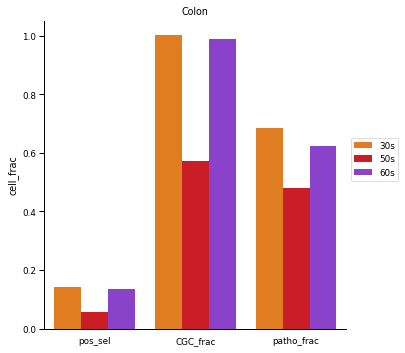

In [69]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_colon_frac = colon_frac.drop('decades', axis = 1)
long_form_colon = pd.melt(new_colon_frac)
decade = ['30s', '50s', '60s', '30s', '50s', '60s','30s', '50s', '60s']
long_form_colon['decade'] = decade
long_form_colon = long_form_colon.rename(columns = {'value':'cell_frac'})

long_form_colon.head(len(long_form_colon))

#Now I need to make a bar graph of this data

colors = ['#ff7c00', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_colon, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Colon')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/colon.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

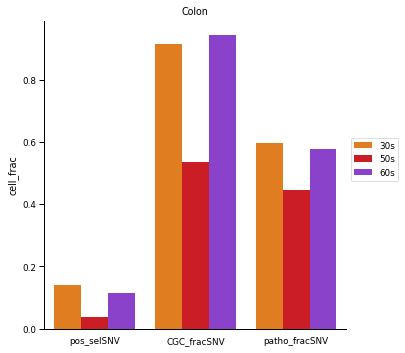

In [70]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_colon_fracSNV = colon_fracSNV.drop('decades', axis = 1)
long_form_colonSNV = pd.melt(new_colon_fracSNV)
decade = ['30s', '50s', '60s', '30s', '50s', '60s','30s', '50s', '60s']
long_form_colonSNV['decade'] = decade
long_form_colonSNV = long_form_colonSNV.rename(columns = {'value':'cell_frac'})

long_form_colonSNV.head(len(long_form_colonSNV))

#Now I need to make a bar graph of this data

colors = ['#ff7c00', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_colonSNV, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Colon')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/colonSNV.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

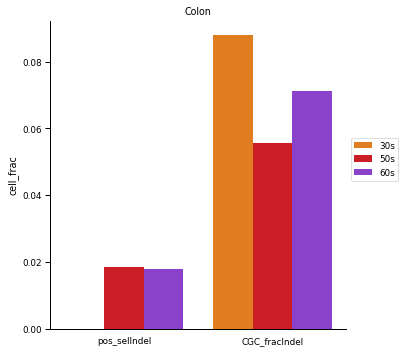

In [71]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_colon_fracIndel = colon_fracIndel.drop('decades', axis = 1)
long_form_colonIndel = pd.melt(new_colon_fracIndel)
decade = ['30s', '50s', '60s', '30s', '50s', '60s']
long_form_colonIndel['decade'] = decade
long_form_colonIndel = long_form_colonIndel.rename(columns = {'value':'cell_frac'})

long_form_colonIndel.head(len(long_form_colonIndel))

#Now I need to make a bar graph of this data

colors = ['#ff7c00', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_colonIndel, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Colon')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/colonIndel.jpg", format="jpg", bbox_inches="tight")

# Endometrium - WGS

<a id='endometrium'></a>

In [5]:

unwanted_snv_colums = [0, 2, 3, 8, 9, 11, 12, 13, 14, 130, ] + list(range( 17, 127)) #list of columns that I want to get rid of in the SNVs data frame
nums = [5, 7, 8, 9, 11, 13] #list of columns that I want to get rid of in the indel data frame
endom_snvs = pd.read_csv('Mutations_Paper/endometrium/endom_snvs.csv', sep = ',')
endom_snvs = endom_snvs.drop(endom_snvs.columns[unwanted_snv_colums], axis = 1) #removing unwanted columns
endom_indels = pd.read_csv('Mutations_Paper/endometrium/endom_indels.csv', sep = ',')
endom_indels = endom_indels.drop(endom_indels.columns[nums], axis = 1) #removing unwanted columns
endom_indels.insert(0, 'PatientID', endom_indels.Sample.str[0:7]) #This creates a patientID column

endom_snvs.columns = endom_snvs.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '').str.replace('-', '_')
endom_indels.columns = endom_indels.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '').str.replace('-', '_')

#Need to check for MNVs, which would need to be divided up into SNVs
samp_mnvs = endom_snvs[(endom_snvs.ref.str.len() != 1) & (endom_snvs.ref.str.len() == endom_snvs.alt.str.len())] #There are multi-nucleotide variants that need to be converted to SNVs
# There are no MNVs in these mutations; Thank the Lord.

##I need to assign decades to the patients; also, we need the number of samples in the decade of patients to divide the vafs
#This is for the indels
decades = []
num_samp_dec = []
for row in endom_indels.itertuples():
    if row[1] == 'PD37506' or row[1] == 'PD40535' or row[1] == 'PD41871' or row[1] == 'PD37605':
        decades.append('20s')
        num_samp_dec.append(43)
    elif row[1] == 'PD37601' or row[1] == 'PD41860' or row[1] == 'PD37607' or row[1] == 'PD41857' or \
    row[1] == 'PD39444' or row[1] == 'PD41865' or row[1] == 'PD41868' or row[1] == 'PD39953' or \
    row[1] == 'PD41859' or row[1] == 'PD37613' or row[1] == 'PD41861':
        decades.append('30s')
        num_samp_dec.append(93)
    elif row[1] == 'PD41869' or row[1] == 'PD37594' or row[1] == 'PD39952' or row[1] == 'PD39954' or \
    row[1] == 'PD37595' or row[1] == 'PD36804' or row[1] == 'PD36805':
        decades.append('40s')
        num_samp_dec.append(80)
    elif row[1] == 'PD38812':
        decades.append('50s')
        num_samp_dec.append(2)
    elif row[1] == 'PD37507' or row[1] == 'PD42746' or row[1] == 'PD40107':
        decades.append('60s')
        num_samp_dec.append(26)
    else:
        decades.append('70s')
        num_samp_dec.append(13)
endom_indels.insert(2, 'decades', decades)
endom_indels.insert(10, 'num_samp_dec', num_samp_dec)
endom_indels.insert(11, 'vaf_per_dec', endom_indels.vaf_tum/endom_indels.num_samp_dec)


#This is for the SNVs
decades = []
num_samp_dec = []
for row in endom_snvs.itertuples():
    if row[12] == 'PD37506' or row[12] == 'PD40535' or row[12] == 'PD41871' or row[12] == 'PD37605':
        decades.append('20s')
        num_samp_dec.append(43)
    elif row[12] == 'PD37601' or row[12] == 'PD41860' or row[12] == 'PD37607' or row[12] == 'PD41857' or \
    row[12] == 'PD39444' or row[12] == 'PD41865' or row[12] == 'PD41868' or row[12] == 'PD39953' or \
    row[12] == 'PD41859' or row[12] == 'PD37613' or row[12] == 'PD41861':
        decades.append('30s')
        num_samp_dec.append(93)
    elif row[12] == 'PD41869' or row[12] == 'PD37594' or row[12] == 'PD39952' or row[12] == 'PD39954' or \
    row[12] == 'PD37595' or row[12] == 'PD36804' or row[12] == 'PD36805':
        decades.append('40s')
        num_samp_dec.append(80)
    elif row[12] == 'PD38812':
        decades.append('50s')
        num_samp_dec.append(2)
    elif row[12] == 'PD37507' or row[12] == 'PD42746' or row[12] == 'PD40107':
        decades.append('60s')
        num_samp_dec.append(26)
    else:
        decades.append('70s')
        num_samp_dec.append(13)
endom_snvs.insert(1, 'decades', decades)
endom_snvs.insert(12, 'num_samp_dec', num_samp_dec)
endom_snvs.insert(13, 'vaf_per_dec', endom_snvs.newvaf/endom_snvs.num_samp_dec)




endom_snvs = endom_snvs.rename(columns = {'pos': 'start', 'chrom': 'chr', 'sec.hq.depth': 'depth', 'sec.hq.alt.depth': 'alt_depth', 'newvaf': 'vaf'}, errors = 'raise')
endom_indels = endom_indels.rename(columns = {'pos': 'start', 'chrom': 'chr', 'vaf_tum': 'vaf'}, errors = 'raise')

endom_all = pd.concat([endom_indels, endom_snvs], sort = False, ignore_index = True).sort_values(by = ['patientid', 'sample', 'chr', 'start'])

#There are a lot of mutations that are not in any gene at all (169,162 of them). Only need the mutations with an assigned gene
endom_gened = endom_all[endom_all.gene != '-']

#Get the cell_frac for each sample
cell_frac_per_samp = []
clonality = []
for row in endom_gened.itertuples():
    if row[10] >= 0.5:
        cell_frac_per_samp.append((1/row[10])*row[12]) #for VAFs above 0.5, the vaf_per_dec should be multiplied by a 1/vaf factor to achieve cellfrac_per_dec
        clonality.append('y')
    else:
        cell_frac_per_samp.append(2*row[12])
        clonality.append('n')
endom_gened.insert(12, 'cell_frac_per_dec', cell_frac_per_samp)
endom_gened['clonaity'] = clonality

print(len(endom_snvs), len(endom_indels), len(endom_all), len(endom_gened))

#endom_snvs.head()
#endom_indels.head(2000)
endom_gened.head(100)

/home/edward/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (4,114,115,116,117,118,119,120,121,122,123,124,125,126) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


307945 23585 331530 162368


/home/edward/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,patientid,sample,decades,chr,start,ref,alt,gene,type,vaf,num_samp_dec,vaf_per_dec,cell_frac_per_dec,effect,depth,alt_depth,clonaity
23585,PD36804,PD36804b_EM4_G3_E5,40s,1,2403681,G,A,PLCH2,Sub,0.285714,80,0.003571,0.007143,upstream,14.0,4.0,n
23587,PD36804,PD36804b_EM4_G3_E5,40s,1,6374676,G,A,ACOT7,Sub,0.285714,80,0.003571,0.007143,intronic,14.0,4.0,n
23588,PD36804,PD36804b_EM4_G3_E5,40s,1,29073838,C,T,YTHDF2,Sub,0.323529,80,0.004044,0.008088,intronic,34.0,11.0,n
23590,PD36804,PD36804b_EM4_G3_E5,40s,1,31187547,G,A,MATN1,Sub,0.148148,80,0.001852,0.003704,intronic,27.0,4.0,n
23591,PD36804,PD36804b_EM4_G3_E5,40s,1,32039241,G,A,TINAGL1,Sub,0.722222,80,0.009028,0.012500,upstream,18.0,13.0,y
23595,PD36804,PD36804b_EM4_G3_E5,40s,1,59898777,G,T,FGGY,Sub,0.333333,80,0.004167,0.008333,intronic,12.0,4.0,n
23596,PD36804,PD36804b_EM4_G3_E5,40s,1,61246204,T,A,RP11-436K8.1,Sub,0.357143,80,0.004464,0.008929,intronic,14.0,5.0,n
0,PD36804,PD36804b_EM4_G3_E5,40s,1,61734549,CATT,C,NFIA,Del,0.570000,80,0.007125,0.012500,NaN,NaN,NaN,y
23598,PD36804,PD36804b_EM4_G3_E5,40s,1,70880066,G,A,CTH,Sub,0.185185,80,0.002315,0.004630,intronic,27.0,5.0,n
23601,PD36804,PD36804b_EM4_G3_E5,40s,1,73302732,C,A,RP4-660H19.1,Sub,0.428571,80,0.005357,0.010714,intronic,14.0,6.0,n


In [8]:
#Coding exon mutations only

print('total mutations:', len(endom_gened))

endom_muts = endom_gened.rename(columns = {'start': 'Start'})
endom_muts['End'] = endom_muts.Start + 1
endom_muts['Chromosome'] = 'chr' + endom_muts.chr.astype('str')
endom_py = pr.PyRanges(df = endom_muts)
endom_exons = endom_py.overlap(hg19exon_regions)
endom_muts = endom_exons.as_df()
print('mutations in exons:', len(endom_muts))
endom_muts = endom_muts.rename(columns =  {'Start': 'start'})
endom_muts.head(len(endom_muts))

total mutations: 162368
mutations in exons: 4400


,patientid,sample,decades,chr,start,ref,alt,gene,type,vaf,num_samp_dec,vaf_per_dec,cell_frac_per_dec,effect,depth,alt_depth,clonaity,End,Chromosome
0,PD36804,PD36804b_EM4_G3_E5,40s,1,149922121,C,T,OTUD7B,Sub,0.333333,80,0.004167,0.008333,silent,21.0,7.0,n,149922122,chr1
1,PD36804,PD36804b_EM4_G3_E5,40s,1,202920122,T,C,ADIPOR1,Sub,0.347826,80,0.004348,0.008696,missense,23.0,8.0,n,202920123,chr1
2,PD36804,PD36804b_EMD_7_A1,40s,1,881816,C,G,NOC2L,Sub,0.214286,80,0.002679,0.005357,missense,28.0,6.0,n,881817,chr1
3,PD36804,PD36804b_EMD_7_A1,40s,1,28290179,G,T,XKR8,Sub,0.125000,80,0.001563,0.003125,missense,32.0,4.0,n,28290180,chr1
4,PD36804,PD36804b_EMD_7_A1,40s,1,86196271,T,C,COL24A1,Sub,0.189189,80,0.002365,0.004730,silent,37.0,7.0,n,86196272,chr1
5,PD36804,PD36804b_EMD_7_A1,40s,1,152277328,C,T,FLG,Sub,0.307692,80,0.003846,0.007692,missense,39.0,12.0,n,152277329,chr1
6,PD36804,PD36804b_EMD_7_A5,40s,1,1573224,C,T,MMP23B,Sub,0.592593,80,0.007407,0.012500,downstream,27.0,16.0,y,1573225,chr1
7,PD36804,PD36804b_EMD_7_A6,40s,1,46499545,G,A,MAST2,Sub,0.600000,80,0.007500,0.012500,silent,25.0,15.0,y,46499546,chr1
8,PD36804,PD36804b_EMD_7_C2,40s,1,26386782,A,C,TRIM63,Sub,0.314286,80,0.003929,0.007857,missense,35.0,11.0,n,26386783,chr1
9,PD36804,PD36804b_EMD_7_C2,40s,1,155258058,G,A,HCN3,Sub,0.393939,80,0.004924,0.009848,missense,33.0,13.0,n,155258059,chr1


In [10]:
#endom_muts.insert(6, 'change', endom_muts.ref + '>' + endom_muts.alt)
wgs_merge = pd.merge(endom_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
wgs_merge = wgs_merge[(wgs_merge.fathmm_prediction == 'PATHOGENIC')]

endom_decade = endom_muts.groupby('decades').count()
endom_count = endom_decade.start

wgs_decade = wgs_merge.groupby('decades').count()
wgs_count = wgs_decade.start

print(len(wgs_merge))


print(endom_count.sum())
print(wgs_count)

139
4400
decades
20s    10
30s    45
40s    33
60s    34
70s    17
Name: start, dtype: int64


In [12]:
print(endom_count)

decades
20s    425 
30s    1335
40s    1560
50s    61  
60s    695 
70s    324 
Name: start, dtype: int64


In [13]:
#For indels, get # of indels in CGC genes/total indels in each group
endom_indel = endom_muts[endom_muts.type != 'Sub']

endom_count = endom_indel.groupby('decades').count()
indel_count = endom_count.start

endom_CGC = endom_indel[endom_indel.gene.isin(CGC_genes)].groupby('decades').count()
CGC_count = endom_CGC.start

print(len(endom_indel))
print(indel_count, CGC_count.sum())

259
decades
20s    21 
30s    105
40s    79 
50s    2  
60s    37 
70s    15 
Name: start, dtype: int64 48


In [15]:
print(CGC_count)

decades
20s    4 
30s    16
40s    13
50s    1 
60s    10
70s    4 
Name: start, dtype: int64


In [22]:
#We need the mutations in positively selected for genes

##I deleted endo_pos_genes by accident. Go back to the paper and 

tissue_pos = endom_muts[endom_muts.gene.isin(endo_pos_genes)].sort_values(by = ['sample', 'vaf'])

tissue_posSNV = tissue_pos[(tissue_pos.type == 'Sub')]
tissue_posIndel = tissue_pos[(tissue_pos.type != 'Sub')]

print(len(tissue_pos), len(tissue_posSNV)+ len(tissue_posIndel))

tissue_pos = tissue_pos.drop_duplicates(subset = 'sample', keep = 'last')
tissue_posSNV = tissue_posSNV.drop_duplicates(subset = 'sample', keep = 'last')
tissue_posIndel = tissue_posIndel.drop_duplicates(subset = 'sample', keep = 'last')

dec_vaftot = tissue_pos.groupby('decades')['cell_frac_per_dec'].sum()
dec_vaftotSNV = tissue_posSNV.groupby('decades')['cell_frac_per_dec'].sum()
dec_vaftotIndel = tissue_posIndel.groupby('decades')['cell_frac_per_dec'].sum()

dec_vaftot = pd.DataFrame(dec_vaftot)
dec_vaftotSNV = pd.DataFrame(dec_vaftotSNV)
dec_vaftotIndel = pd.DataFrame(dec_vaftotIndel)


print(dec_vaftot)
print(dec_vaftotSNV)
print(dec_vaftotIndel)

pos_sel = []
pos_selSNV = []
pos_selIndel = []

for row in dec_vaftot.itertuples():
    pos_sel.append(row[1])
for row in dec_vaftotSNV.itertuples():
    pos_selSNV.append(row[1])
for row in dec_vaftotIndel.itertuples():
    pos_selIndel.append(row[1])
pos_selIndel.insert(4, 0)

decades = ['<30', '30s', '40s', '60s', r'$\geq$70']

tissue_frac = pd.DataFrame()
tissue_fracSNV = pd.DataFrame()
tissue_fracIndel = pd.DataFrame()

tissue_frac['decades'] = decades
tissue_fracSNV['decades'] = decades
tissue_fracIndel['decades'] = decades

tissue_frac['pos_sel'] = pos_sel
tissue_fracSNV['pos_selSNV'] = pos_selSNV
tissue_fracIndel['pos_selIndel'] = pos_selIndel

print(len(endom_muts), len(tissue_pos))

#tissue_muts.head(3760)
dec_vaftot.head(len(dec_vaftot))
tissue_fracIndel.head(len(tissue_frac))

149 149
         cell_frac_per_dec
decades                   
20s      0.089345         
30s      0.391017         
40s      0.374036         
60s      0.732673         
70s      0.744872         
         cell_frac_per_dec
decades                   
20s      0.067272         
30s      0.286277         
40s      0.324642         
60s      0.623232         
70s      0.744872         
         cell_frac_per_dec
decades                   
20s      0.028488         
30s      0.119617         
40s      0.071000         
60s      0.336492         
4400 116


,decades,pos_selIndel
0,<30,0.028488
1,30s,0.119617
2,40s,0.071000
3,60s,0.336492
4,$\geq$70,0.000000


In [27]:
#Now, we are getting CGC mutations and CGC patho

#I need to separate the indels from the SNVs and determine which ones are in the CGC

tissue_indels = endom_muts[(endom_muts.type != 'Sub') & (endom_muts.decades != '50s')].sort_values(by = ['sample', 'vaf']) #These are just the indels
tissue_snvs = endom_muts[endom_muts.type == 'Sub'].sort_values(by = ['sample', 'vaf']) #These are just the SNVS
tissue_snvs.insert(7, 'change', tissue_snvs.ref + '>' + tissue_snvs.alt)

print(len(endom_muts), len(tissue_indels)+len(tissue_snvs))

#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change']).sort_values(by = ['decades', 'sample'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'].sort_values(by = ['decades', 'sample', 'vaf']) #These are the pathogenic SNVs

#get the indels that are in CGC genes and concatenate with the CGC and patho snvs
tissue_CGC_indels = tissue_indels[tissue_indels.gene.isin(CGC_genes)]

tissue_CGC_total = pd.concat([tissue_CGC_merge, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample']) 
tissue_patho_total = pd.concat([tissue_patho_snvs, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sample'])

tissue_CGC_total = tissue_CGC_total.drop_duplicates(subset = ['patientid', 'sample'], keep = 'last')
tissue_patho_total = tissue_patho_total.drop_duplicates(subset = ['patientid', 'sample'], keep = 'last')
tissue_CGC_merge = tissue_CGC_merge.drop_duplicates(subset = ['patientid', 'sample'], keep = 'last')
tissue_patho_snvs = tissue_patho_snvs.drop_duplicates(subset = ['patientid', 'sample'], keep = 'last')
tissue_CGC_indels = tissue_CGC_indels.drop_duplicates(subset = ['patientid', 'sample'], keep = 'last')

CGC_frac = tissue_CGC_total.groupby('decades')['cell_frac_per_dec'].sum()
patho_frac = tissue_patho_total.groupby('decades')['cell_frac_per_dec'].sum()
CGC_fracSNV = tissue_CGC_merge.groupby('decades')['cell_frac_per_dec'].sum()
CGC_fracSNVpatho = tissue_patho_snvs.groupby('decades')['cell_frac_per_dec'].sum()
CGC_fracIndel = tissue_CGC_indels.groupby('decades')['cell_frac_per_dec'].sum()

CGC_frac = pd.DataFrame(CGC_frac)
patho_frac = pd.DataFrame(patho_frac)
CGC_fracSNV = pd.DataFrame(CGC_fracSNV)
CGC_fracSNVpatho = pd.DataFrame(CGC_fracSNVpatho)
CGC_fracIndel = pd.DataFrame(CGC_fracIndel)


print(CGC_frac)
print(patho_frac)
print(CGC_fracSNV)
print(CGC_fracSNVpatho)
print(CGC_fracIndel)

##Get the cell_fracs
tissue_CGC_frac = [] #lists for cell_fracs
tissue_patho_frac = []
tissue_CGC_fracSNV = []
tissue_CGC_fracSNVpatho = []
tissue_CGC_fracIndel = []

#get cell_fracs
for row in CGC_frac.itertuples():
    tissue_CGC_frac.append(row[1])
for row in patho_frac.itertuples():
    tissue_patho_frac.append(row[1])
for row in CGC_fracSNV.itertuples():
    tissue_CGC_fracSNV.append(row[1])
for row in CGC_fracSNVpatho.itertuples():
    tissue_CGC_fracSNVpatho.append(row[1])
for row in CGC_fracIndel.itertuples():
    tissue_CGC_fracIndel.append(row[1])
    
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac

tissue_fracSNV['CGC_fracSNV'] = tissue_CGC_fracSNV
tissue_fracSNV['patho_fracSNV'] = tissue_CGC_fracSNVpatho

tissue_fracIndel['CGC_fracIndel'] = tissue_CGC_fracIndel

#tissue_indels.head(len(tissue_indels))
tissue_frac.head(len(tissue_frac))
tissue_fracSNV.head()
tissue_fracIndel.head()

4400 4398
         cell_frac_per_dec
decades                   
20s      0.249019         
30s      0.537126         
40s      0.405715         
60s      0.788660         
70s      0.859021         
         cell_frac_per_dec
decades                   
20s      0.238738         
30s      0.477840         
40s      0.390320         
60s      0.794379         
70s      0.860769         
         cell_frac_per_dec
decades                   
20s      0.206126         
30s      0.400915         
40s      0.315297         
60s      0.667110         
70s      0.820047         
         cell_frac_per_dec
decades                   
20s      0.195845         
30s      0.341629         
40s      0.294220         
60s      0.681691         
70s      0.821795         
         cell_frac_per_dec
decades                   
20s      0.042893         
30s      0.140819         
40s      0.108600         
60s      0.301877         
70s      0.187692         


,decades,pos_selIndel,CGC_fracIndel
0,<30,0.028488,0.042893
1,30s,0.119617,0.140819
2,40s,0.071000,0.108600
3,60s,0.336492,0.301877
4,$\geq$70,0.000000,0.187692


In [28]:
endom_frac = tissue_frac
endom_fracSNV = tissue_fracSNV
endom_fracIndel = tissue_fracIndel

<Figure size 432x288 with 0 Axes>

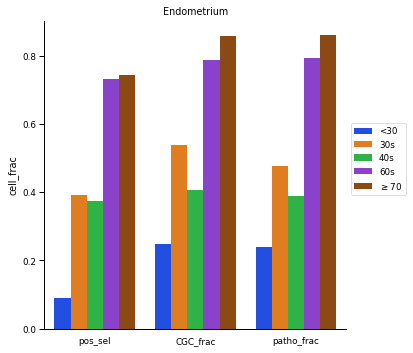

In [31]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_endom_frac = endom_frac.drop('decades', axis = 1)
long_form_endom = pd.melt(new_endom_frac)
decade = ['<30', '30s', '40s', '60s', r'$\geq$70', '<30', '30s', '40s', '60s', r'$\geq$70', '<30', '30s', '40s', '60s', r'$\geq$70']
long_form_endom['decade'] = decade
long_form_endom = long_form_endom.rename(columns = {'value':'cell_frac'})

long_form_endom.head(len(long_form_endom))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_endom, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Endometrium')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/endometrium.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

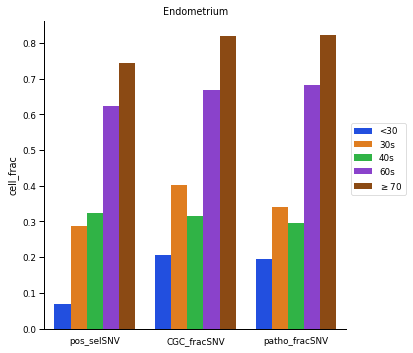

In [32]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_endom_fracSNV = endom_fracSNV.drop('decades', axis = 1)
long_form_endomSNV = pd.melt(new_endom_fracSNV)
decade = ['<30', '30s', '40s', '60s', r'$\geq$70', '<30', '30s', '40s', '60s', r'$\geq$70', '<30', '30s', '40s', '60s', r'$\geq$70']
long_form_endomSNV['decade'] = decade
long_form_endomSNV = long_form_endomSNV.rename(columns = {'value':'cell_frac'})

long_form_endomSNV.head(len(long_form_endomSNV))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_endomSNV, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Endometrium')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/endometriumSNV.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

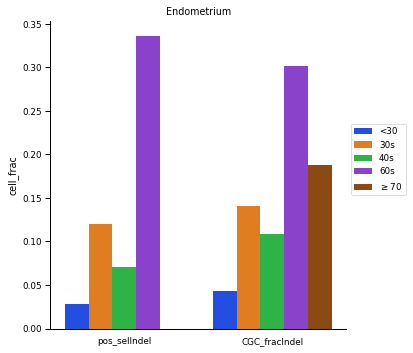

In [33]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_endom_fracIndel = endom_fracIndel.drop('decades', axis = 1)
long_form_endomIndel = pd.melt(new_endom_fracIndel)
decade = ['<30', '30s', '40s', '60s', r'$\geq$70', '<30', '30s', '40s', '60s', r'$\geq$70']
long_form_endomIndel['decade'] = decade
long_form_endomIndel = long_form_endomIndel.rename(columns = {'value':'cell_frac'})

long_form_endomIndel.head(len(long_form_endomIndel))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_endomIndel, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Endometrium')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/endometriumIndel.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

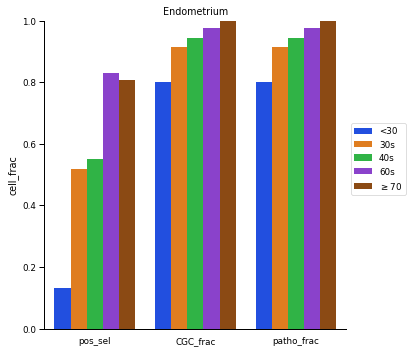

In [82]:
#Make the long_form and then plot it

#I need to get the data in a format such that it can be plotted (long-form)

new_endom_frac = endom_frac.drop('decade', axis = 1)
long_form_endom = pd.melt(new_endom_frac)
decade = ['<30', '30s', '40s', '60s', r'$\geq$70', '<30', '30s', '40s', '60s', r'$\geq$70', '<30', '30s', '40s', '60s', r'$\geq$70']
long_form_endom['decade'] = decade
long_form_endom = long_form_endom.rename(columns = {'value':'cell_frac'})

long_form_endom.head(len(long_form_endom))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_endom, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Endometrium')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/endometrium.jpg", format="jpg", bbox_inches="tight")

# Esophagus - Targeted Sequencing

<a id='esophagus'></a>

In [26]:
#Let's doctor up the spreadsheet of original mutations

all_muts = pd.read_excel('Mutations_Paper/esophagus/original_muts.xlsx', header = 16) #data starts at the 17th row
del all_muts['pid'] #delete this useless column
del all_muts['qval'] #and this useless column
all_muts.insert(0, 'patient', all_muts.sampleID.str[0:7]) #create a column for the patient names
all_muts.insert(6, 'change', all_muts.ref + '>' + all_muts.mut) #create a change column for when crossing with the CGC
all_muts = all_muts.rename(columns = {'pos': 'start', 'mut': 'alt'}) #need to change the names of these columns to be congruent with other code and crossing with CGC

## We need to get the MNVs converted to SNVs
samp_mnvs = all_muts[(all_muts.ref.str.len() != 1) & (all_muts.ref.str.len() == all_muts.alt.str.len()) & (all_muts.alt != 'INS')] #There are multi-nucleotide variants that need to be converted to SNVs

#Remove the MNVs from the all_muts dataframe; concatenate the converted MNVs later
mnvs_indices = []
for row in samp_mnvs.itertuples():
    mnvs_indices.append(row[0])
nomnvs = all_muts.drop(index = mnvs_indices)

#This is the code that turns the MNVS into SNVs that can be cross-references with CGC mutations.

refs = []
#This is the code that will be used to get the ref nucleotides from MNVs
for i in samp_mnvs.ref:
    for j in range(0, len(i)):
        refs.append(i[j])

alts = []
#This is the code that will be used to get the alt nucleotides from MNVs
for i in samp_mnvs.alt:
    for j in range(0, len(i)):
        alts.append(i[j])

#This gives the number of times a MNV needs to be in the dataframe to turn them in to SNVs
duplicates = []
for i in samp_mnvs.ref:
    duplicates.append(len(i))

#Get the numbers that must be added to the 'start' genomic locations for them to be SNVs
addends = []
for i in samp_mnvs.ref:
    for j in range(0, len(i)):
        addends.append(j)

# Get the genomic locations for each of the SNVs that are borne out of the MNVs
starts = list(np.repeat(samp_mnvs.start.values, duplicates, axis = 0)) #This makes a list of of the start positions in the MNV dataframe that are duplicated the number of times needed to make the MNVs into SNVs
start = [a + b for a,b in zip(starts, addends)] #This is comprehension form, but it gets the sum of the addends with the start position for the MNVs to yield start positions for each SNV

# Make the dataframe
samp_mnvs2 = pd.DataFrame(np.repeat(samp_mnvs.values, duplicates, axis = 0), columns = samp_mnvs.columns) #This makes the dataframe with mnvs entries but the entries are duplicated to convert the MNVs to SNVs
samp_mnvs2.ref = refs #Single nucleotide reference
samp_mnvs2.alt = alts #variant nucleotides
samp_mnvs2.start = start #genomic positions of SNV

#MNVs are just variants that are somewhat close to each other. Therefore, there are some 'SNVs' in the resulting dataframe where ref and alt are the same. We can drop those.
#samp_mnvs2.drop([samp_mnvs2.ref.values == samp_mnvs2.alt.values])
#32 'mutations' in the MNVs were simply trapped between nucleotide changes and weren't actual mutations.
non_snvs = []
for row in samp_mnvs2.itertuples():
    if row[5] == row[6]:
        non_snvs.append((row[0]))
        
for i in non_snvs:
    samp_mnvs2.drop(i, inplace = True)

#We need 'change' to reflect the new SNVs
del samp_mnvs2['change']
samp_mnvs2.insert(6, 'change', samp_mnvs2.ref + '>' + samp_mnvs2.alt)

#Concatenate the single nucleotides with the SNVs from the MNVs
samp_snvs = pd.concat([nomnvs, samp_mnvs2], sort = False, ignore_index = True).sort_values(by = ['patient', 'sampleID', 'chr', 'start'])

#Make a vaf_new column, dividing the NOTCH1 and TP53 VAFs by 2 in acknowledgment that they are in clones
new_vaf = []
for row in samp_snvs.itertuples():
    if row[9] == 'TP53' or row[9] == 'NOTCH1':
        new_vaf.append(row[8]/2)
    else:
        new_vaf.append(row[8])
samp_snvs.insert(8, 'vaf_new', new_vaf)

#Assign the mutations to the deacade of the patient, so they can be group accordingly
decades = []
num_samps = []
for row in samp_snvs.itertuples():
    if row[1] == 'PD36806' or row[1] == 'PD36712':
        decades.append('20s')
        num_samps.append(84+93)
    elif row[1] == 'PD30272':
        decades.append('30s')
        num_samps.append(96)
    elif row[1] == 'PD30986' or row[1] == 'PD30987': #PD30987 is aged from 48-51; not sure which decade
        decades.append('40s')
        num_samps.append(94+95)
    elif row[1] == 'PD30274' or row[1] == 'PD30988':
        decades.append('50s')
        num_samps.append(98+95)
    elif row[1] == 'PD30273':
        decades.append('60s')
        num_samps.append(95)
    else:
        decades.append('70s')
        num_samps.append(94)
samp_snvs.insert(2, 'decades', decades)
samp_snvs.insert(10, 'num_samps', num_samps)
samp_snvs.insert(11, 'vaf_dec', samp_snvs.vaf_new/samp_snvs.num_samps)
 
#all_muts.head()
print(len(all_muts), len(samp_mnvs), len(nomnvs), len(samp_mnvs2), len(samp_snvs))
samp_snvs.head()

8919 77 8842 154 8996


,patient,sampleID,decades,chr,start,ref,alt,change,vaf,vaf_new,num_samps,vaf_dec,gene,impact,aachange,ntchange
2,PD30272,PD30272ab,30s,4,187525620,T,A,T>A,0.00647668,0.006477,96,0.000067,FAT1,Nonsense,K3487*,A10459T
0,PD30272,PD30272ab,30s,12,46125027,A,G,A>G,0.01221,0.012210,96,0.000127,ARID2,Missense,I72V,A214G
1,PD30272,PD30272ab,30s,12,47629520,T,G,T>G,0.00421941,0.004219,96,0.000044,PCED1B,Missense,L225R,T674G
8842,PD30272,PD30272ab,30s,17,37864636,G,A,G>A,0.0238355,0.023835,96,0.000248,ERBB2,no-SNV,.,.
8843,PD30272,PD30272ab,30s,17,37864637,C,T,C>T,0.0238355,0.023835,96,0.000248,ERBB2,no-SNV,.,.


In [27]:
esoph_muts = samp_snvs

print('total mutations:', len(esoph_muts))
esoph_muts = esoph_muts.rename(columns = {'start': 'Start'})
esoph_muts['End'] = esoph_muts.Start + 1
esoph_muts['Chromosome'] = 'chr' + esoph_muts.chr.astype('str')
esoph_py = pr.PyRanges(df = esoph_muts)
esoph_exons = esoph_py.overlap(hg19exon_regions)
esoph_muts = esoph_exons.as_df()
print('mutations in exons:', len(esoph_muts))
esoph_muts = esoph_muts.rename(columns =  {'Start': 'start'})

total mutations: 8996
mutations in exons: 8648


In [58]:
#For SNVs, get # pathogenic mutations/SNVs detected for each age group
wgs_merge = pd.merge(esoph_muts, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change'])
wgs_merge = wgs_merge[wgs_merge.fathmm_prediction == 'PATHOGENIC']

esoph_decade = esoph_muts[(esoph_muts.alt != 'INS') & (esoph_muts.alt != '-')].groupby('decades').count()
esoph_count = esoph_decade.sampleID

wgs_decade = wgs_merge.groupby('decades').count()
wgs_count = wgs_decade.sampleID

print(esoph_count)
print(wgs_count)

decades
20s    525 
30s    344 
40s    1770
50s    1853
60s    1047
70s    1079
Name: sampleID, dtype: int64
decades
20s    99 
30s    64 
40s    596
50s    535
60s    377
70s    430
Name: sampleID, dtype: int64


In [73]:
#For indels, get # of indels in CGC genes/total indels in each group
esoph_ins = esoph_muts[esoph_muts.alt == 'INS']
esoph_del = esoph_muts[esoph_muts.alt == '-']

esoph_indel = pd.concat([esoph_ins, esoph_del])
esoph_count = esoph_indel.groupby('decades').count()
indel_count = esoph_count.sampleID

esoph_CGC = esoph_indel[esoph_indel.gene.isin(CGC_genes)].groupby('decades').count()
CGC_count = esoph_CGC.sampleID

print(len(esoph_ins), len(esoph_del))
print(indel_count, CGC_count)

590 1440
decades
20s    176
30s    75 
40s    513
50s    468
60s    402
70s    396
Name: sampleID, dtype: int64 decades
20s    135
30s    58 
40s    457
50s    384
60s    365
70s    370
Name: sampleID, dtype: int64


In [24]:
# Now, we need to get the the positively selected genes and sum the VAFs in decades

#These are the genes under positive selection
pos_genes = ['NOTCH1', 'TP53', 'NOTCH2', 'FAT1', 'NOTCH3', 'ARID1A', 'KMT2D', 'CUL3', 
         'AJUBA', 'PIK3CA', 'ARID2', 'TP63', 'NFE2L2', 'CCND1']


tissue_pos = esoph_muts[esoph_muts.gene.isin(pos_genes)]

tissue_posSNV = tissue_pos[(tissue_pos.alt != 'INS') & (tissue_pos.alt != '-')]

indel_indices = []
for row in tissue_pos.itertuples():
    if row[7] == '-' or row[7] == 'INS':
        indel_indices.append(row[0])
tissue_posIndel = tissue_pos.loc[indel_indices]

print(len(tissue_pos), len(tissue_posSNV)+ len(tissue_posIndel))

dec_vaftot = tissue_pos.groupby('decades')['vaf_dec'].sum()*2
dec_vaftotSNV = tissue_posSNV.groupby('decades')['vaf_dec'].sum()*2
dec_vaftotIndel = tissue_posIndel.groupby('decades')['vaf_dec'].sum()*2

dec_vaftot = pd.DataFrame(dec_vaftot)
dec_vaftotSNV = pd.DataFrame(dec_vaftotSNV)
dec_vaftotIndel = pd.DataFrame(dec_vaftotIndel)


print(dec_vaftot)
print(dec_vaftotSNV)
print(dec_vaftotIndel)

pos_sel = []
pos_selSNV = []
pos_selIndel = []

for row in dec_vaftot.itertuples():
    pos_sel.append(row[1])
for row in dec_vaftotSNV.itertuples():
    pos_selSNV.append(row[1])
for row in dec_vaftotIndel.itertuples():
    pos_selIndel.append(row[1])

decades = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70']

tissue_frac = pd.DataFrame()
tissue_fracSNV = pd.DataFrame()
tissue_fracIndel = pd.DataFrame()

tissue_frac['decades'] = decades
tissue_fracSNV['decades'] = decades
tissue_fracIndel['decades'] = decades

tissue_frac['pos_sel'] = pos_sel
tissue_fracSNV['pos_selSNV'] = pos_selSNV
tissue_fracIndel['pos_selIndel'] = pos_selIndel

print(len(esoph_muts), len(tissue_pos))

#tissue_muts.head(3760)
dec_vaftot.head(len(dec_vaftot))
tissue_fracIndel.head(len(tissue_frac))

6078 6078
          vaf_dec
decades          
20s      0.079369
30s      0.058681
40s      0.439298
50s      0.532038
60s      0.624923
70s      0.843666
          vaf_dec
decades          
20s      0.066450
30s      0.045196
40s      0.344859
50s      0.421270
60s      0.448320
70s      0.613713
          vaf_dec
decades          
20s      0.012919
30s      0.013485
40s      0.094439
50s      0.110768
60s      0.176603
70s      0.229953
8648 6078


,decades,pos_selIndel
0,<30,0.012919
1,30s,0.013485
2,40s,0.094439
3,50s,0.110768
4,60s,0.176603
5,$\geq$70,0.229953


In [27]:
##Now we need to cross the mutations with mutations in the CGC and CGC patho

#I need to separate the indels from the SNVs and determine which ones are in the CGC
indel_indices = []
for row in samp_snvs.itertuples():
    if row[7] == '-' or row[7] == 'INS':
        indel_indices.append(row[0])
tissue_indels = samp_snvs.loc[indel_indices] #These are just the indels
tissue_snvs = pd.concat([samp_snvs, tissue_indels]).drop_duplicates(keep = False) #These are just the SNVS

print(len(samp_snvs), len(tissue_indels)+len(tissue_snvs))

#Merge the SNVs with CGC and patho
tissue_CGC_merge = pd.merge(tissue_snvs, cosmic19_snvsLight, how = 'inner', on = ['gene', 'start', 'change']).sort_values(by = ['decades', 'sampleID'])#These are the SNVs in the CGC
tissue_patho_snvs = tissue_CGC_merge[tissue_CGC_merge.fathmm_prediction == 'PATHOGENIC'].sort_values(by = ['decades', 'sampleID', 'vaf']) #These are the pathogenic SNVs

#get the indels that are in CGC genes and concatenate with the CGC and patho snvs
tissue_CGC_indels = tissue_indels[tissue_indels.gene.isin(CGC_genes)]

tissue_CGC_total = pd.concat([tissue_CGC_merge, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sampleID']) 
tissue_patho_total = pd.concat([tissue_patho_snvs, tissue_CGC_indels], sort = False).sort_values(by = ['decades', 'sampleID'])

CGC_frac = tissue_CGC_total.groupby('decades')['vaf_dec'].sum()*2
patho_frac = tissue_patho_total.groupby('decades')['vaf_dec'].sum()*2
CGC_fracSNV = tissue_CGC_merge.groupby('decades')['vaf_dec'].sum()*2
CGC_fracSNVpatho = tissue_patho_snvs.groupby('decades')['vaf_dec'].sum()*2
CGC_fracIndel = tissue_CGC_indels.groupby('decades')['vaf_dec'].sum()*2

CGC_frac = pd.DataFrame(CGC_frac)
patho_frac = pd.DataFrame(patho_frac)
CGC_fracSNV = pd.DataFrame(CGC_fracSNV)
CGC_fracSNVpatho = pd.DataFrame(CGC_fracSNVpatho)
CGC_fracIndel = pd.DataFrame(CGC_fracIndel)


print(CGC_frac)
print(patho_frac)
print(CGC_fracSNV)
print(CGC_fracSNVpatho)
print(CGC_fracIndel)

##Get the cell_fracs
tissue_CGC_frac = [] #lists for cell_fracs
tissue_patho_frac = []
tissue_CGC_fracSNV = []
tissue_CGC_fracSNVpatho = []
tissue_CGC_fracIndel = []

#get cell_fracs
for row in CGC_frac.itertuples():
    tissue_CGC_frac.append(row[1])
for row in patho_frac.itertuples():
    tissue_patho_frac.append(row[1])
for row in CGC_fracSNV.itertuples():
    tissue_CGC_fracSNV.append(row[1])
for row in CGC_fracSNVpatho.itertuples():
    tissue_CGC_fracSNVpatho.append(row[1])
for row in CGC_fracIndel.itertuples():
    tissue_CGC_fracIndel.append(row[1])
    
tissue_frac['CGC_frac'] = tissue_CGC_frac
tissue_frac['patho_frac'] = tissue_patho_frac

tissue_fracSNV['CGC_fracSNV'] = tissue_CGC_fracSNV
tissue_fracSNV['patho_fracSNV'] = tissue_CGC_fracSNVpatho

tissue_fracIndel['CGC_fracIndel'] = tissue_CGC_fracIndel

#tissue_indels.head(len(tissue_indels))
tissue_frac.head(len(tissue_frac))
tissue_fracSNV.head()
tissue_fracIndel.head()

8996 8996
          vaf_dec
decades          
20s      0.047168
30s      0.034039
40s      0.281361
50s      0.331402
60s      0.474771
70s      0.590193
          vaf_dec
decades          
20s      0.044913
30s      0.030863
40s      0.270846
50s      0.321519
60s      0.456381
70s      0.571863
          vaf_dec
decades          
20s      0.033043
30s      0.024349
40s      0.185176
50s      0.219721
60s      0.291749
70s      0.368777
          vaf_dec
decades          
20s      0.030787
30s      0.021173
40s      0.174661
50s      0.209838
60s      0.273360
70s      0.350447
          vaf_dec
decades          
20s      0.014126
30s      0.009690
40s      0.096184
50s      0.111682
60s      0.183022
70s      0.221415


,decades,pos_selIndel,CGC_fracIndel
0,<30,0.012919,0.014126
1,30s,0.013485,0.009690
2,40s,0.094439,0.096184
3,50s,0.110768,0.111682
4,60s,0.176603,0.183022


In [28]:
esoph_frac = tissue_frac
esoph_fracSNV = tissue_fracSNV
esoph_fracIndel = tissue_fracIndel

<Figure size 432x288 with 0 Axes>

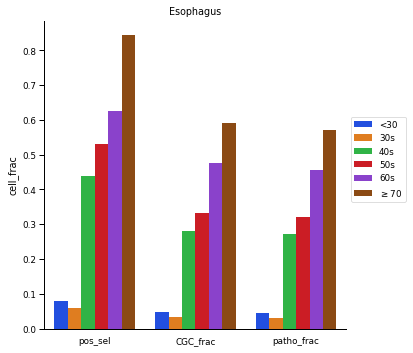

In [32]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_esoph_frac = esoph_frac.drop('decades', axis = 1)
long_form_esoph = pd.melt(new_esoph_frac)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_esoph['decade'] = decade
long_form_esoph = long_form_esoph.rename(columns = {'value':'cell_frac'})

long_form_esoph.head(len(long_form_esoph))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_esoph, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Esophagus')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/esophagus.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

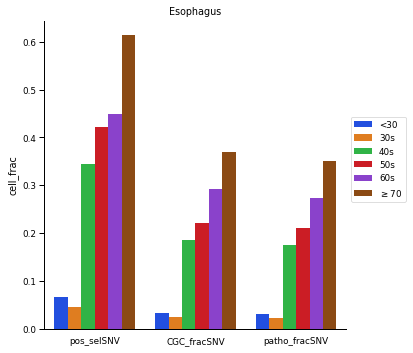

In [33]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_esoph_fracSNV = esoph_fracSNV.drop('decades', axis = 1)
long_form_esophSNV = pd.melt(new_esoph_fracSNV)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_esophSNV['decade'] = decade
long_form_esophSNV = long_form_esophSNV.rename(columns = {'value':'cell_frac'})

long_form_esophSNV.head(len(long_form_esophSNV))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_esophSNV, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Esophagus')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/esophagusSNV.jpg", format="jpg", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

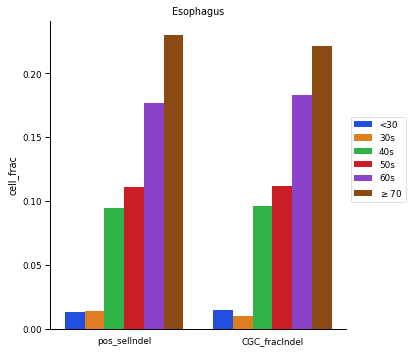

In [35]:
#I need to get the data in a format such that it can be plotted (long-form) and then plot it

new_esoph_fracIndel = esoph_fracIndel.drop('decades', axis = 1)
long_form_esophIndel = pd.melt(new_esoph_fracIndel)
decade = ['<30', '30s', '40s', '50s', '60s', r'$\geq$70', '<30', '30s', '40s', '50s', '60s', r'$\geq$70']
long_form_esophIndel['decade'] = decade
long_form_esophIndel = long_form_esophIndel.rename(columns = {'value':'cell_frac'})

long_form_esophIndel.head(len(long_form_esophIndel))

#Now I need to make a bar graph of this data

colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#8b2be2', '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']


sns.set_context('paper')
plt.figure()
sns.catplot(x='variable', y='cell_frac', hue = 'decade', data = long_form_esophIndel, kind = "bar", legend = False, palette = colors)
plt.tick_params(axis = 'x', bottom=False, labelrotation = 0)
plt.title('Esophagus')
#sns.despine(offset=10, trim=True, bottom=True)
plt.xlabel('')
#plt.ylim(0, 1)
#plt.yticks(np.arange(0, 0.001, step = 0.0002))
plt.legend(loc='center left', bbox_to_anchor=(1.00, 0.55))
#plt.yscale('log')
plt.savefig("Mutations_Paper/esophagusIndel.jpg", format="jpg", bbox_inches="tight")